### Overview of Problem Statement

##### The Online News Popularity dataset, contains features extracted from online news articles and aims to predict the number of shares (popularity) an article will receive. The goal is to build a model to predict whether an article will go viral based on a wide range of features extracted from the content of the article.

### Objecive

##### Given a set of features about news articles published online, the task is to predict their popularity (in terms of shares).This prediction can help content creators, news websites, and marketers to understand which factors contribute most to an article's popularity and guide them in crafting content that maximizes reader engagement.

### Data Description
#### Source: UCI Machine Learning Repository
#### Number of Instances: 39,644
#### Number of Attributes (Columns): 61
#### 1 target variable: shares¶

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [7]:
dataset = pd.read_csv("OnlineNewsPopularity.csv")
df = pd.DataFrame(dataset)

In [8]:
df

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,...,0.100000,0.70,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,...,0.033333,0.70,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,...,0.100000,1.00,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,...,0.136364,0.80,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,...,0.033333,1.00,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39639,http://mashable.com/2014/12/27/samsung-app-aut...,8.0,11.0,346.0,0.529052,1.0,0.684783,9.0,7.0,1.0,...,0.100000,0.75,-0.260000,-0.500,-0.125000,0.100000,0.000000,0.400000,0.000000,1800
39640,http://mashable.com/2014/12/27/seth-rogen-jame...,8.0,12.0,328.0,0.696296,1.0,0.885057,9.0,7.0,3.0,...,0.136364,0.70,-0.211111,-0.400,-0.100000,0.300000,1.000000,0.200000,1.000000,1900
39641,http://mashable.com/2014/12/27/son-pays-off-mo...,8.0,10.0,442.0,0.516355,1.0,0.644128,24.0,1.0,12.0,...,0.136364,0.50,-0.356439,-0.800,-0.166667,0.454545,0.136364,0.045455,0.136364,1900
39642,http://mashable.com/2014/12/27/ukraine-blasts/,8.0,6.0,682.0,0.539493,1.0,0.692661,10.0,1.0,1.0,...,0.062500,0.50,-0.205246,-0.500,-0.012500,0.000000,0.000000,0.500000,0.000000,1100


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   url                             39644 non-null  object 
 1    timedelta                      39644 non-null  float64
 2    n_tokens_title                 39644 non-null  float64
 3    n_tokens_content               39644 non-null  float64
 4    n_unique_tokens                39644 non-null  float64
 5    n_non_stop_words               39644 non-null  float64
 6    n_non_stop_unique_tokens       39644 non-null  float64
 7    num_hrefs                      39644 non-null  float64
 8    num_self_hrefs                 39644 non-null  float64
 9    num_imgs                       39644 non-null  float64
 10   num_videos                     39644 non-null  float64
 11   average_token_length           39644 non-null  float64
 12   num_keywords                   

In [10]:
df.shape

(39644, 61)

In [11]:
df.describe

<bound method NDFrame.describe of                                                      url   timedelta  \
0      http://mashable.com/2013/01/07/amazon-instant-...       731.0   
1      http://mashable.com/2013/01/07/ap-samsung-spon...       731.0   
2      http://mashable.com/2013/01/07/apple-40-billio...       731.0   
3      http://mashable.com/2013/01/07/astronaut-notre...       731.0   
4       http://mashable.com/2013/01/07/att-u-verse-apps/       731.0   
...                                                  ...         ...   
39639  http://mashable.com/2014/12/27/samsung-app-aut...         8.0   
39640  http://mashable.com/2014/12/27/seth-rogen-jame...         8.0   
39641  http://mashable.com/2014/12/27/son-pays-off-mo...         8.0   
39642     http://mashable.com/2014/12/27/ukraine-blasts/         8.0   
39643  http://mashable.com/2014/12/27/youtube-channel...         8.0   

        n_tokens_title   n_tokens_content   n_unique_tokens  \
0                 12.0              21

In [12]:
df.describe()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,...,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,354.530471,10.398749,546.514731,0.548216,0.996469,0.689175,10.883690,3.293638,4.544143,1.249874,...,0.095446,0.756728,-0.259524,-0.521944,-0.107500,0.282353,0.071425,0.341843,0.156064,3395.380184
std,214.163767,2.114037,471.107508,3.520708,5.231231,3.264816,11.332017,3.855141,8.309434,4.107855,...,0.071315,0.247786,0.127726,0.290290,0.095373,0.324247,0.265450,0.188791,0.226294,11626.950749
min,8.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,1.000000
25%,164.000000,9.000000,246.000000,0.470870,1.000000,0.625739,4.000000,1.000000,1.000000,0.000000,...,0.050000,0.600000,-0.328383,-0.700000,-0.125000,0.000000,0.000000,0.166667,0.000000,946.000000
50%,339.000000,10.000000,409.000000,0.539226,1.000000,0.690476,8.000000,3.000000,1.000000,0.000000,...,0.100000,0.800000,-0.253333,-0.500000,-0.100000,0.150000,0.000000,0.500000,0.000000,1400.000000
75%,542.000000,12.000000,716.000000,0.608696,1.000000,0.754630,14.000000,4.000000,4.000000,1.000000,...,0.100000,1.000000,-0.186905,-0.300000,-0.050000,0.500000,0.150000,0.500000,0.250000,2800.000000
max,731.000000,23.000000,8474.000000,701.000000,1042.000000,650.000000,304.000000,116.000000,128.000000,91.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.500000,1.000000,843300.000000


In [13]:
for column in df.columns:
    print(f"Column: {column}")
    print(df[column].value_counts())
    print(f"Number of Unique Values: {df[column].nunique()}\n")

Column: url
url
http://mashable.com/2013/01/07/amazon-instant-video-browser/                          1
http://mashable.com/2014/06/05/congress-bergdahl-swap/                                1
http://mashable.com/2014/06/05/barnes-noble-nook-samsung-galaxy-tab-4/                1
http://mashable.com/2014/06/05/beastie-boys-awarded-1-7-million-in-copyright-case/    1
http://mashable.com/2014/06/05/beats-world-cup-ad/                                    1
                                                                                     ..
http://mashable.com/2013/09/18/matthew-cordle-youtube-guilty/                         1
http://mashable.com/2013/09/18/memoir-app/                                            1
http://mashable.com/2013/09/18/microsoft-internet-explorer-11-update/                 1
http://mashable.com/2013/09/18/most-expensive-video-games/                            1
http://mashable.com/2014/12/27/youtube-channels-2015/                                 1
Name: count, Len

In [14]:
# Calculate mode for each numerical feature
modes = df.mode().iloc[0]
print("Mode for each feature:",modes)

Mode for each feature: url                              http://mashable.com/2013/01/07/amazon-instant-...
 timedelta                                                                    91.0
 n_tokens_title                                                               10.0
 n_tokens_content                                                              0.0
 n_unique_tokens                                                               0.0
                                                       ...                        
 title_subjectivity                                                            0.0
 title_sentiment_polarity                                                      0.0
 abs_title_subjectivity                                                        0.5
 abs_title_sentiment_polarity                                                  0.0
 shares                                                                     1100.0
Name: 0, Length: 61, dtype: object


In [15]:
# Check for missing values in each column
missing_values = df.isnull().sum()
print("Missing values in each column:")
print(missing_values)

Missing values in each column:
url                              0
 timedelta                       0
 n_tokens_title                  0
 n_tokens_content                0
 n_unique_tokens                 0
                                ..
 title_subjectivity              0
 title_sentiment_polarity        0
 abs_title_subjectivity          0
 abs_title_sentiment_polarity    0
 shares                          0
Length: 61, dtype: int64


### Outlier detection using boxplot

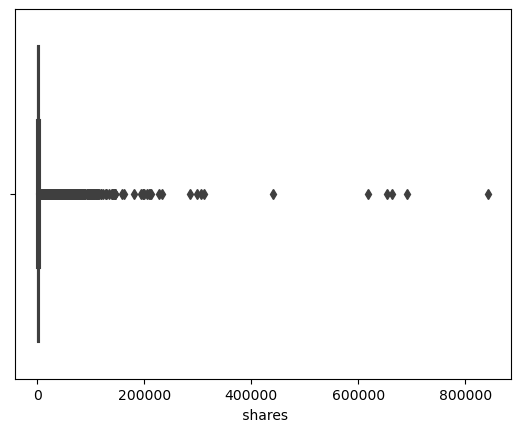

In [17]:
sns.boxplot(x=df[' shares'])
plt.show()

In [18]:
numerical_columns = df.select_dtypes(include = ['int64','float64']).columns

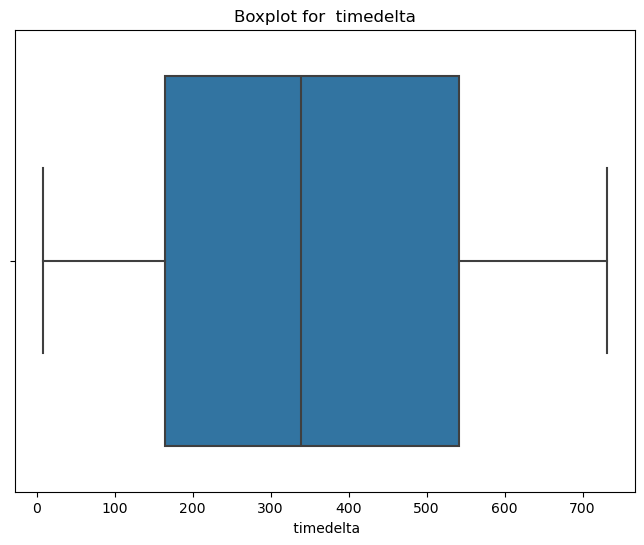

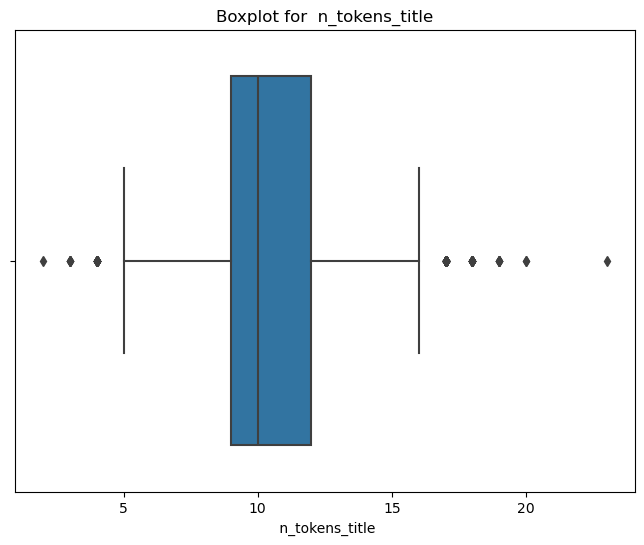

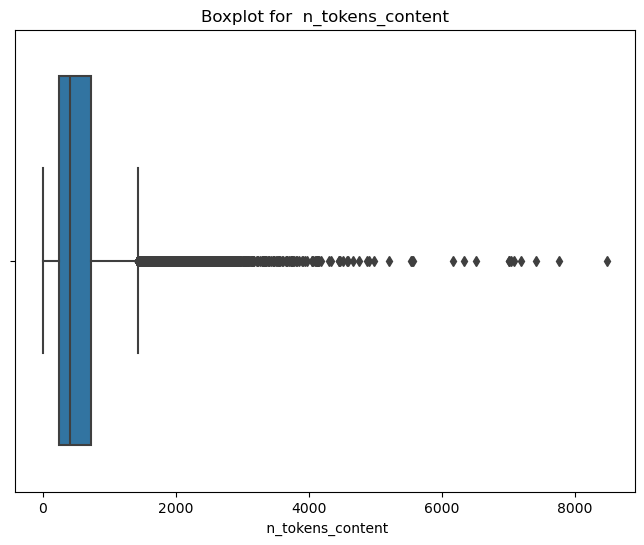

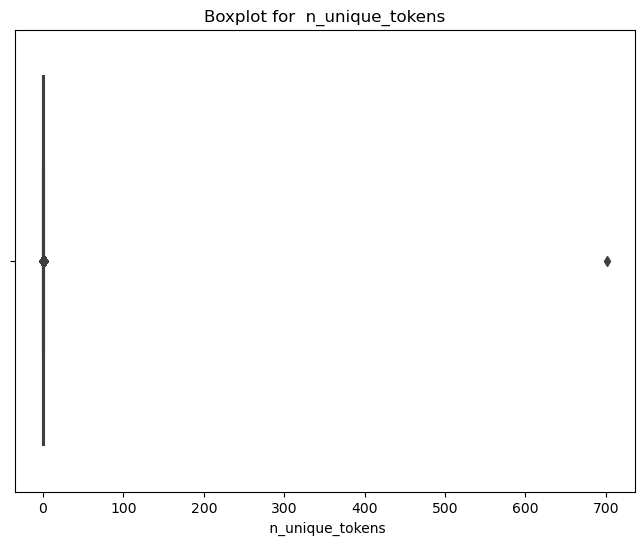

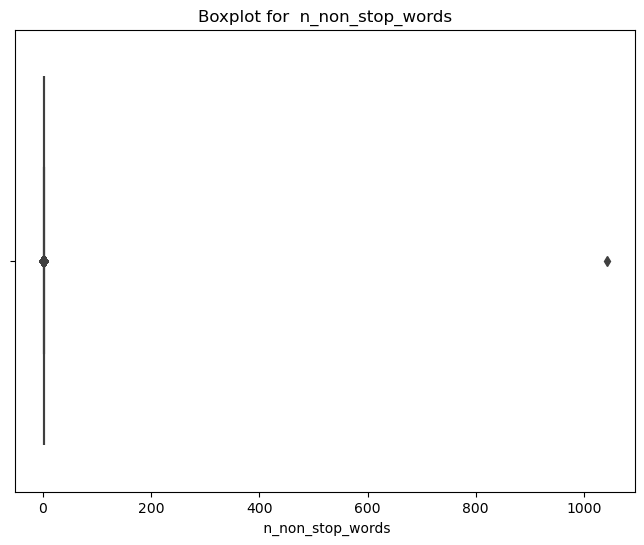

...

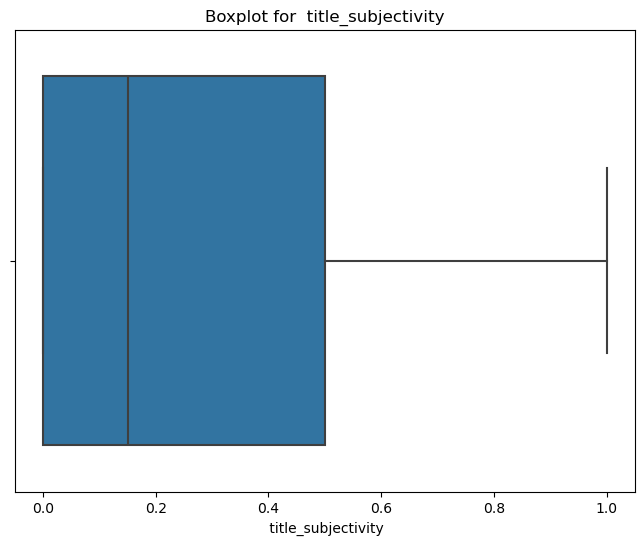

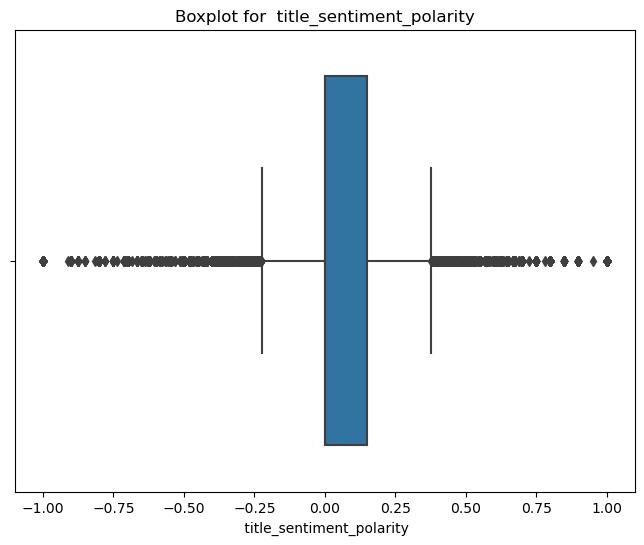

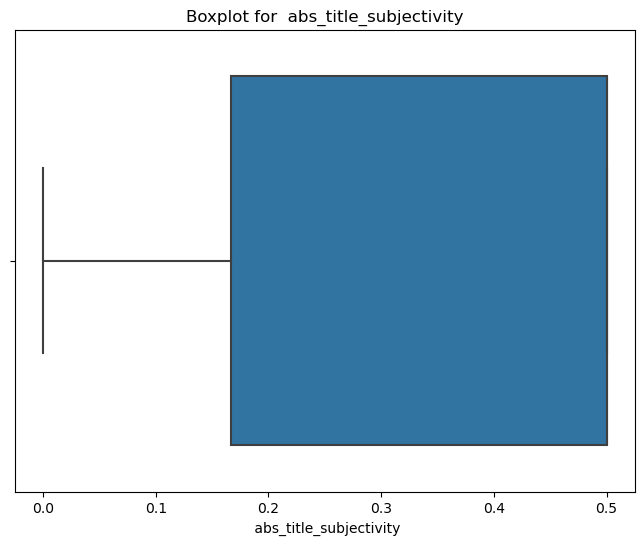

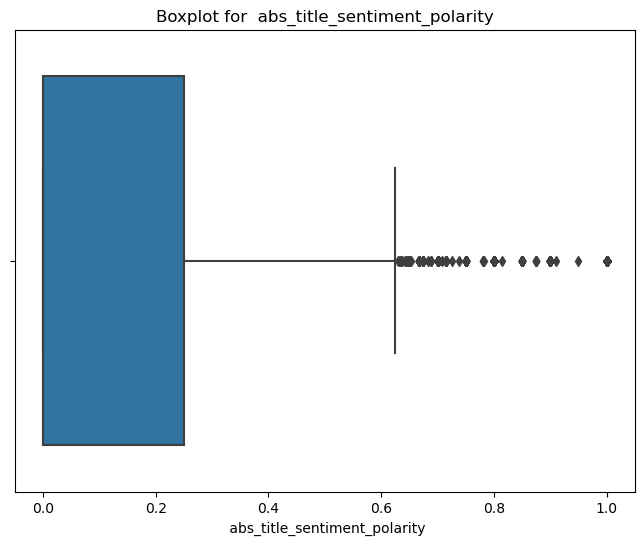

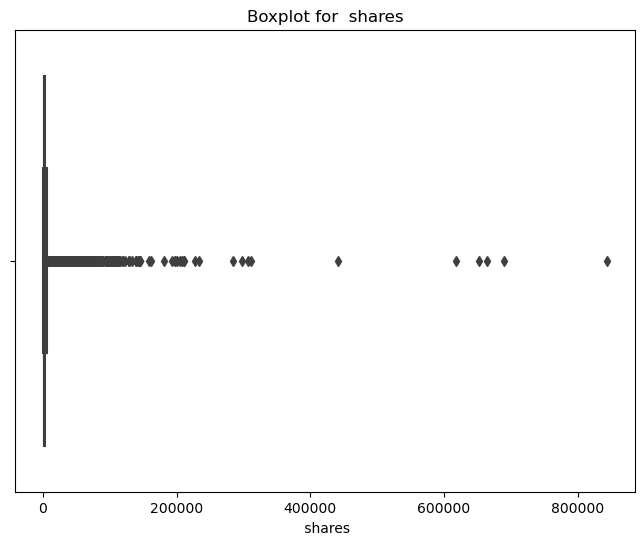

In [19]:
# Function to draw boxplots for all numerical columns in df_no_outliers
def draw_boxplots(df):
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    for col in numerical_cols:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=df[col])
        plt.title(f'Boxplot for {col}')
        plt.show()

# Example usage:
draw_boxplots(df)

In [20]:
# Function to detect and impute outliers with median using the IQR method
def impute_outliers_with_median(df, columns):
    for col in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        
        # Calculate lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Replace outliers with the median of the column
        median_value = df[col].median()
        df[col] = np.where((df[col] < lower_bound) | (df[col] > upper_bound), median_value, df[col])
    
    return df

# Example usage:

# Assuming df is your DataFrame and numerical_cols contains your numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Impute outliers with median
df_imputed = impute_outliers_with_median(df, numerical_columns)

# View the data after imputing
print("Data after imputing outliers with median:\n", df_imputed.head())

Data after imputing outliers with median:
                                                  url   timedelta  \
0  http://mashable.com/2013/01/07/amazon-instant-...       731.0   
1  http://mashable.com/2013/01/07/ap-samsung-spon...       731.0   
2  http://mashable.com/2013/01/07/apple-40-billio...       731.0   
3  http://mashable.com/2013/01/07/astronaut-notre...       731.0   
4   http://mashable.com/2013/01/07/att-u-verse-apps/       731.0   

    n_tokens_title   n_tokens_content   n_unique_tokens   n_non_stop_words  \
0             12.0              219.0          0.663594                1.0   
1              9.0              255.0          0.604743                1.0   
2              9.0              211.0          0.575130                1.0   
3              9.0              531.0          0.503788                1.0   
4             13.0             1072.0          0.415646                1.0   

    n_non_stop_unique_tokens   num_hrefs   num_self_hrefs   num_imgs  ...  \
0 

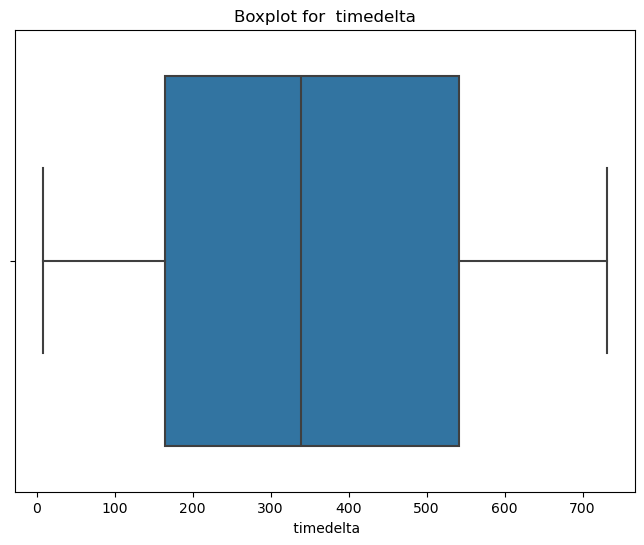

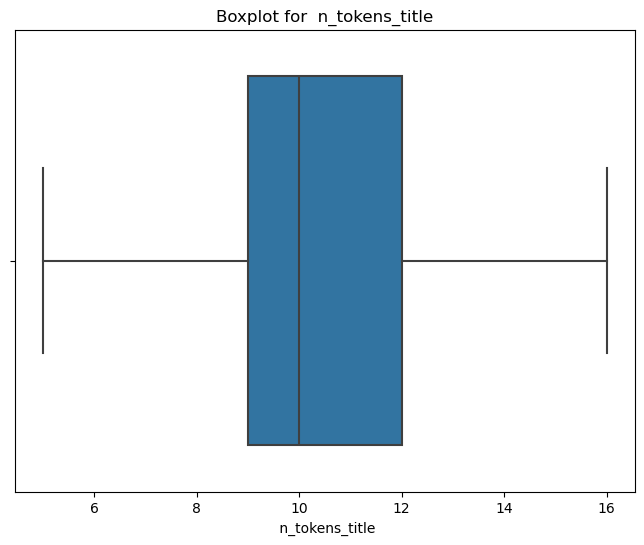

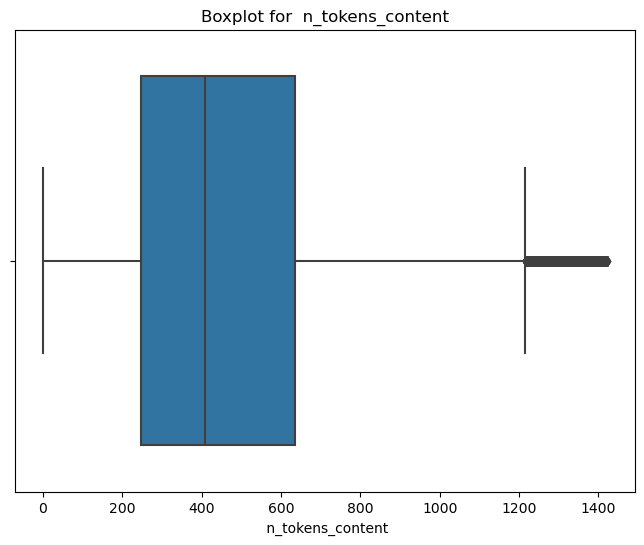

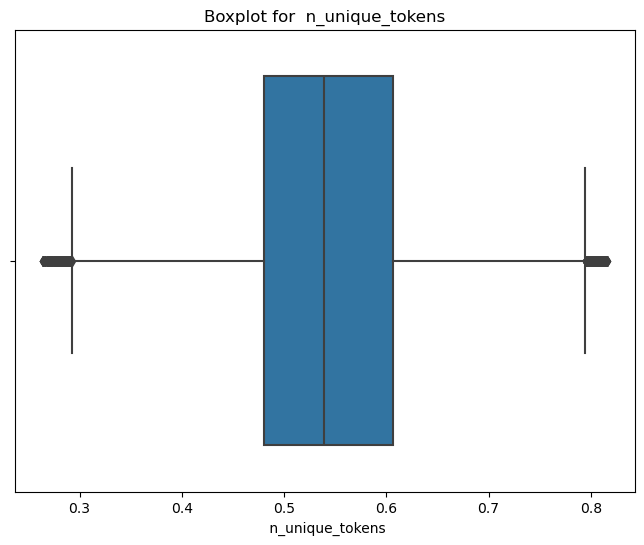

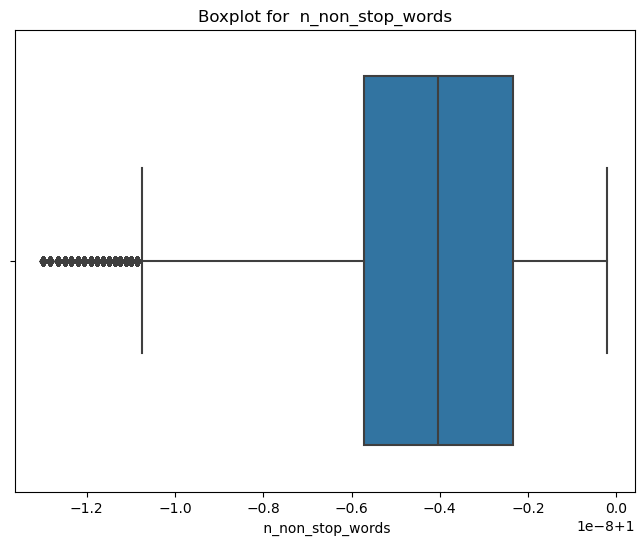

...

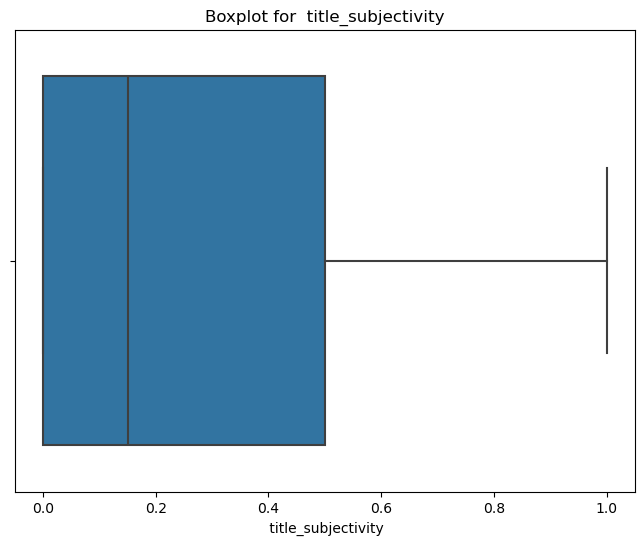

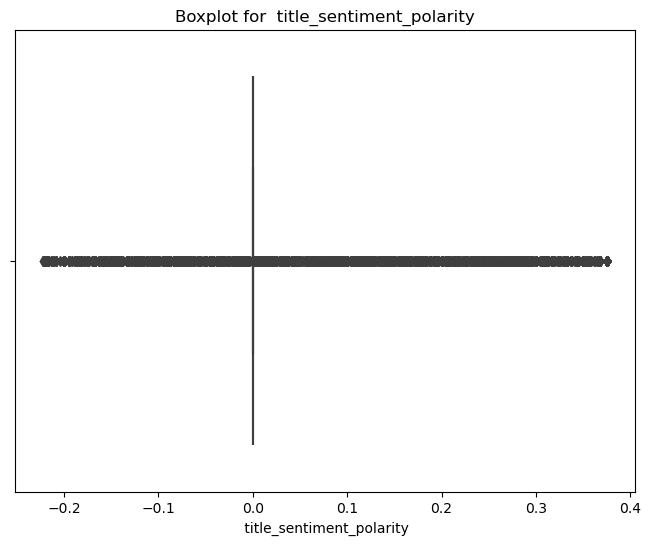

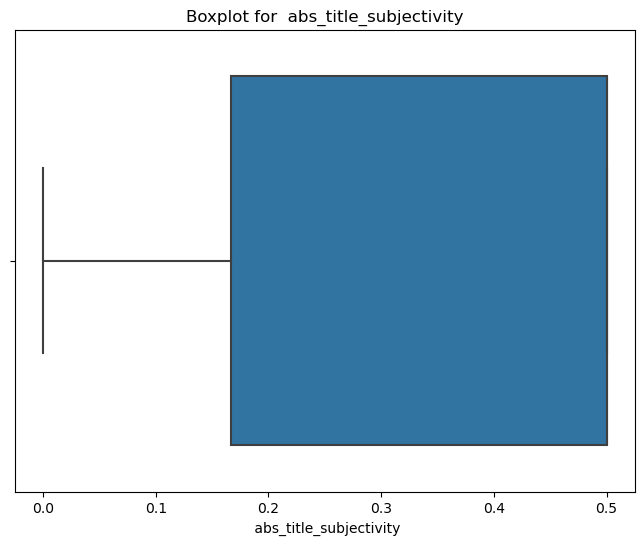

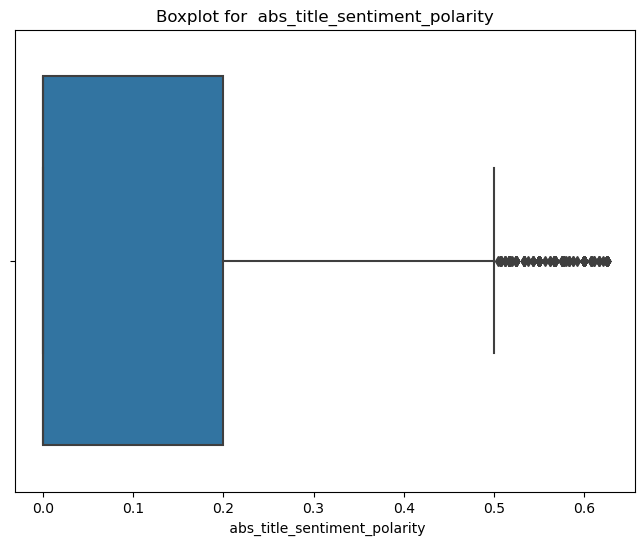

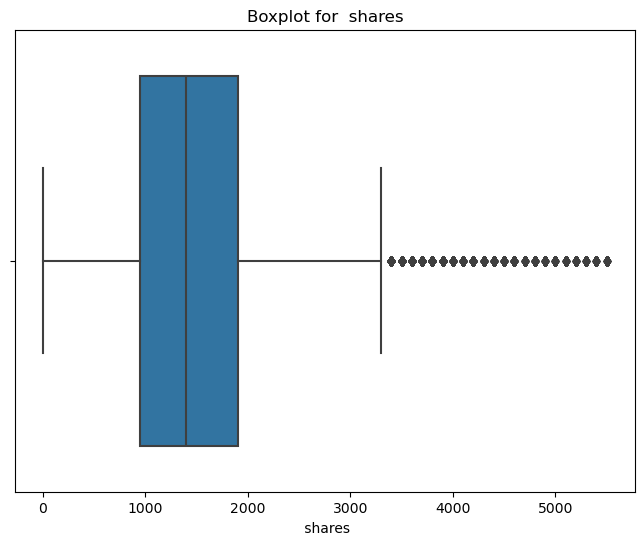

In [21]:
# Function to draw boxplots for all numerical columns in df_no_outliers
def draw_boxplots(df_imputed):
    numerical_cols = df_imputed.select_dtypes(include=['int64', 'float64']).columns
    for col in numerical_cols:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=df_imputed[col])
        plt.title(f'Boxplot for {col}')
        plt.show()

# Example usage:
draw_boxplots(df_imputed)

In [22]:
df_imputed.describe()

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
count,39644.000000,39644.000000,39644.000000,39644.000000,3.964400e+04,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,...,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,354.530471,10.381369,469.621456,0.545307,1.000000e+00,0.695907,8.863334,2.663076,1.284633,0.349637,...,0.081553,0.756728,-0.250787,-0.521944,-0.089461,0.282353,0.032506,0.341843,0.119955,1640.819695
std,214.163767,2.068798,304.369008,0.095199,2.615698e-09,0.090866,6.316145,1.921266,1.417582,0.581233,...,0.037568,0.247786,0.112019,0.290290,0.047945,0.324247,0.100318,0.188791,0.170960,1041.701473
min,8.000000,5.000000,0.000000,0.264228,1.000000e+00,0.432432,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,-0.540476,-1.000000,-0.230769,0.000000,-0.222222,0.000000,0.000000,1.000000
25%,164.000000,9.000000,246.000000,0.480564,1.000000e+00,0.637829,4.000000,1.000000,1.000000,0.000000,...,0.050000,0.600000,-0.320332,-0.700000,-0.125000,0.000000,0.000000,0.166667,0.000000,946.000000
50%,339.000000,10.000000,409.000000,0.539226,1.000000e+00,0.690476,8.000000,3.000000,1.000000,0.000000,...,0.100000,0.800000,-0.253333,-0.500000,-0.100000,0.150000,0.000000,0.500000,0.000000,1400.000000
75%,542.000000,12.000000,634.000000,0.606178,1.000000e+00,0.753425,12.000000,4.000000,1.000000,1.000000,...,0.100000,1.000000,-0.186905,-0.300000,-0.050000,0.500000,0.000000,0.500000,0.200000,1900.000000
max,731.000000,16.000000,1421.000000,0.815385,1.000000e+00,0.947368,29.000000,8.000000,8.000000,2.000000,...,0.166667,1.000000,0.000000,0.000000,0.000000,1.000000,0.375000,0.500000,0.625000,5500.000000


In [23]:
df2 =  df_imputed

In [24]:
numerical_cols = df2.select_dtypes(include=['int64', 'float64']).columns

# Function to detect outliers using the IQR method
def detect_outliers_iqr(df2, columns):
    outlier_info = {}

    for col in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df2[col].quantile(0.25)
        Q3 = df2[col].quantile(0.75)
        IQR = Q3 - Q1

        # Calculate lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Detect outliers
        outliers = df2[(df2[col] < lower_bound) | (df2[col] > upper_bound)]

        # Store outlier information
        outlier_info[col] = {
            "Number of outliers": len(outliers),
            "Lower bound": lower_bound,
            "Upper bound": upper_bound,
            "Outliers": outliers[col].values
        }

        # Print the results
        print(f"Column: {col}")
        print(f"Number of outliers detected: {len(outliers)}")
        print(f"Outliers:\n{outliers[col].values}")
        print('-'*50)

    return outlier_info


# Detect outliers using the IQR method
outlier_info = detect_outliers_iqr(df2, numerical_cols)

Column:  timedelta
Number of outliers detected: 0
Outliers:
[]
--------------------------------------------------
Column:  n_tokens_title
Number of outliers detected: 0
Outliers:
[]
--------------------------------------------------
Column:  n_tokens_content
Number of outliers detected: 1030
Outliers:
[1248. 1248. 1225. ... 1300. 1250. 1335.]
--------------------------------------------------
Column:  n_unique_tokens
Number of outliers detected: 278
Outliers:
[0.79999999 0.79999999 0.79999999 0.28484321 0.79545454 0.80851063
 0.2768514  0.28323699 0.80152671 0.81443298 0.79999999 0.26651406
 0.79999999 0.79999999 0.81521738 0.80829015 0.80555554 0.80722891
 0.80487804 0.80219779 0.80681817 0.80459769 0.79999998 0.79674796
 0.80434782 0.8080808  0.80681817 0.79761904 0.81481481 0.79591836
 0.79999999 0.79999999 0.79999999 0.80645161 0.80898875 0.8130841
 0.8076923  0.28667703 0.79816513 0.28701145 0.80555554 0.80898875
 0.28614458 0.8        0.2830033  0.28525896 0.29116945 0.80152671
 

In [25]:
numerical_cols = df_imputed.select_dtypes(include=['int64', 'float64']).columns

# Function to detect outliers using the IQR method
def detect_outliers_iqr(df_imputed, columns):
    outlier_info = {}
    
    for col in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df_imputed[col].quantile(0.25)
        Q3 = df_imputed[col].quantile(0.75)
        IQR = Q3 - Q1
        
        # Calculate lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Detect outliers
        outliers = df_imputed[(df_imputed[col] < lower_bound) | (df_imputed[col] > upper_bound)]
        
        # Store outlier information
        outlier_info[col] = {
            "Number of outliers": len(outliers),
            "Lower bound": lower_bound,
            "Upper bound": upper_bound,
            "Outliers": outliers[col].values
        }
        
        # Print the results
        print(f"Column: {col}")
        print(f"Number of outliers detected: {len(outliers)}")
        print(f"Outliers:\n{outliers[col].values}")
        print('-'*50)
    
    return outlier_info


# Detect outliers using the IQR method
outlier_info = detect_outliers_iqr(df_imputed, numerical_cols)

Column:  timedelta
Number of outliers detected: 0
Outliers:
[]
--------------------------------------------------
Column:  n_tokens_title
Number of outliers detected: 0
Outliers:
[]
--------------------------------------------------
Column:  n_tokens_content
Number of outliers detected: 1030
Outliers:
[1248. 1248. 1225. ... 1300. 1250. 1335.]
--------------------------------------------------
Column:  n_unique_tokens
Number of outliers detected: 278
Outliers:
[0.79999999 0.79999999 0.79999999 0.28484321 0.79545454 0.80851063
 0.2768514  0.28323699 0.80152671 0.81443298 0.79999999 0.26651406
 0.79999999 0.79999999 0.81521738 0.80829015 0.80555554 0.80722891
 0.80487804 0.80219779 0.80681817 0.80459769 0.79999998 0.79674796
 0.80434782 0.8080808  0.80681817 0.79761904 0.81481481 0.79591836
 0.79999999 0.79999999 0.79999999 0.80645161 0.80898875 0.8130841
 0.8076923  0.28667703 0.79816513 0.28701145 0.80555554 0.80898875
 0.28614458 0.8        0.2830033  0.28525896 0.29116945 0.80152671
 

In [26]:
# Function to detect and impute outliers with mean using the IQR method
def impute_outliers_with_mean(df2, columns):
    for col in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df2[col].quantile(0.25)
        Q3 = df2[col].quantile(0.75)
        IQR = Q3 - Q1

        # Calculate lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Replace outliers with the median of the column
        mean_value = df2[col].mean()
        df2[col] = np.where((df2[col] < lower_bound) | (df2[col] > upper_bound), mean_value, df2[col])

    return df2


numerical_columns = df2.select_dtypes(include=['int64', 'float64']).columns

# Impute outliers with mean
df_imputed_mean = impute_outliers_with_mean(df2, numerical_columns)

# View the data after imputing
print("Data after imputing outliers with mean:\n", df_imputed_mean.head())

Data after imputing outliers with mean:
                                                  url   timedelta  \
0  http://mashable.com/2013/01/07/amazon-instant-...       731.0   
1  http://mashable.com/2013/01/07/ap-samsung-spon...       731.0   
2  http://mashable.com/2013/01/07/apple-40-billio...       731.0   
3  http://mashable.com/2013/01/07/astronaut-notre...       731.0   
4   http://mashable.com/2013/01/07/att-u-verse-apps/       731.0   

    n_tokens_title   n_tokens_content   n_unique_tokens   n_non_stop_words  \
0             12.0              219.0          0.663594                1.0   
1              9.0              255.0          0.604743                1.0   
2              9.0              211.0          0.575130                1.0   
3              9.0              531.0          0.503788                1.0   
4             13.0             1072.0          0.415646                1.0   

    n_non_stop_unique_tokens   num_hrefs   num_self_hrefs   num_imgs  ...  \
0   

In [27]:
df3 = df_imputed_mean

In [28]:
numerical_cols = df3.select_dtypes(include=['int64', 'float64']).columns

# Function to detect outliers using the IQR method
def detect_outliers_iqr(df3, columns):
    outlier_info = {}

    for col in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df3[col].quantile(0.25)
        Q3 = df3[col].quantile(0.75)
        IQR = Q3 - Q1

        # Calculate lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Detect outliers
        outliers = df3[(df3[col] < lower_bound) | (df3[col] > upper_bound)]

        # Store outlier information
        outlier_info[col] = {
            "Number of outliers": len(outliers),
            "Lower bound": lower_bound,
            "Upper bound": upper_bound,
            "Outliers": outliers[col].values
        }

        # Print the results
        print(f"Column: {col}")
        print(f"Number of outliers detected: {len(outliers)}")
        print(f"Outliers:\n{outliers[col].values}")


    return outlier_info


# Detect outliers using the IQR method
outlier_info = detect_outliers_iqr(df3, numerical_cols)

Column:  timedelta
Number of outliers detected: 0
Outliers:
[]
Column:  n_tokens_title
Number of outliers detected: 0
Outliers:
[]
Column:  n_tokens_content
Number of outliers detected: 678
Outliers:
[1207. 1154. 1190. 1174. 1125. 1160. 1154. 1175. 1159. 1202. 1160. 1197.
 1179. 1186. 1180. 1215. 1152. 1139. 1144. 1176. 1197. 1209. 1160. 1195.
 1156. 1124. 1128. 1155. 1147. 1130. 1176. 1147. 1189. 1170. 1124. 1195.
 1207. 1211. 1151. 1175. 1146. 1127. 1137. 1156. 1209. 1195. 1210. 1131.
 1130. 1175. 1153. 1190. 1178. 1193. 1187. 1142. 1171. 1215. 1214. 1142.
 1174. 1162. 1196. 1126. 1144. 1186. 1164. 1137. 1216. 1182. 1203. 1196.
 1203. 1143. 1124. 1203. 1216. 1146. 1160. 1128. 1174. 1184. 1213. 1161.
 1148. 1146. 1183. 1197. 1167. 1202. 1205. 1195. 1168. 1141. 1135. 1164.
 1160. 1159. 1210. 1191. 1183. 1182. 1183. 1211. 1138. 1146. 1179. 1157.
 1214. 1170. 1161. 1165. 1163. 1208. 1189. 1179. 1171. 1134. 1168. 1172.
 1144. 1124. 1141. 1185. 1142. 1183. 1146. 1163. 1125. 1141. 1124. 112

In [29]:
numerical_cols = df3.select_dtypes(include=['int64', 'float64']).columns


# Function to detect and remove outliers using the IQR method
def remove_outliers_iqr(df3 , columns):
    for col in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df3[col].quantile(0.25)
        Q3 = df3[col].quantile(0.75)
        IQR = Q3 - Q1

        # Calculate lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Remove rows with outliers
        df3 = df3[(df3[col] >= lower_bound) & (df3[col] <= upper_bound)]

    return df3

# Remove outliers from the dataset
df_cleaned= remove_outliers_iqr(df3, numerical_cols)

# View the dataset after removing outliers
print("Data after removing outliers:\n", df_cleaned.head())

Data after removing outliers:
                                                  url   timedelta  \
0  http://mashable.com/2013/01/07/amazon-instant-...       731.0   
1  http://mashable.com/2013/01/07/ap-samsung-spon...       731.0   
2  http://mashable.com/2013/01/07/apple-40-billio...       731.0   
3  http://mashable.com/2013/01/07/astronaut-notre...       731.0   
4   http://mashable.com/2013/01/07/att-u-verse-apps/       731.0   

    n_tokens_title   n_tokens_content   n_unique_tokens   n_non_stop_words  \
0             12.0              219.0          0.663594                1.0   
1              9.0              255.0          0.604743                1.0   
2              9.0              211.0          0.575130                1.0   
3              9.0              531.0          0.503788                1.0   
4             13.0             1072.0          0.415646                1.0   

    n_non_stop_unique_tokens   num_hrefs   num_self_hrefs   num_imgs  ...  \
0             

In [30]:
df4 = df_cleaned

In [31]:
df4.shape

(21063, 61)

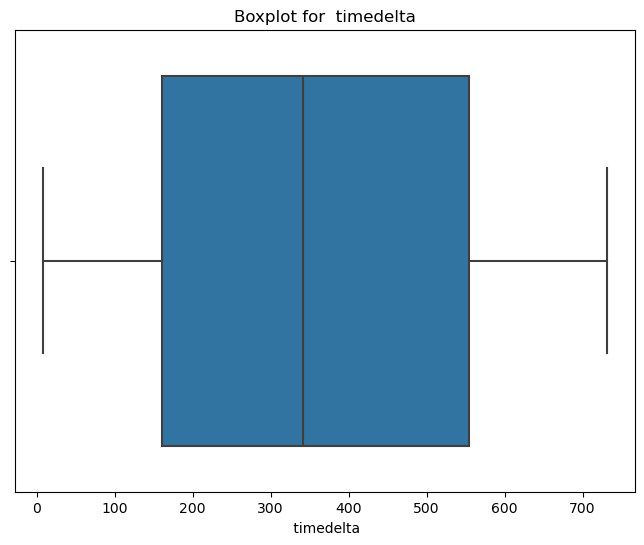

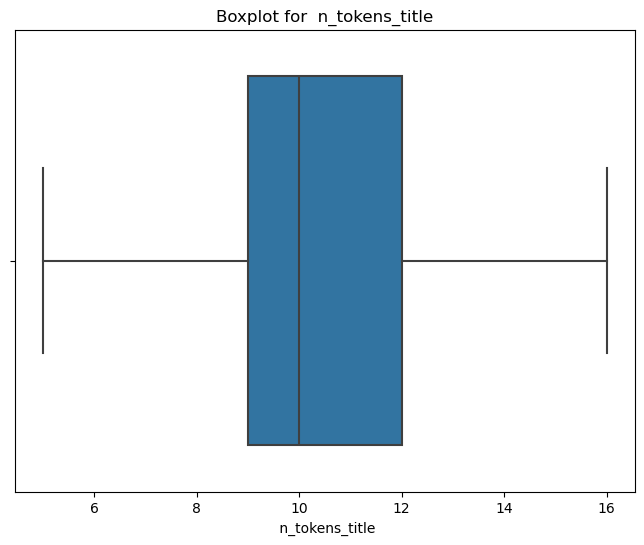

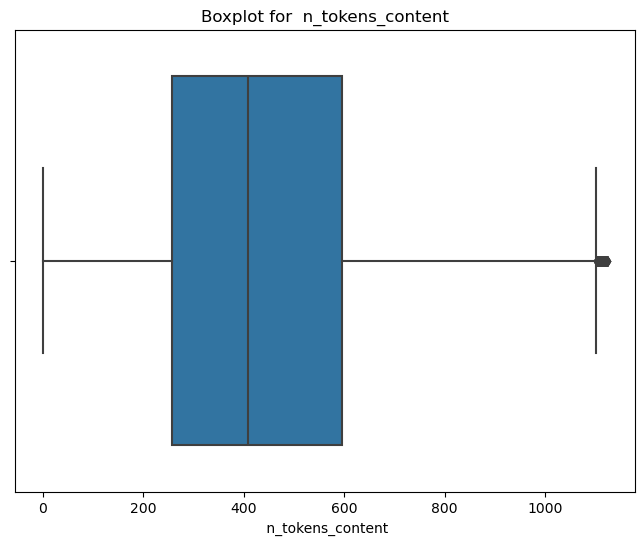

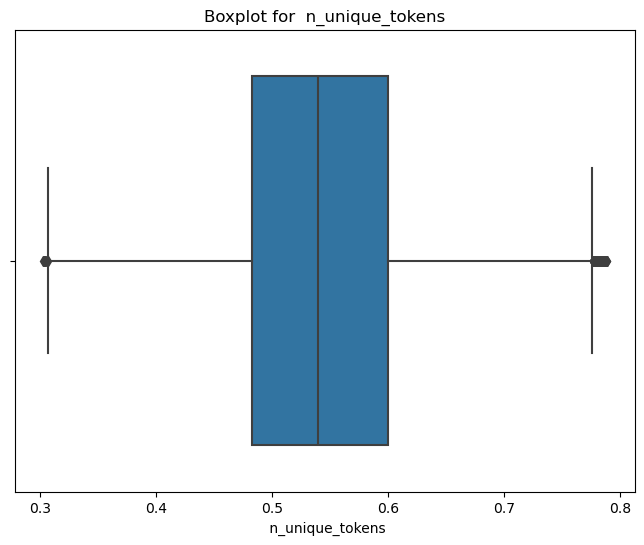

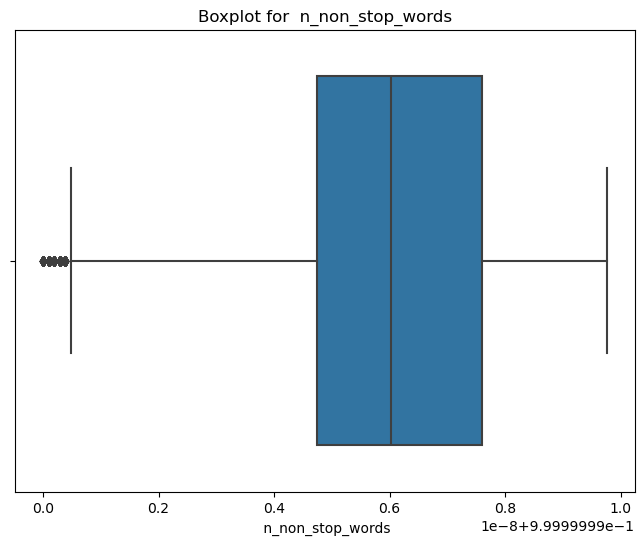

...

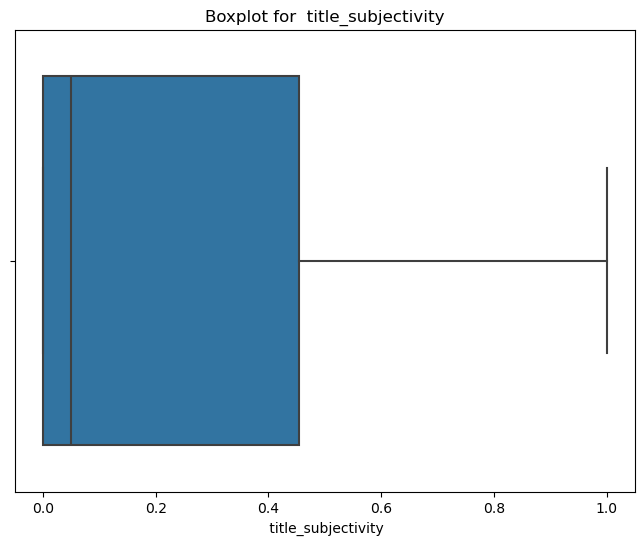

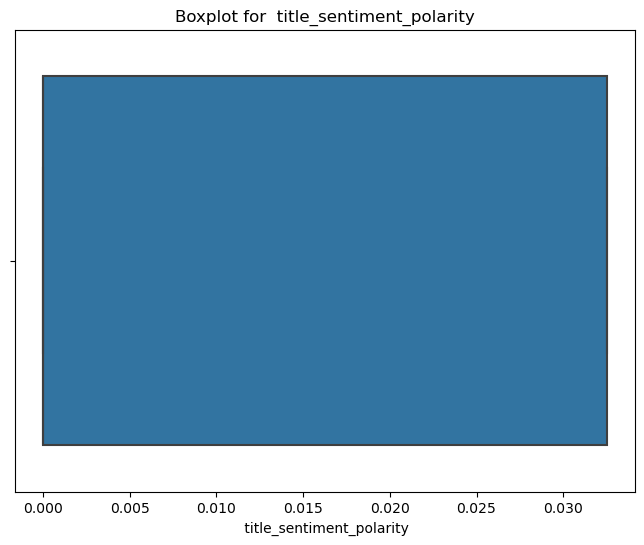

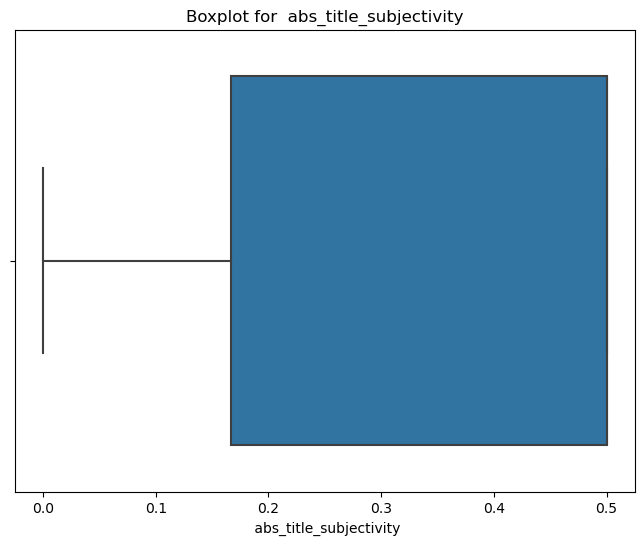

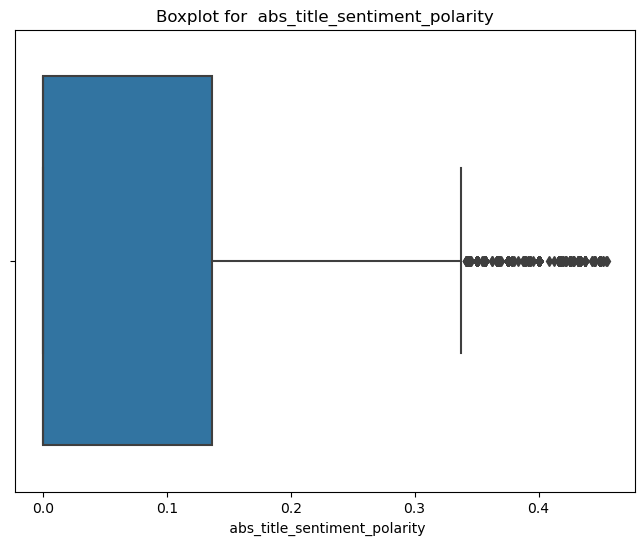

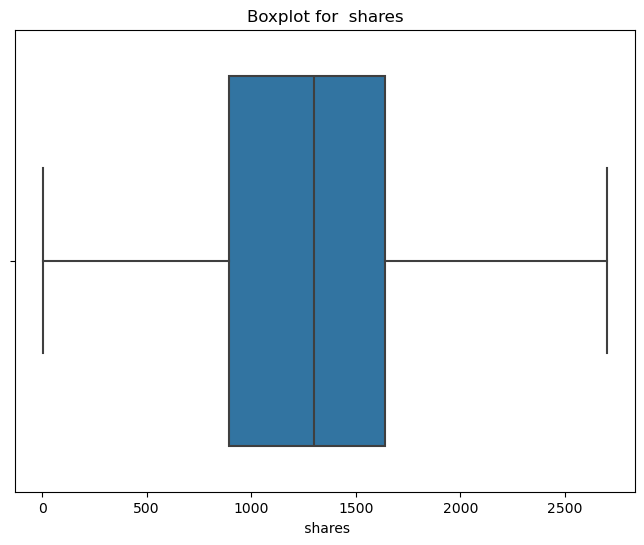

In [32]:
# Function to draw boxplots for all numerical columns in df_no_outliers
def draw_boxplots(df4):
    numerical_cols = df4.select_dtypes(include=['int64', 'float64']).columns
    for col in numerical_cols:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=df4[col])
        plt.title(f'Boxplot for {col}')
        plt.show()

# Example usage:
draw_boxplots(df4)

In [33]:

numerical_cols = df4.select_dtypes(include=['int64', 'float64']).columns


# Function to detect and remove outliers using the IQR method
def remove_outliers_iqr(df4, columns):
    for col in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df4[col].quantile(0.25)
        Q3 = df4[col].quantile(0.75)
        IQR = Q3 - Q1

        # Calculate lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Remove rows with outliers
        df4 = df4[(df4[col] >= lower_bound) & (df4[col] <= upper_bound)]

    return df4

# Remove outliers from the dataset
df_no_outliers = remove_outliers_iqr(df4, numerical_cols)

# View the dataset after removing outliers
print("Data after removing outliers:\n", df_no_outliers.head())

Data after removing outliers:
                                                  url   timedelta  \
0  http://mashable.com/2013/01/07/amazon-instant-...       731.0   
1  http://mashable.com/2013/01/07/ap-samsung-spon...       731.0   
3  http://mashable.com/2013/01/07/astronaut-notre...       731.0   
4   http://mashable.com/2013/01/07/att-u-verse-apps/       731.0   
8  http://mashable.com/2013/01/07/car-of-the-futu...       731.0   

    n_tokens_title   n_tokens_content   n_unique_tokens   n_non_stop_words  \
0             12.0              219.0          0.663594                1.0   
1              9.0              255.0          0.604743                1.0   
3              9.0              531.0          0.503788                1.0   
4             13.0             1072.0          0.415646                1.0   
8             11.0               97.0          0.670103                1.0   

    n_non_stop_unique_tokens   num_hrefs   num_self_hrefs   num_imgs  ...  \
0             

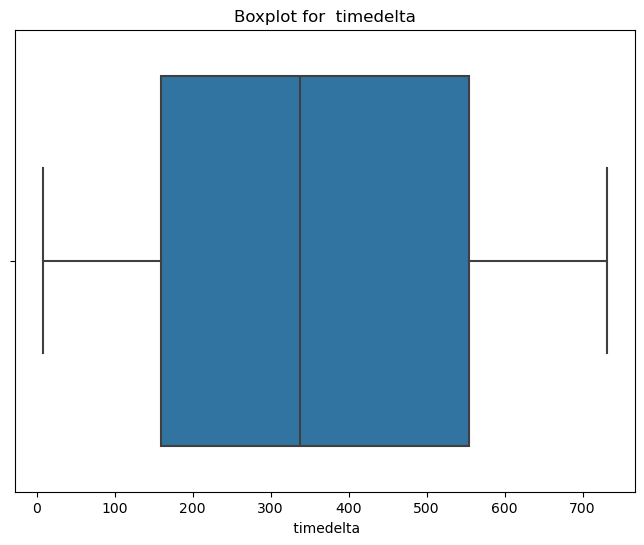

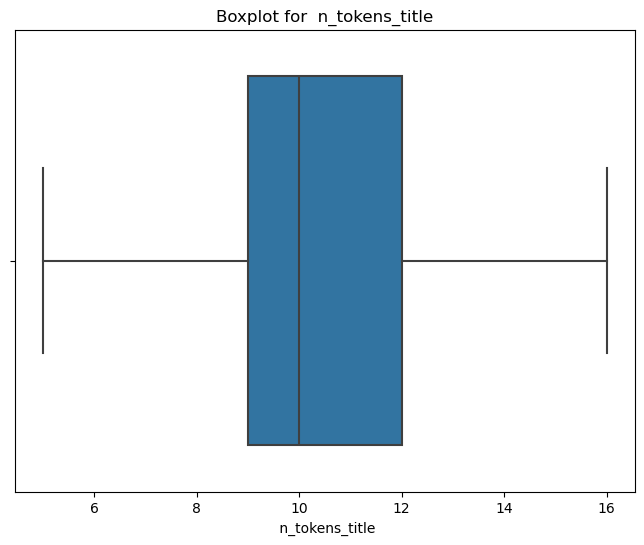

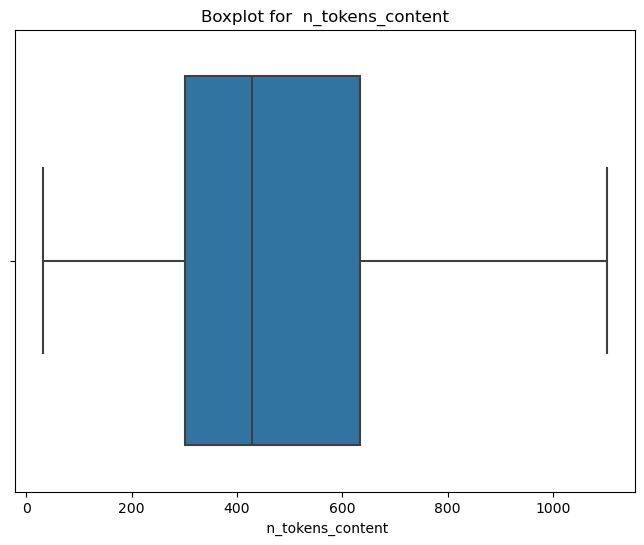

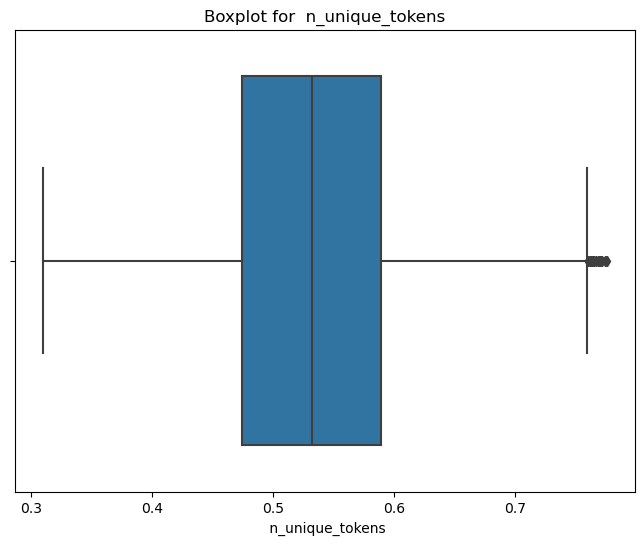

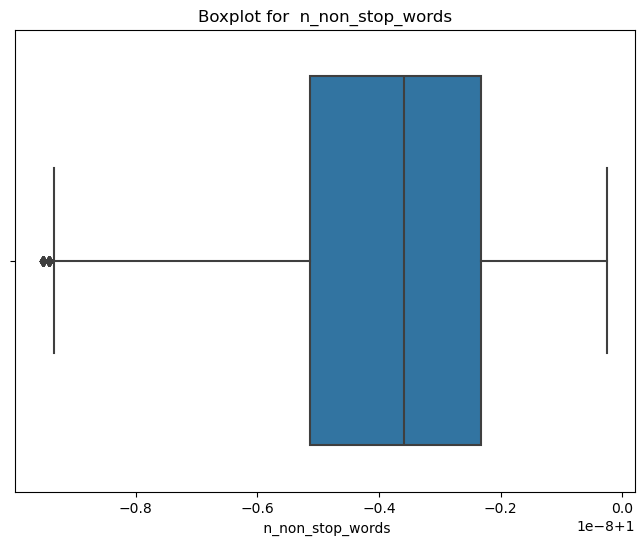

...

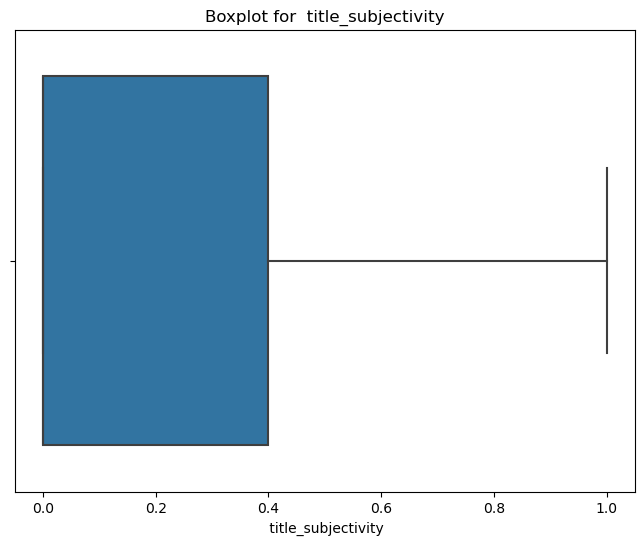

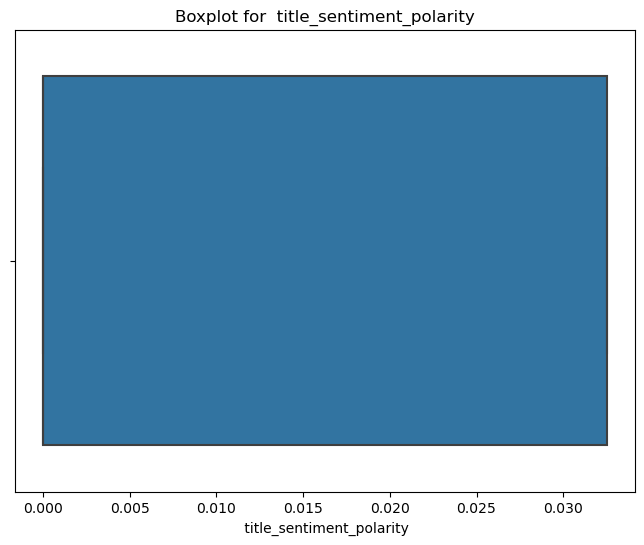

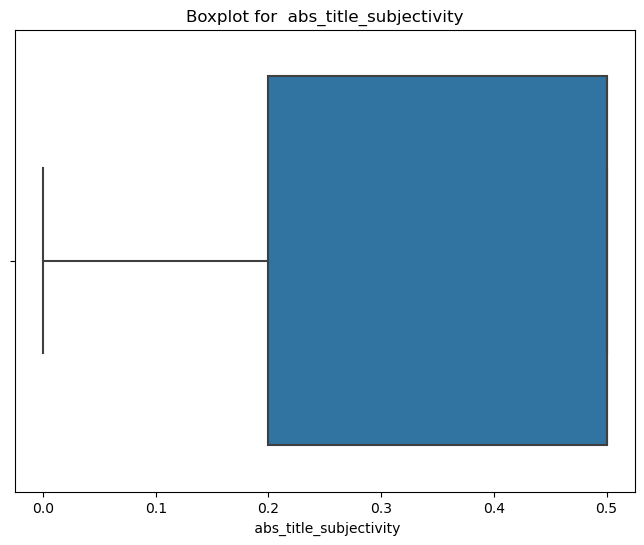

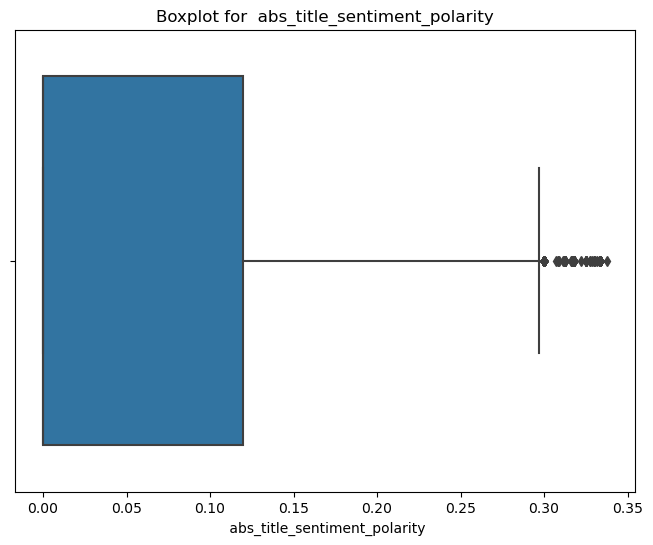

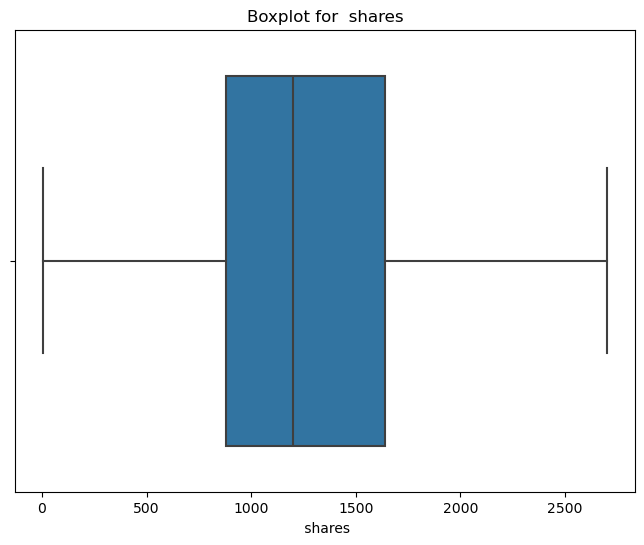

In [34]:
# Function to draw boxplots for all numerical columns in df_no_outliers
def draw_boxplots(df_no_outliers):
    numerical_cols = df_no_outliers.select_dtypes(include=['int64', 'float64']).columns
    for col in numerical_cols:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=df_no_outliers[col])
        plt.title(f'Boxplot for {col}')
        plt.show()

# Example usage:
draw_boxplots(df_no_outliers)

In [35]:
numerical_cols = df_no_outliers.select_dtypes(include=['int64', 'float64']).columns

# Function to detect outliers using the IQR method
def detect_outliers_iqr(df_no_outliers, columns):
    outlier_info = {}

    for col in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df_no_outliers[col].quantile(0.25)
        Q3 = df_no_outliers[col].quantile(0.75)
        IQR = Q3 - Q1

        # Calculate lower and upper bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Detect outliers
        outliers = df_no_outliers[(df_no_outliers[col] < lower_bound) | (df_no_outliers[col] > upper_bound)]

        # Store outlier information
        outlier_info[col] = {
            "Number of outliers": len(outliers),
            "Lower bound": lower_bound,
            "Upper bound": upper_bound,
            "Outliers": outliers[col].values
        }

        # Print the results
        print(f"Column: {col}")
        print(f"Number of outliers detected: {len(outliers)}")
        print(f"Outliers:\n{outliers[col].values}")
        print('-'*50)

    return outlier_info


# Detect outliers using the IQR method
outlier_info = detect_outliers_iqr(df_no_outliers, numerical_cols)

Column:  timedelta
Number of outliers detected: 0
Outliers:
[]
--------------------------------------------------
Column:  n_tokens_title
Number of outliers detected: 0
Outliers:
[]
--------------------------------------------------
Column:  n_tokens_content
Number of outliers detected: 0
Outliers:
[]
--------------------------------------------------
Column:  n_unique_tokens
Number of outliers detected: 37
Outliers:
[0.77037036 0.76190475 0.76666666 0.76923076 0.77037036 0.76237623
 0.77118643 0.76041666 0.76258992 0.76521738 0.76923076 0.76142132
 0.76315789 0.7755102  0.77083333 0.76296296 0.76344085 0.75999999
 0.77528089 0.77173912 0.77519379 0.76237623 0.76415094 0.75999999
 0.76666666 0.76530611 0.77083333 0.7704918  0.7704918  0.75999999
 0.77391304 0.77499999 0.76415094 0.76422764 0.76923076 0.76984126
 0.76811594]
--------------------------------------------------
Column:  n_non_stop_words
Number of outliers detected: 48
Outliers:
[0.99999999 0.99999999 0.99999999 0.99999999 

In [36]:
df5 = df_no_outliers

In [37]:
df5.shape

(11625, 61)

### To find out the skewness

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


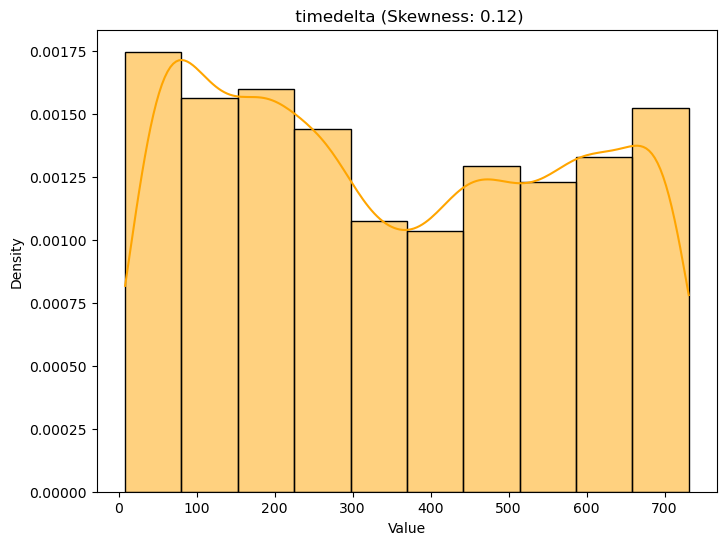

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


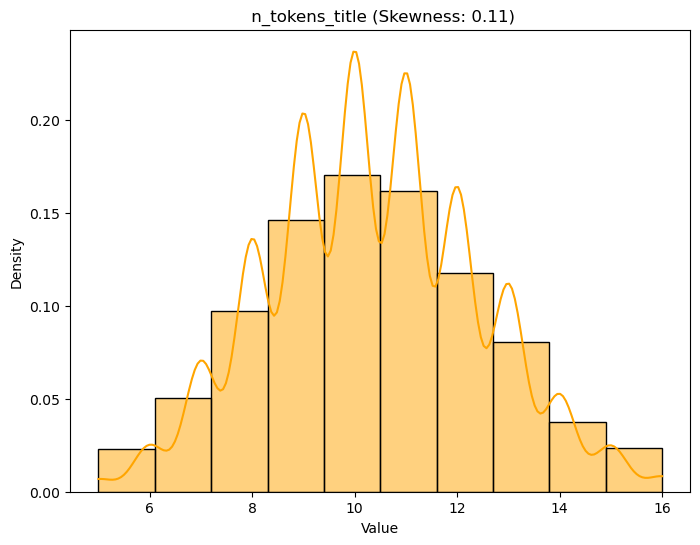

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


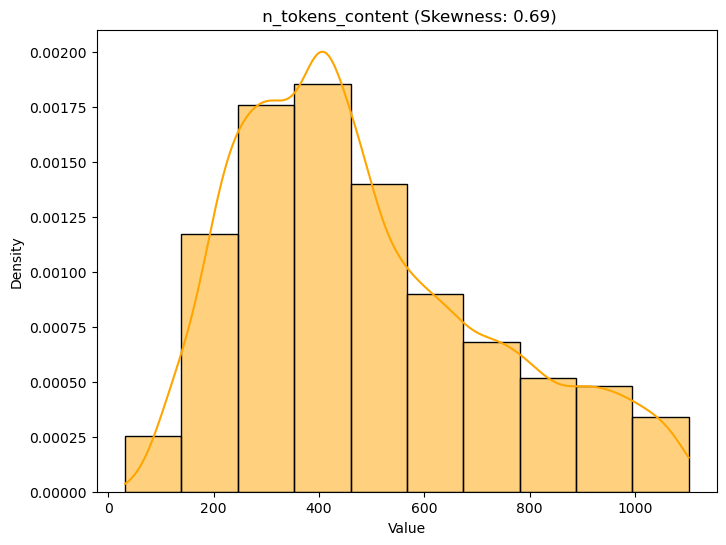

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


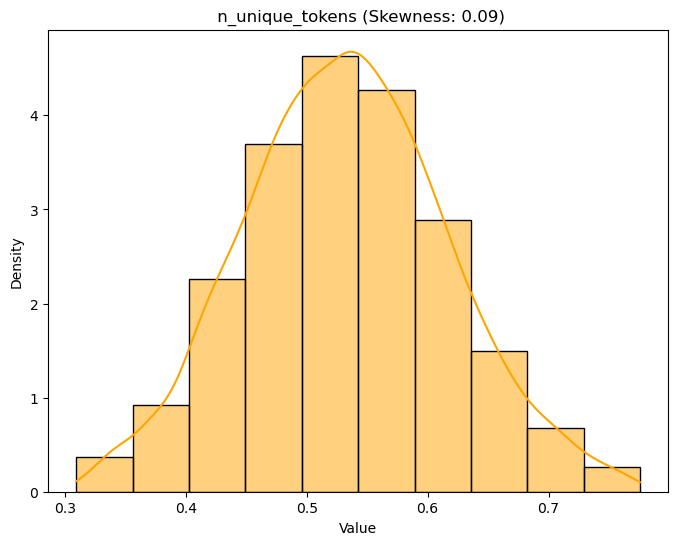

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


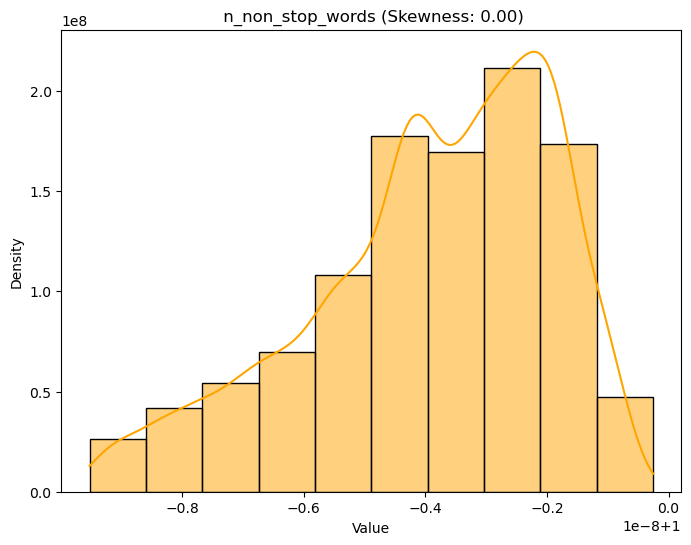

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


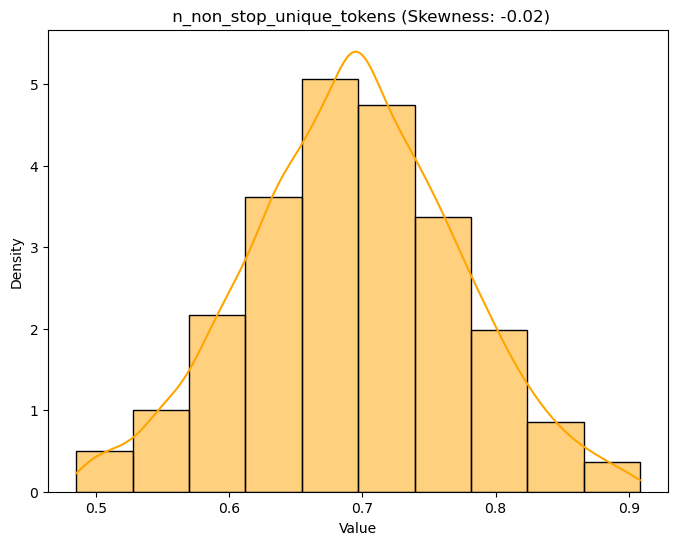

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


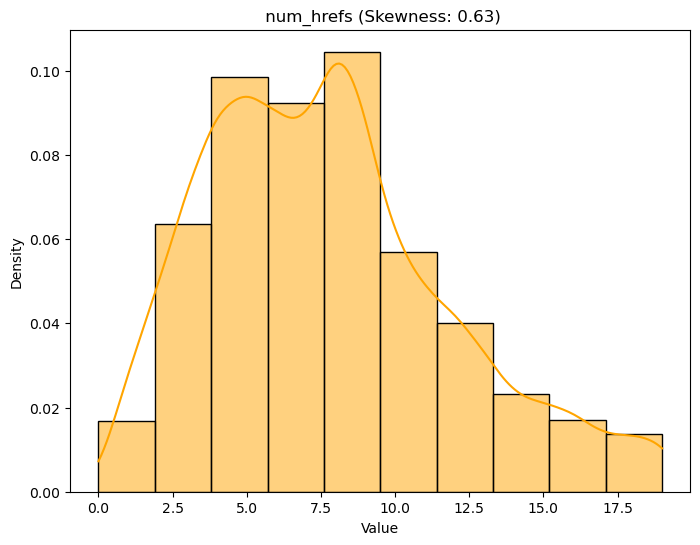

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


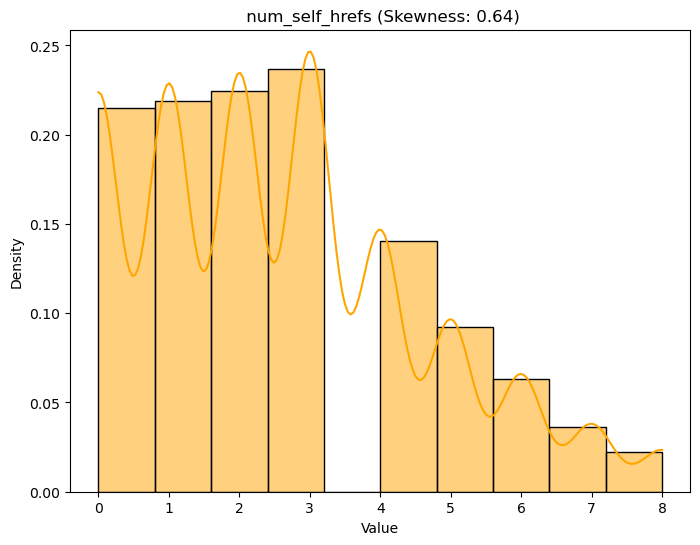

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


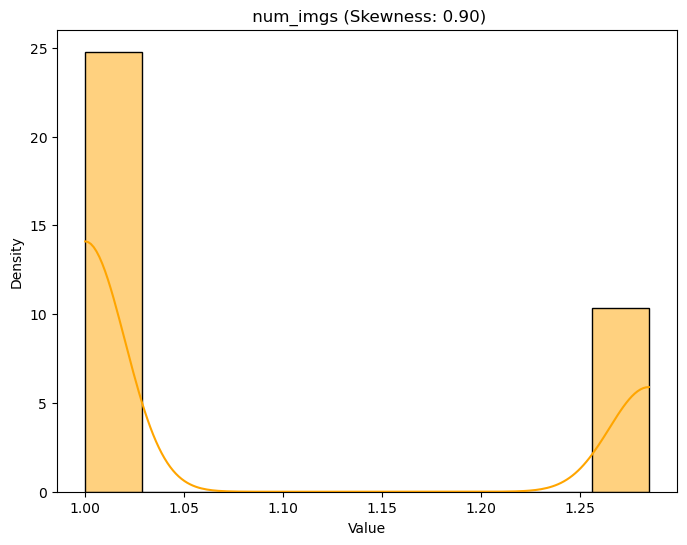

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


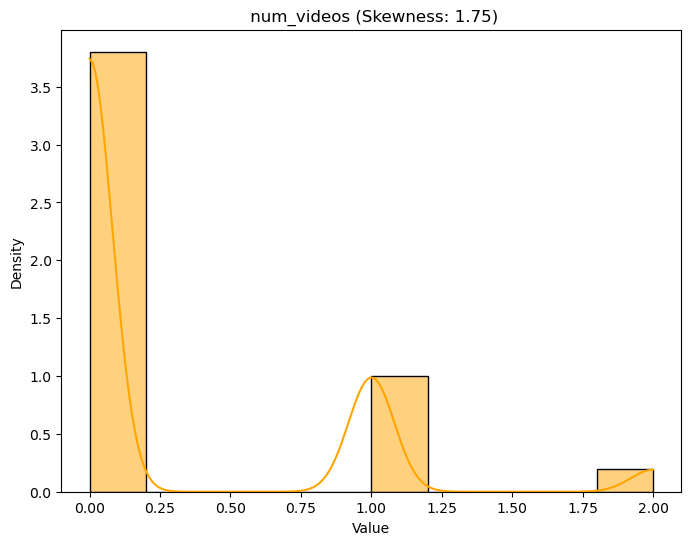

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


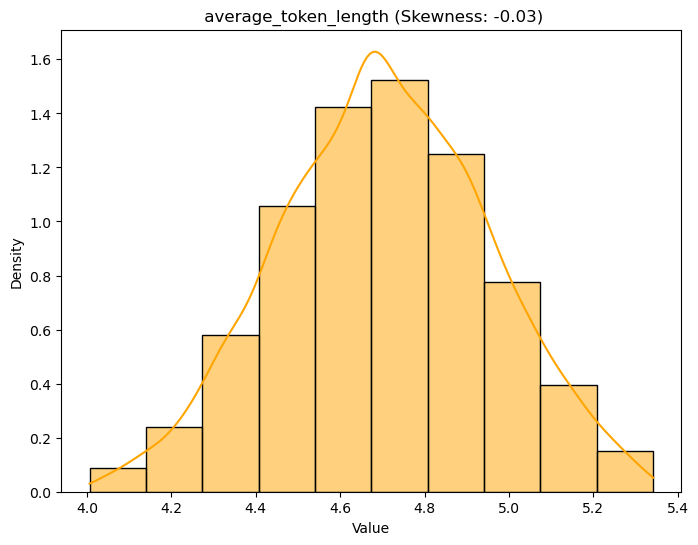

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


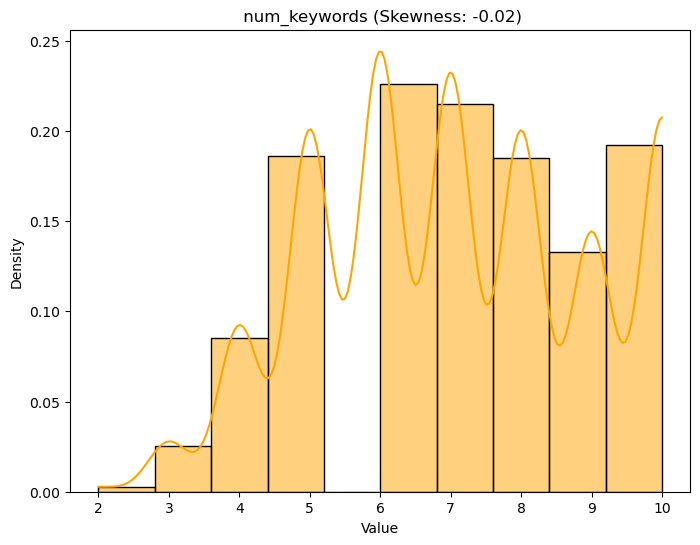

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


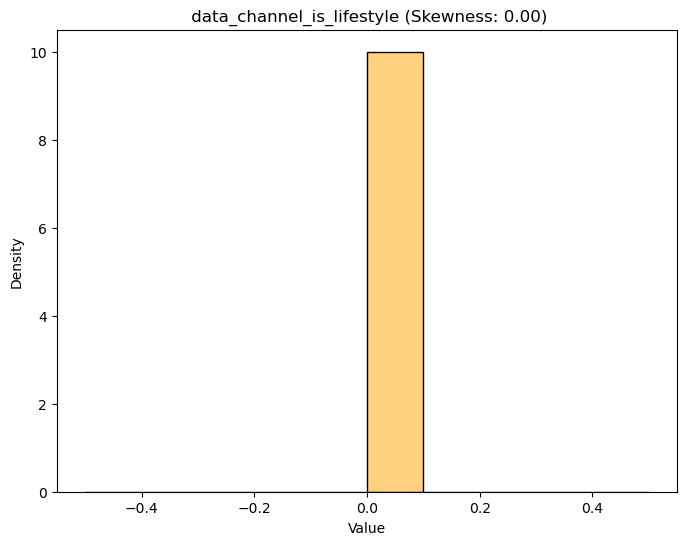

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


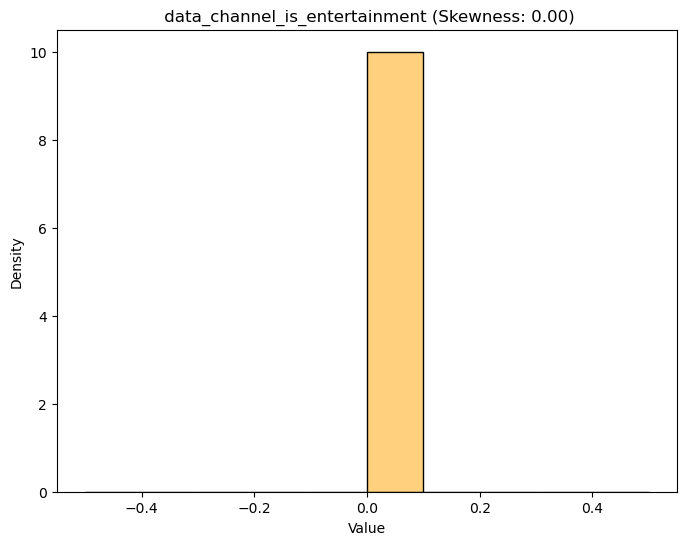

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


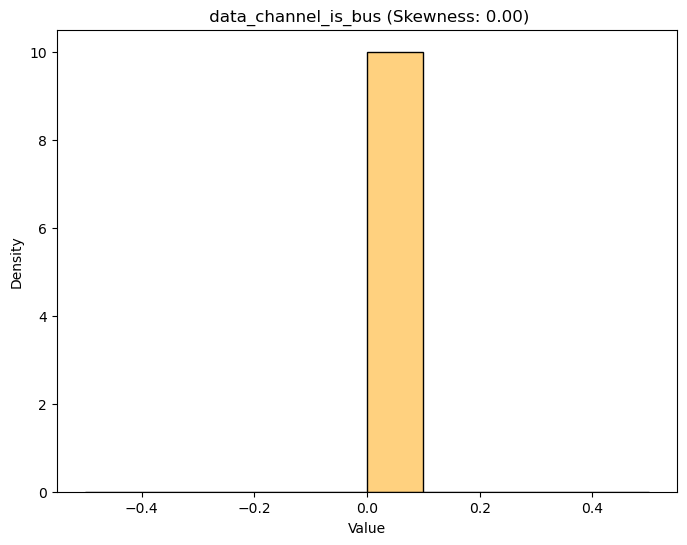

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


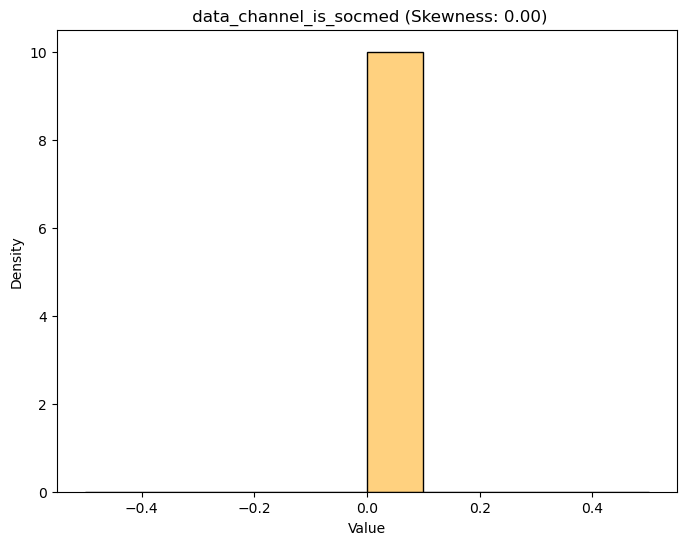

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


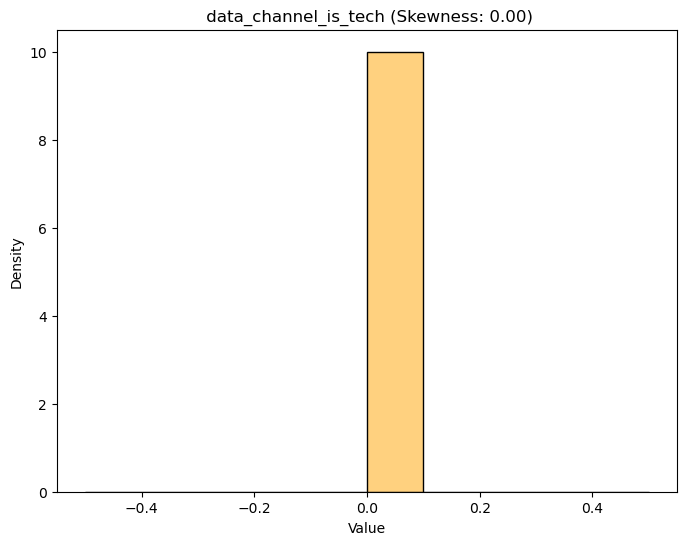

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


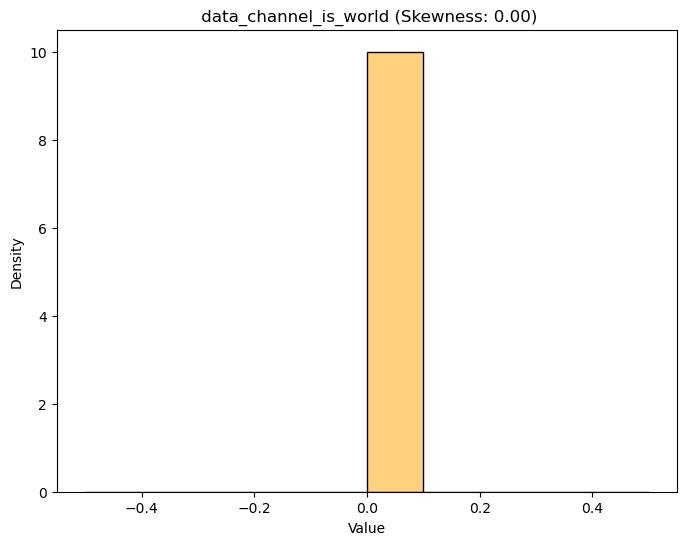

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


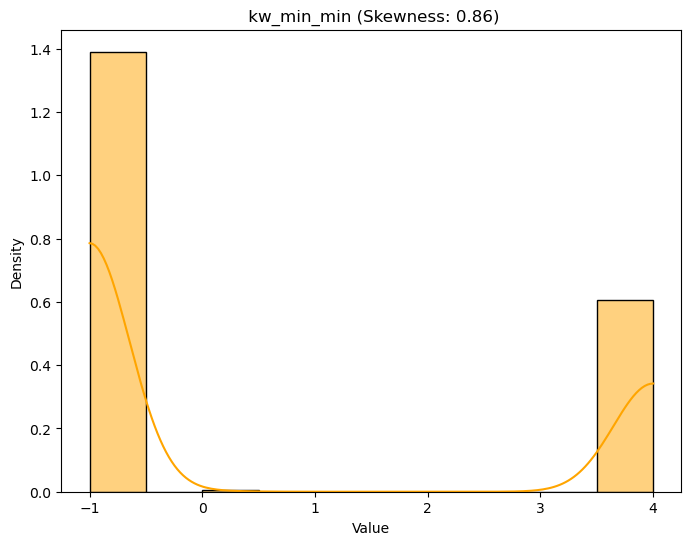

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


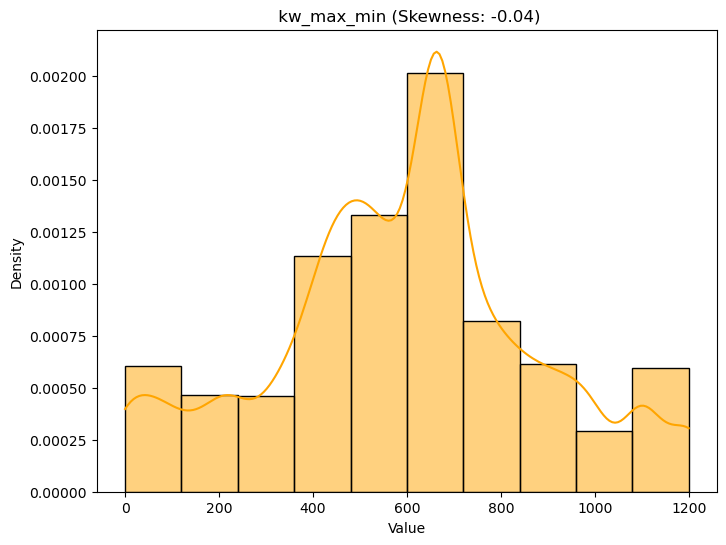

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


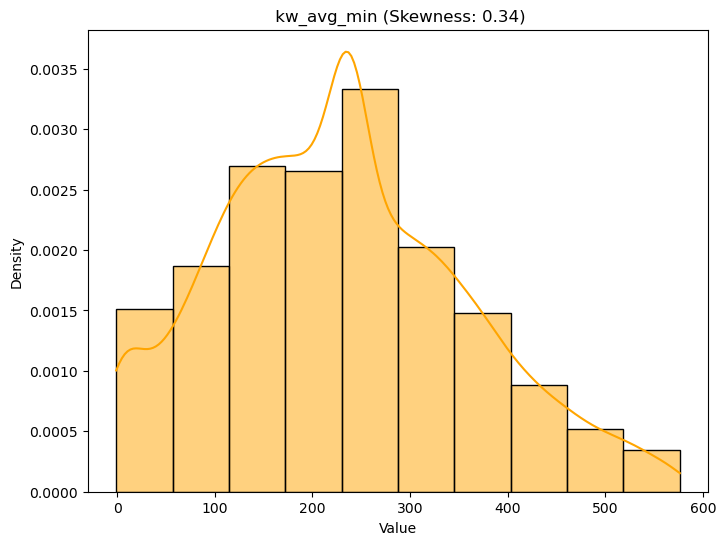

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


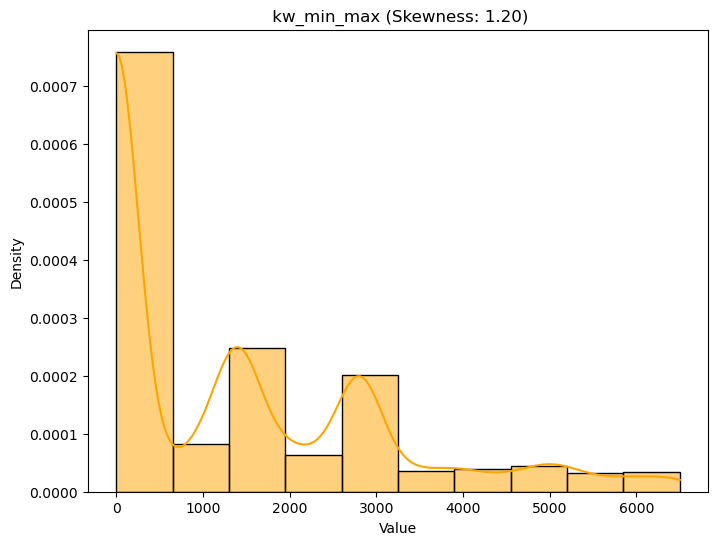

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


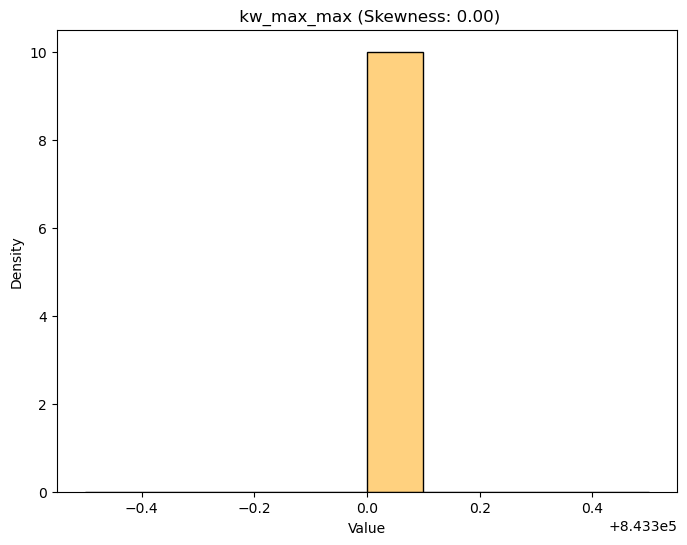

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


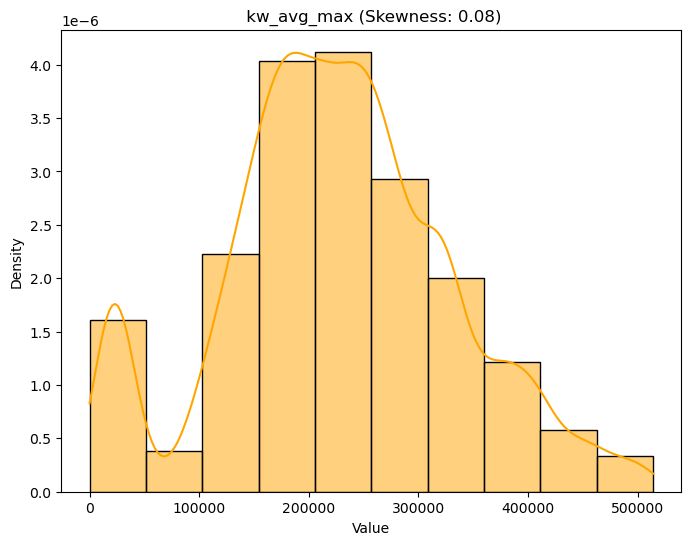

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


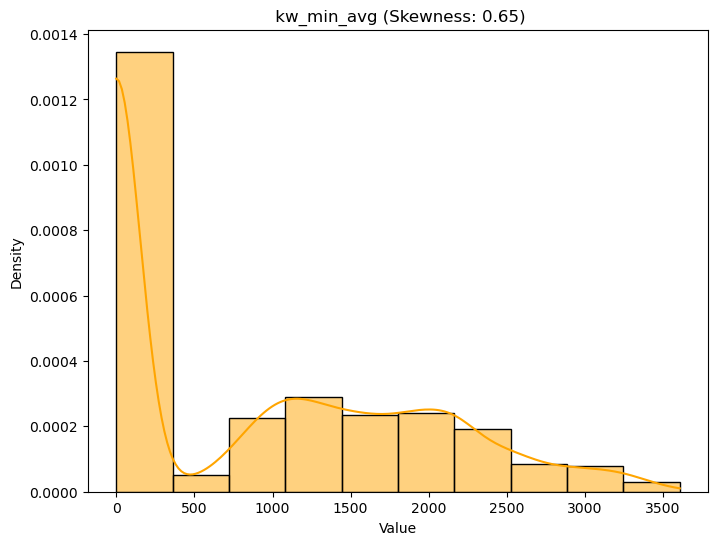

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


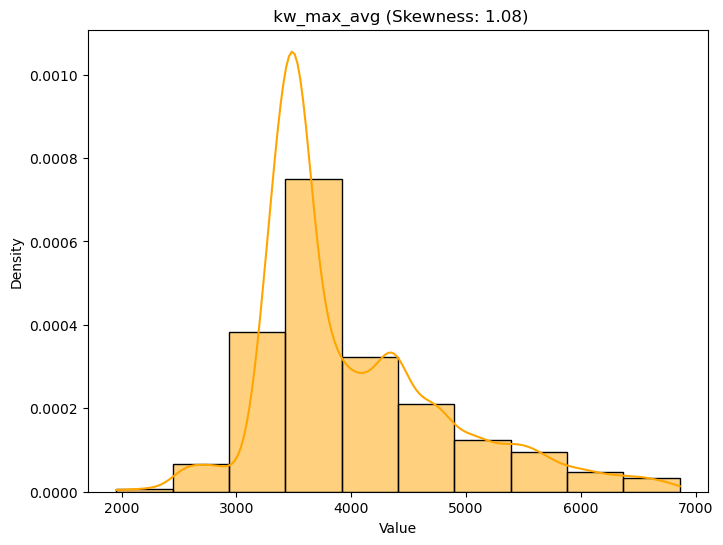

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


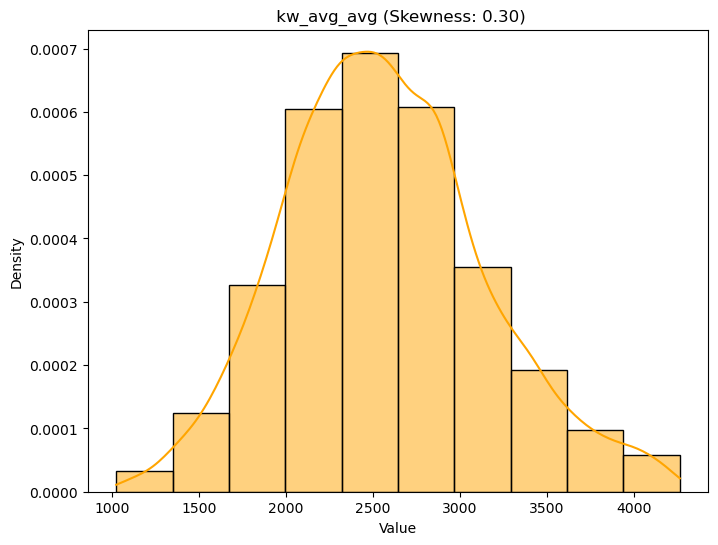

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


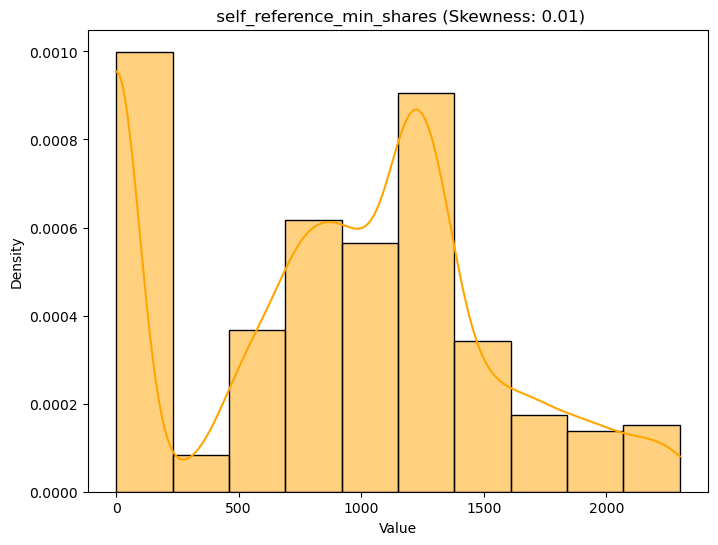

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


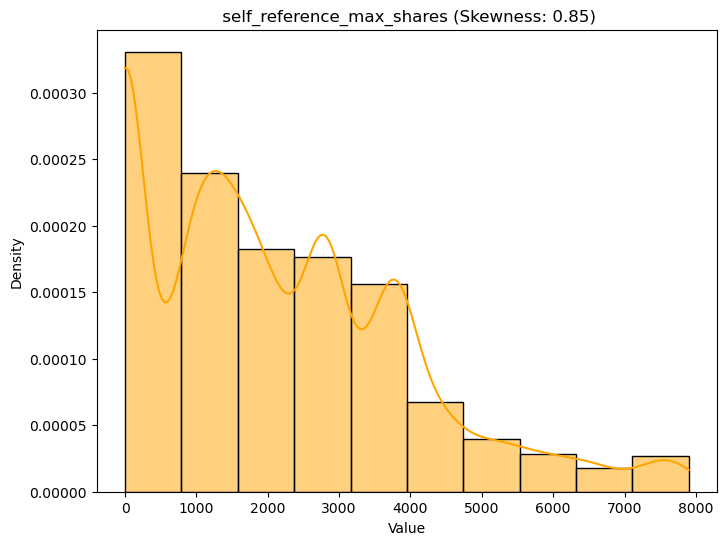

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


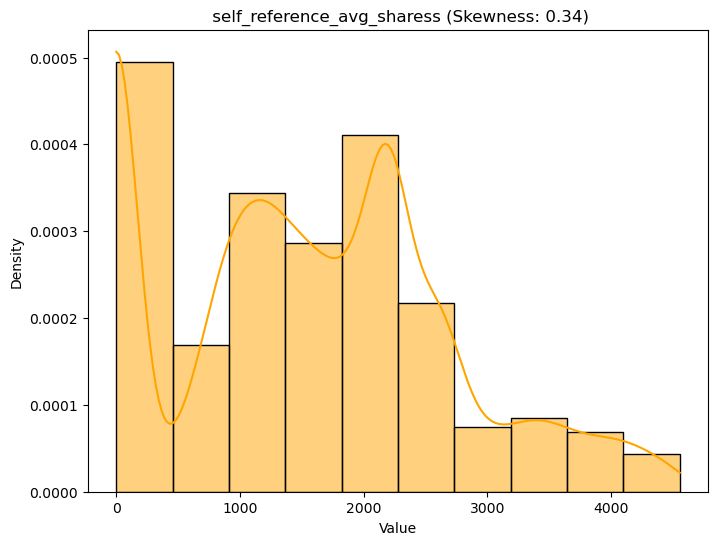

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


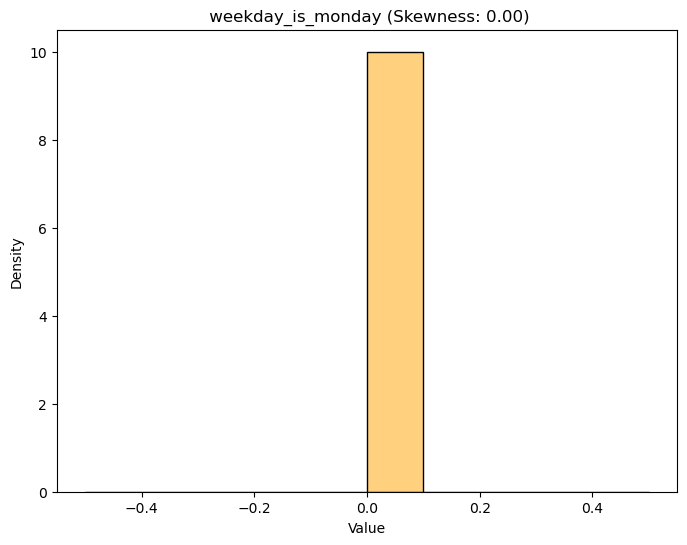

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


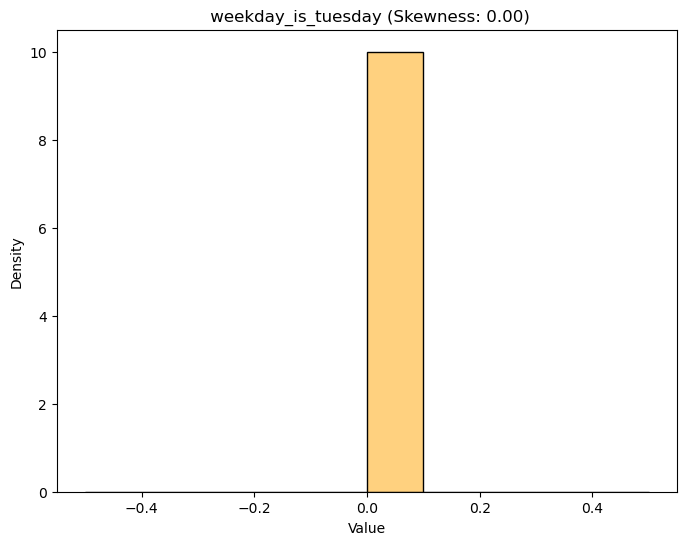

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


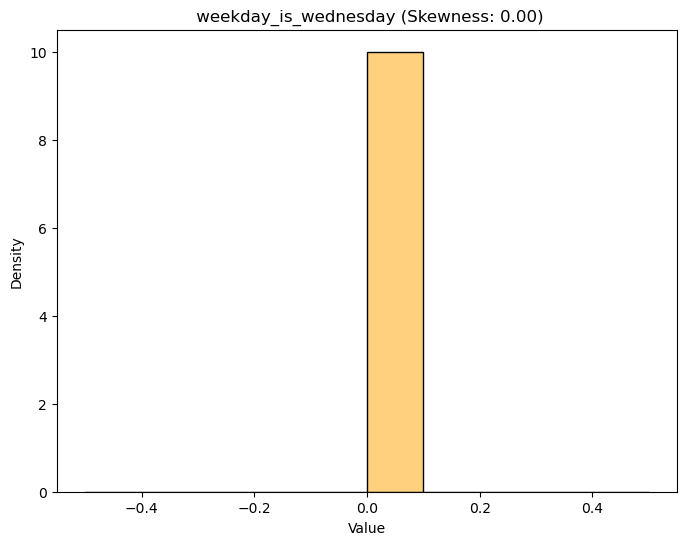

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


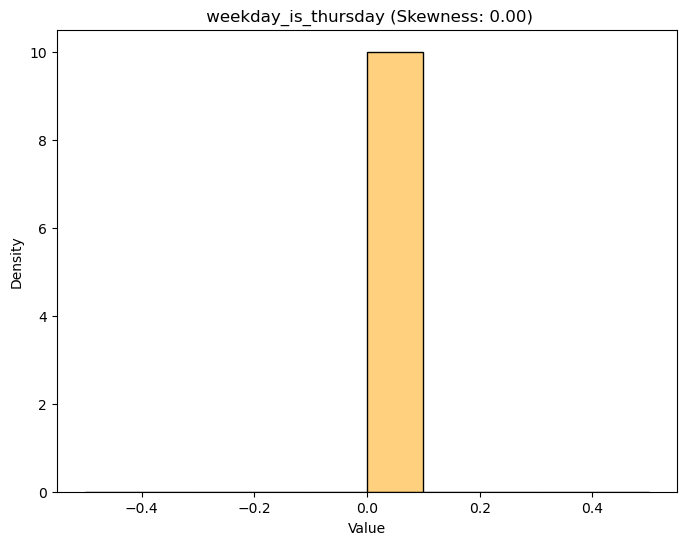

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


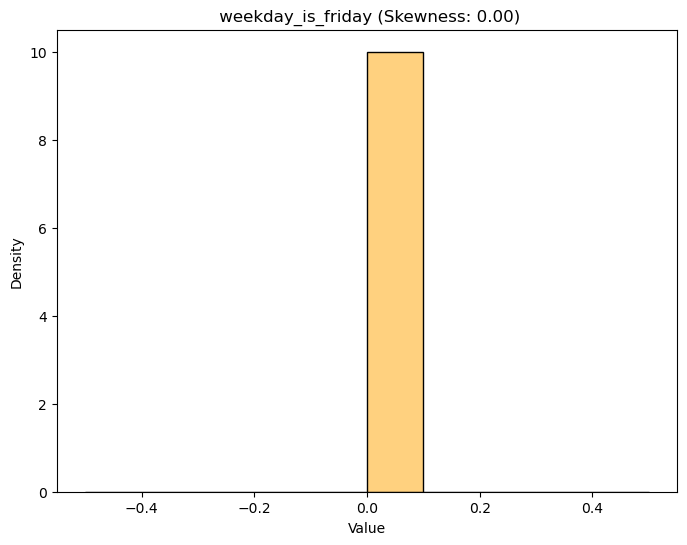

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


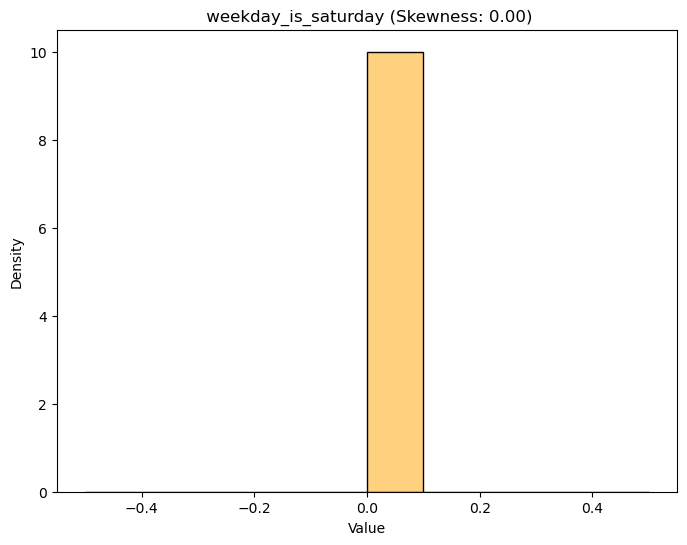

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


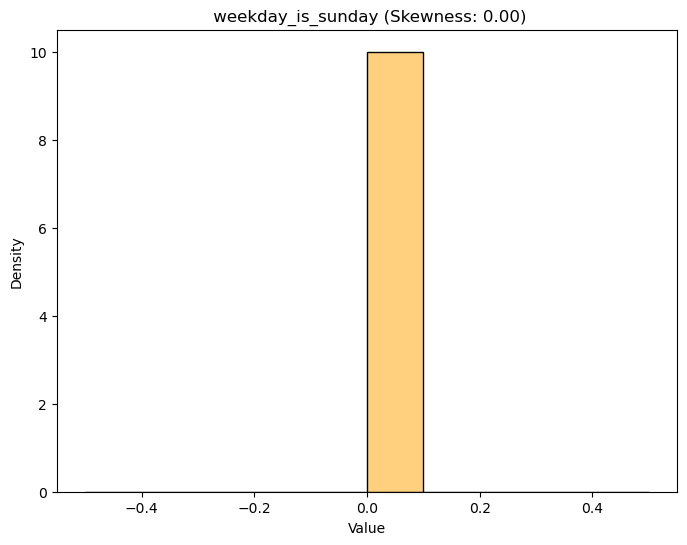

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


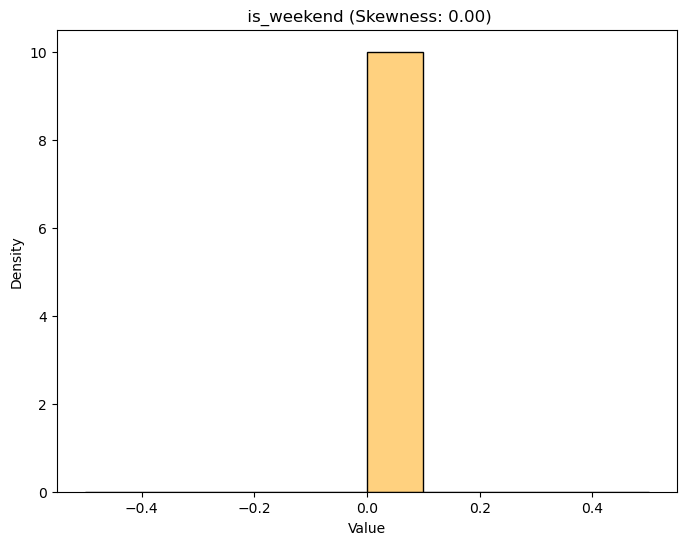

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


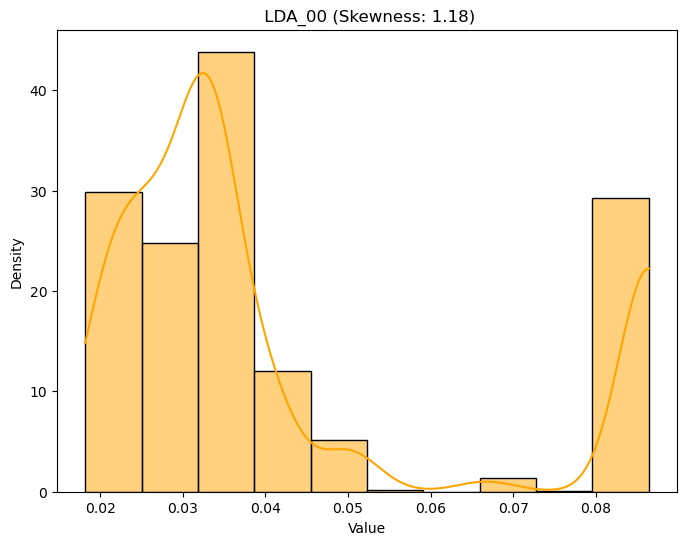

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


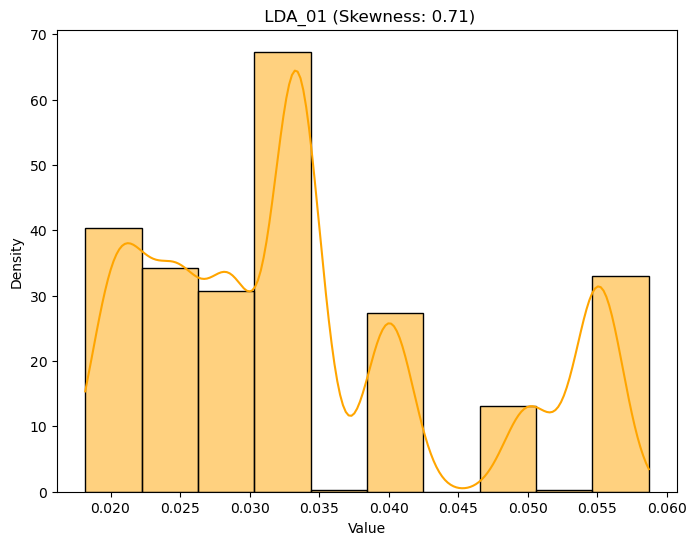

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


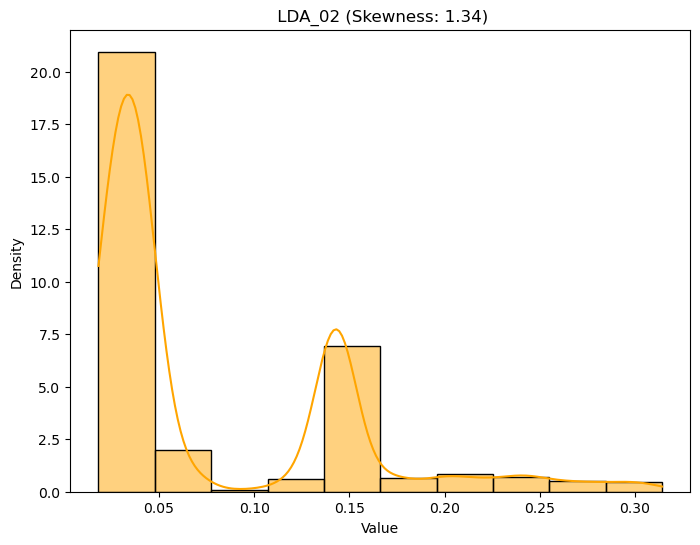

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


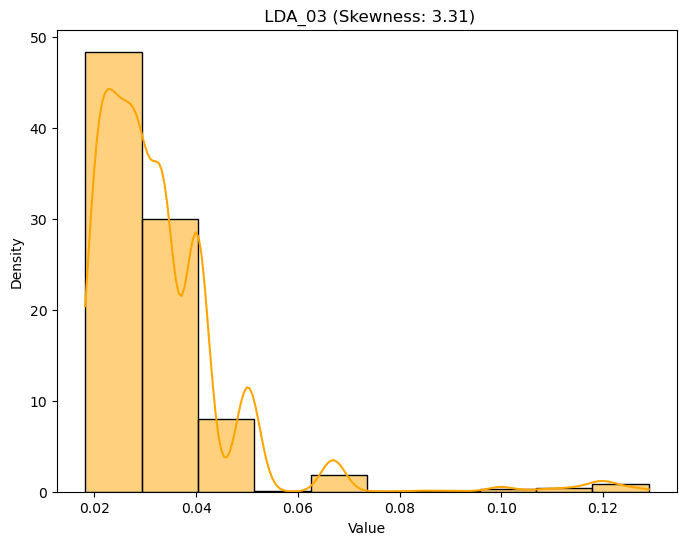

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


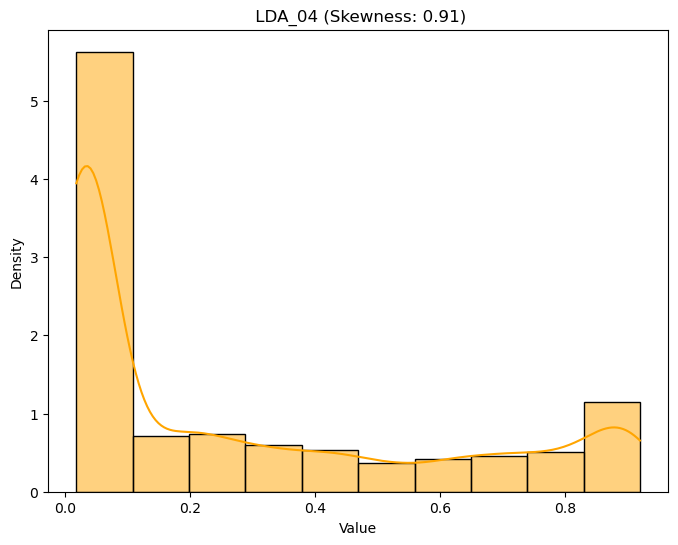

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


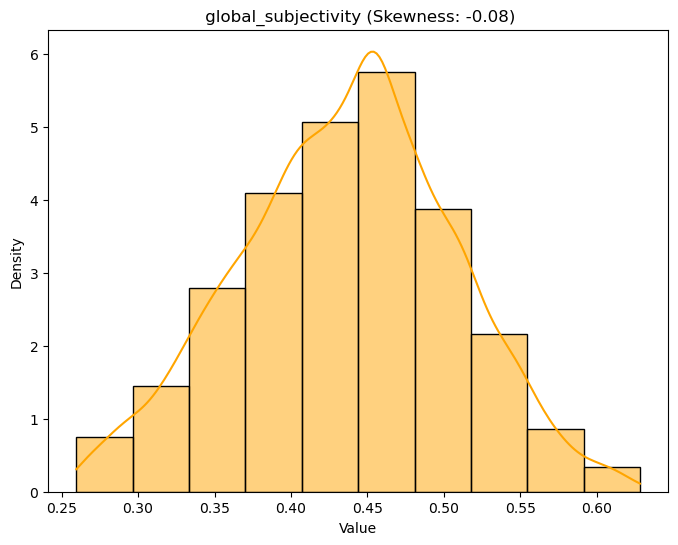

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


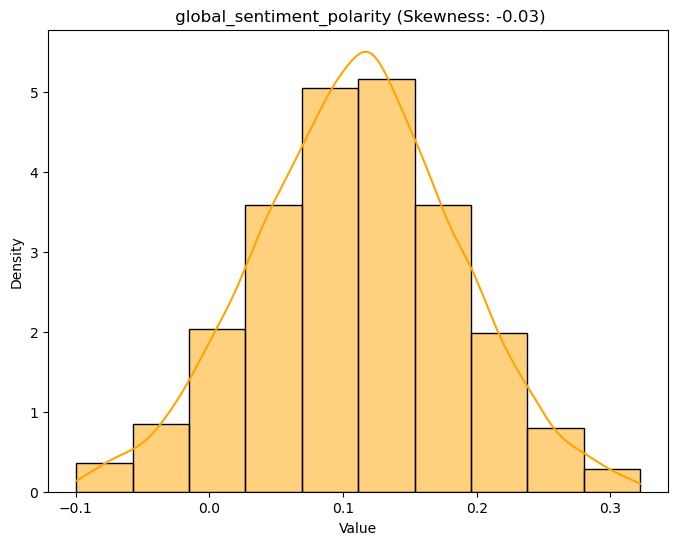

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


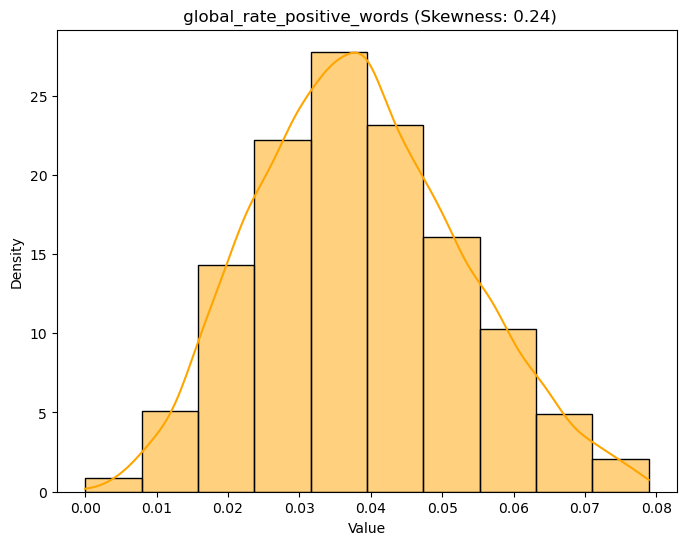

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


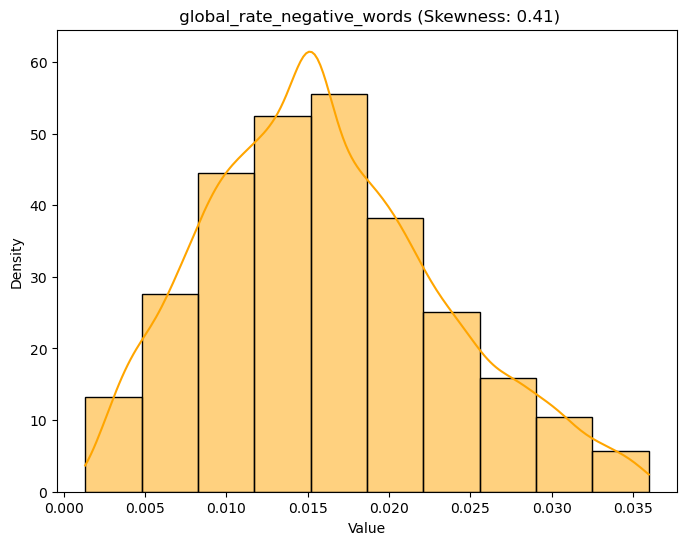

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


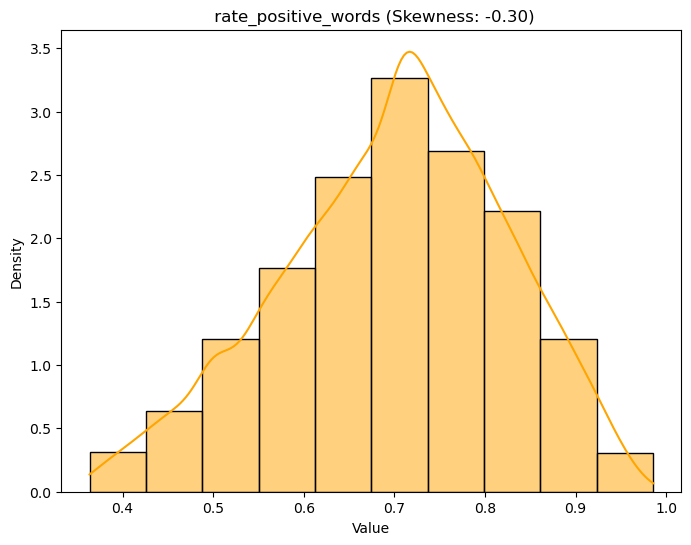

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


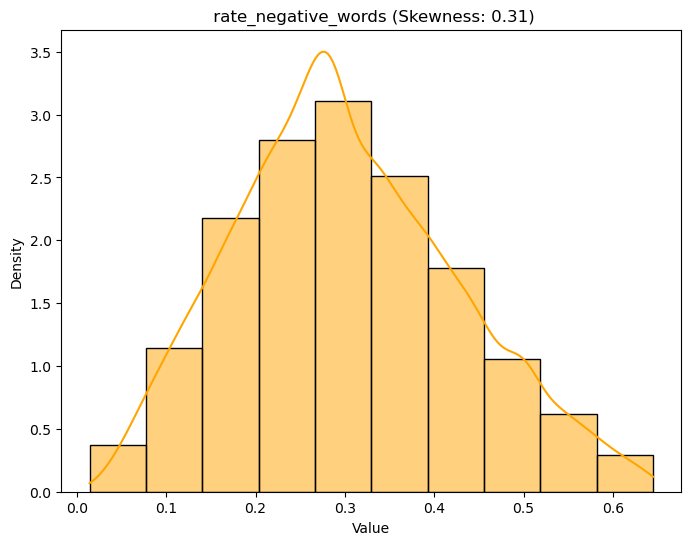

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


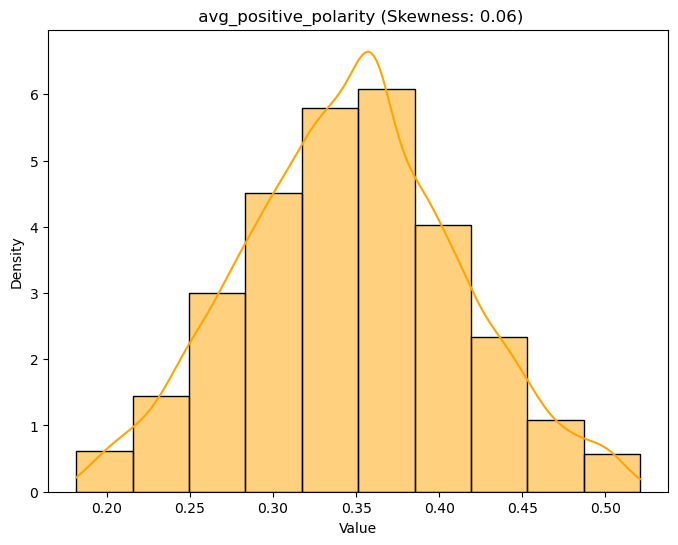

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


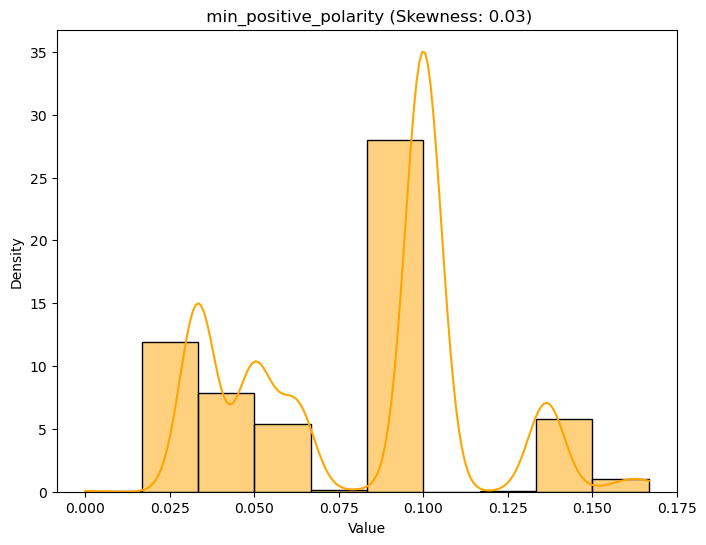

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


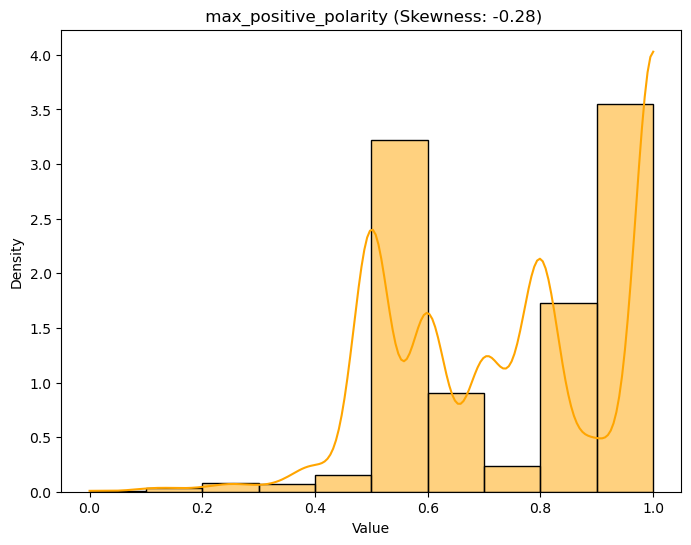

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


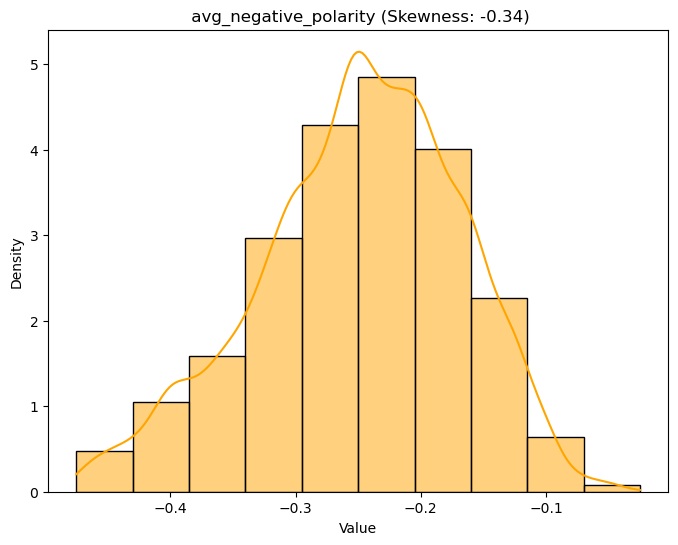

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


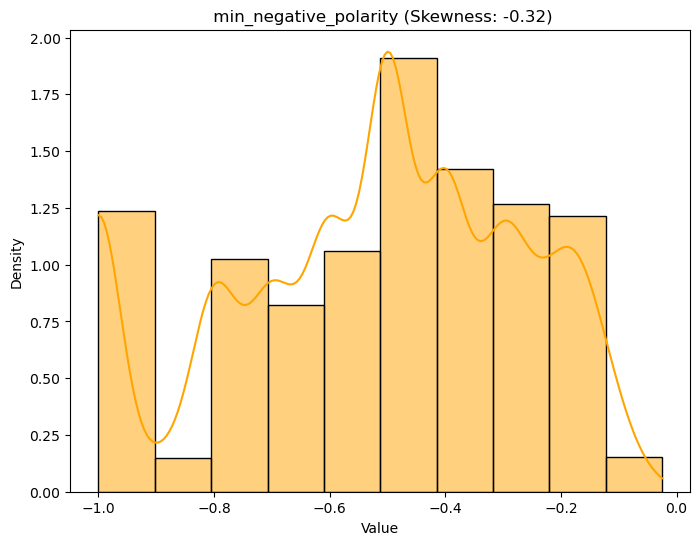

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


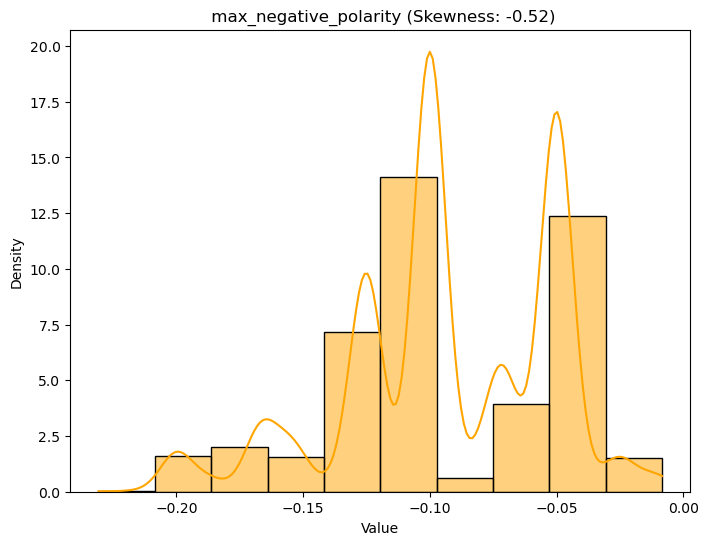

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


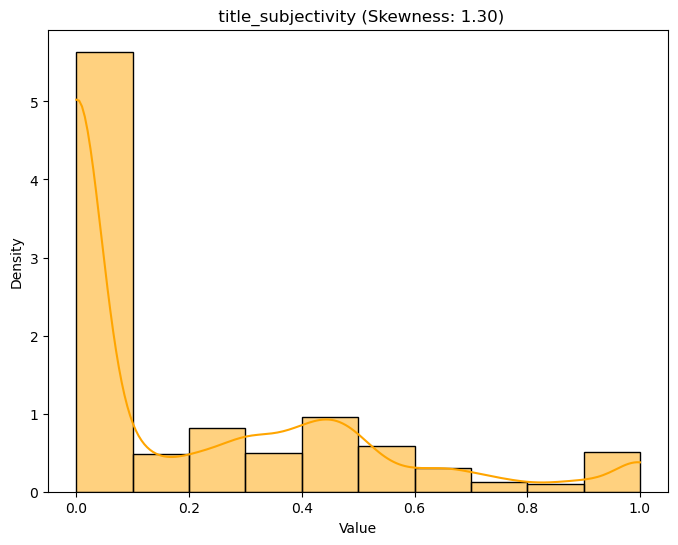

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


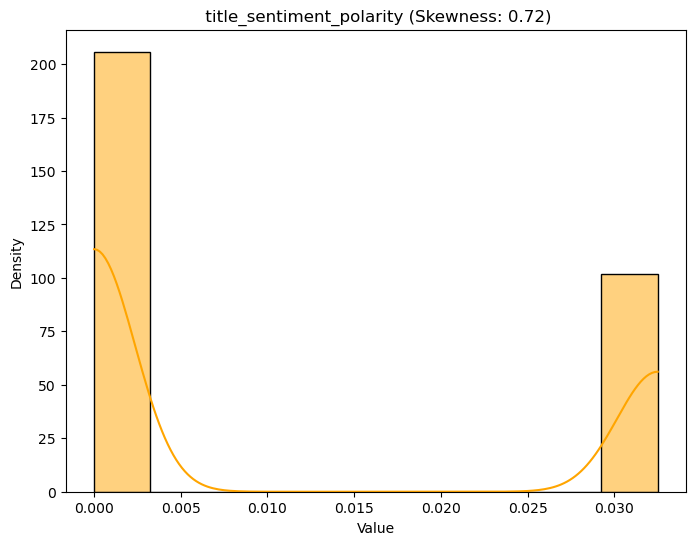

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


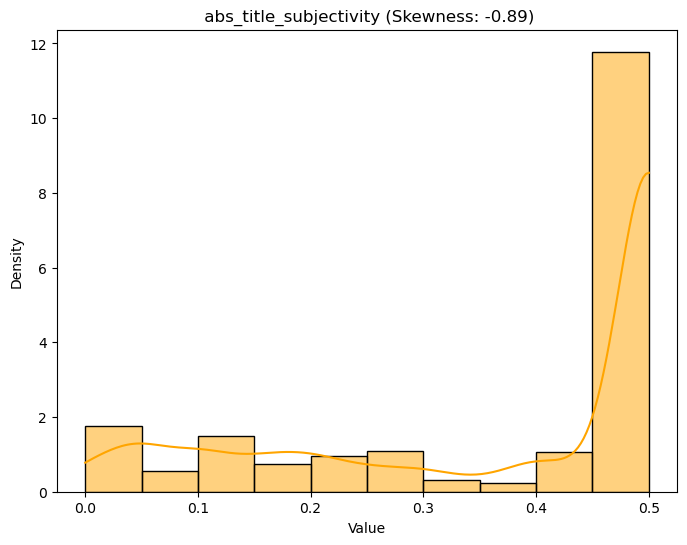

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


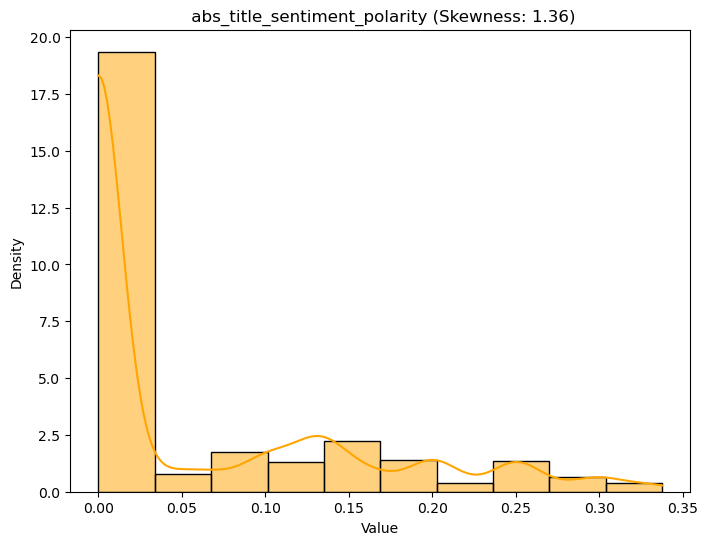

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


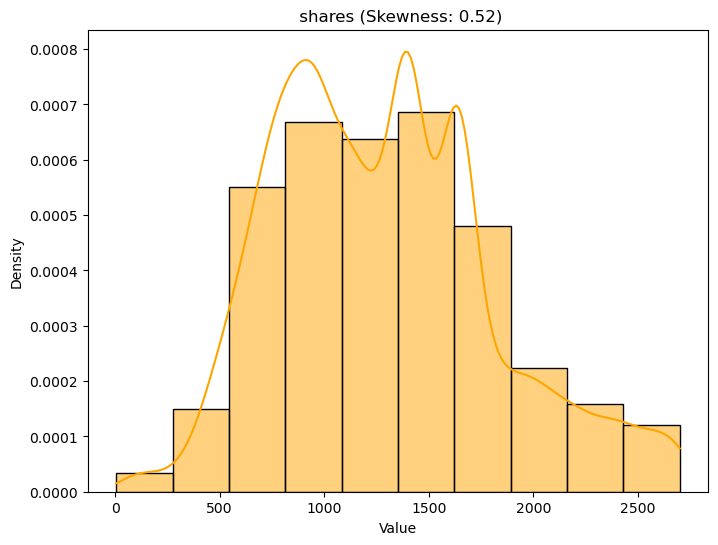

In [39]:
# Visualize skewness for multiple columns
numerical_columns = df5.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_columns:
    skewness = df5[col].skew()

    plt.figure(figsize=(8, 6))
    sns.histplot(df5[col], kde=True, bins=10, color='orange', stat='density')
    plt.title(f'{col} (Skewness: {skewness:.2f})')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.show()

In [40]:
selected_features = [' timedelta', ' n_tokens_title', ' n_tokens_content',
       ' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       ' num_hrefs', ' num_self_hrefs', ' num_imgs', ' num_videos',
       ' average_token_length', ' num_keywords', ' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world', ' kw_min_min', ' kw_max_min', ' kw_avg_min',
       ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
       ' kw_max_avg', ' kw_avg_avg', ' self_reference_min_shares',
       ' self_reference_max_shares', ' self_reference_avg_sharess',
       ' LDA_00', ' LDA_01', ' LDA_02',
       ' LDA_03', ' LDA_04', ' global_subjectivity',
       ' global_sentiment_polarity', ' global_rate_positive_words',
       ' global_rate_negative_words', ' rate_positive_words',
       ' rate_negative_words', ' avg_positive_polarity',
       ' min_positive_polarity', ' max_positive_polarity',
       ' avg_negative_polarity', ' min_negative_polarity',
       ' max_negative_polarity', ' title_subjectivity',
       ' title_sentiment_polarity', ' abs_title_subjectivity',
       ' abs_title_sentiment_polarity', ' shares']

# Create a new DataFrame with only the selected features
df5_selected = df5[selected_features]

In [41]:
# Create a dictionary where keys are feature names and values are the data for those features
data_dict = {feature: df5[feature].tolist() for feature in selected_features}

# Create the DataFrame using the dictionary
df5_selected = pd.DataFrame(data_dict)

# View the new DataFrame
print(df5_selected.head())

    timedelta   n_tokens_title   n_tokens_content   n_unique_tokens  \
0       731.0             12.0              219.0          0.663594   
1       731.0              9.0              255.0          0.604743   
2       731.0              9.0              531.0          0.503788   
3       731.0             13.0             1072.0          0.415646   
4       731.0             11.0               97.0          0.670103   

    n_non_stop_words   n_non_stop_unique_tokens   num_hrefs   num_self_hrefs  \
0                1.0                   0.815385         4.0              2.0   
1                1.0                   0.791946         3.0              1.0   
2                1.0                   0.665635         9.0              0.0   
3                1.0                   0.540890        19.0              3.0   
4                1.0                   0.836735         2.0              0.0   

    num_imgs   num_videos  ...   min_positive_polarity  \
0   1.000000          0.0  ...    

In [42]:
df6 = df5_selected

### Finding skew values

In [44]:
skew_values = df6.skew()
print(skew_values)

 timedelta                        0.119965
 n_tokens_title                   0.114311
 n_tokens_content                 0.691629
 n_unique_tokens                  0.093756
 n_non_stop_words                 0.000000
 n_non_stop_unique_tokens        -0.015742
 num_hrefs                        0.629402
 num_self_hrefs                   0.644380
 num_imgs                         0.900232
 num_videos                       1.749591
 average_token_length            -0.033595
 num_keywords                    -0.021304
 data_channel_is_lifestyle        0.000000
 data_channel_is_entertainment    0.000000
 data_channel_is_bus              0.000000
 data_channel_is_socmed           0.000000
 data_channel_is_tech             0.000000
 data_channel_is_world            0.000000
 kw_min_min                       0.857898
 kw_max_min                      -0.043261
 kw_avg_min                       0.337712
 kw_min_max                       1.195779
 kw_max_max                       0.000000
 kw_avg_max

### Handling skew values

In [46]:
import numpy as np
import pandas as pd
from scipy.stats import boxcox


def handle_skewness(df6, threshold=0.5):
    for column in df6.columns:
        skewness = df6[column].skew()

        if skewness > threshold:
            # Positively skewed: apply log or sqrt
            if (df6[column] > 0).all():  # Ensure there are no zero or negative values
                df6[column] = np.log1p(df6[column])  # log(1 + value)
            else:
                df6[column] = np.sqrt(df6[column])  # Square root transformation

        elif skewness < -threshold:
            # Negatively skewed: apply square or Box-Cox
            if (df6[column] >= 0).all():  # Ensure non-negative values for Box-Cox
                df6[column], _ = boxcox(df6[column] + 1)  # Add 1 to avoid zero values
            else:
                df6[column] = df6[column] ** 2  # Square the values

        # No action for moderately skewed data (-0.5 < skewness < 0.5)

    return df6

# Apply to your dataset
data_transformed = handle_skewness(df6)


C:\Users\Najma\anaconda3\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [47]:
data_transformed

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,731.0,12.0,5.393628,0.663594,1.0,0.815385,2.000000,1.414214,0.693147,0.000000,...,0.100000,0.70,-0.350000,-0.600,0.040000,0.707107,0.180295,0.000000,0.433013,6.386879
1,731.0,9.0,5.545177,0.604743,1.0,0.791946,1.732051,1.000000,0.693147,0.000000,...,0.033333,0.70,-0.118750,-0.125,0.010000,0.000000,0.000000,2.132599,0.000000,6.568078
2,731.0,9.0,6.276643,0.503788,1.0,0.665635,3.000000,0.000000,0.693147,0.000000,...,0.136364,0.80,-0.369697,-0.600,0.027778,0.000000,0.000000,2.132599,0.000000,7.090910
3,731.0,13.0,6.978214,0.415646,1.0,0.540890,4.358899,1.732051,0.693147,0.000000,...,0.033333,1.00,-0.220192,-0.500,0.002500,0.674200,0.180295,0.051828,0.369274,6.226537
4,731.0,11.0,4.584967,0.670103,1.0,0.836735,1.414214,0.000000,0.826206,0.000000,...,0.100000,0.80,-0.125000,-0.125,0.015625,0.353553,0.000000,1.120589,0.000000,7.403560
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11620,9.0,13.0,6.616065,0.465306,1.0,0.735849,2.000000,1.000000,0.693147,0.000000,...,0.100000,0.85,-0.375000,-1.000,0.002500,1.000000,0.000000,2.132599,0.000000,6.818924
11621,8.0,11.0,5.411646,0.653153,1.0,0.825758,2.236068,1.732051,0.693147,0.000000,...,0.100000,0.80,-0.250000,-0.250,0.010000,0.000000,0.000000,2.132599,0.000000,7.090910
11622,8.0,11.0,5.849325,0.529052,1.0,0.684783,3.000000,2.645751,0.693147,1.000000,...,0.100000,0.75,-0.260000,-0.500,0.015625,0.316228,0.000000,1.284430,0.000000,7.496097
11623,8.0,6.0,6.526495,0.539493,1.0,0.692661,3.162278,1.000000,0.693147,0.000000,...,0.062500,0.50,-0.205246,-0.500,0.000156,0.000000,0.000000,2.132599,0.000000,7.003974


In [48]:
df7 = data_transformed

### Detect and handle nan values

In [50]:
print(df7.isna().sum())

 timedelta                           0
 n_tokens_title                      0
 n_tokens_content                    0
 n_unique_tokens                     0
 n_non_stop_words                    0
 n_non_stop_unique_tokens            0
 num_hrefs                           0
 num_self_hrefs                      0
 num_imgs                            0
 num_videos                          0
 average_token_length                0
 num_keywords                        0
 data_channel_is_lifestyle           0
 data_channel_is_entertainment       0
 data_channel_is_bus                 0
 data_channel_is_socmed              0
 data_channel_is_tech                0
 data_channel_is_world               0
 kw_min_min                       8083
 kw_max_min                          0
 kw_avg_min                          0
 kw_min_max                          0
 kw_max_max                          0
 kw_avg_max                          0
 kw_min_avg                          2
 kw_max_avg              

In [51]:
# Fill NaN values with the median
df7.fillna(df7.median(), inplace=True)

In [52]:
print(df7.isna().sum())

 timedelta                        0
 n_tokens_title                   0
 n_tokens_content                 0
 n_unique_tokens                  0
 n_non_stop_words                 0
 n_non_stop_unique_tokens         0
 num_hrefs                        0
 num_self_hrefs                   0
 num_imgs                         0
 num_videos                       0
 average_token_length             0
 num_keywords                     0
 data_channel_is_lifestyle        0
 data_channel_is_entertainment    0
 data_channel_is_bus              0
 data_channel_is_socmed           0
 data_channel_is_tech             0
 data_channel_is_world            0
 kw_min_min                       0
 kw_max_min                       0
 kw_avg_min                       0
 kw_min_max                       0
 kw_max_max                       0
 kw_avg_max                       0
 kw_min_avg                       0
 kw_max_avg                       0
 kw_avg_avg                       0
 self_reference_min_shares  

In [53]:
# Check for duplicate columns
duplicate_columns = df7.columns[df7.columns.duplicated()]
print("Duplicate columns:", duplicate_columns.tolist())

Duplicate columns: []


### Correlation

In [55]:
numeric_data = df7.select_dtypes(include = ['int64','float64'])
correlation_matrix = numeric_data.corr()
correlation_matrix

,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
timedelta,1.000000,-0.254255,-0.156167,0.136679,-0.130623,0.097398,-0.003873,-0.050326,-0.210771,-0.151751,...,-0.001841,0.030885,0.070962,0.145164,0.058546,-0.027777,-0.020810,0.030437,-0.028067,0.024732
n_tokens_title,-0.254255,1.000000,0.029372,-0.047810,0.042267,-0.038739,-0.036151,0.058232,0.099830,0.087202,...,0.017233,0.003867,-0.039533,-0.059327,-0.001560,0.148758,0.160136,-0.180089,0.150613,-0.014547
n_tokens_content,-0.156167,0.029372,1.000000,-0.741997,0.766084,-0.589118,0.372616,-0.065997,-0.060166,-0.026980,...,-0.267947,0.353217,-0.125198,-0.371396,-0.333302,-0.004418,-0.012798,0.011367,-0.007897,0.006350
n_unique_tokens,0.136679,-0.047810,-0.741997,1.000000,-0.753736,0.867262,-0.273158,-0.017954,0.057744,0.023607,...,0.270255,-0.340162,0.070280,0.341031,0.323817,-0.000795,0.018602,-0.004676,0.014547,-0.060405
n_non_stop_words,-0.130623,0.042267,0.766084,-0.753736,1.000000,-0.627269,0.366584,-0.049857,-0.023195,-0.008835,...,-0.294493,0.378682,-0.132319,-0.407755,-0.332502,0.033792,0.010916,-0.022979,0.015221,0.018559
n_non_stop_unique_tokens,0.097398,-0.038739,-0.589118,0.867262,-0.627269,1.000000,-0.268403,-0.069059,0.076356,0.033294,...,0.206785,-0.242648,0.016782,0.231226,0.244438,-0.014401,-0.002083,0.014058,-0.002481,-0.054054
num_hrefs,-0.003873,-0.036151,0.372616,-0.273158,0.366584,-0.268403,1.000000,0.074739,-0.082306,-0.044544,...,-0.160769,0.184001,-0.058136,-0.167303,-0.127841,-0.001527,-0.027148,0.013033,-0.019924,0.038827
num_self_hrefs,-0.050326,0.058232,-0.065997,-0.017954,-0.049857,-0.069059,0.074739,1.000000,0.078169,0.089432,...,-0.019132,-0.058569,0.023162,0.057502,0.054904,-0.027513,-0.022559,0.023691,-0.023349,0.073867
num_imgs,-0.210771,0.099830,-0.060166,0.057744,-0.023195,0.076356,-0.082306,0.078169,1.000000,0.188784,...,0.056420,-0.017023,-0.027862,-0.039192,0.015409,0.037675,0.029919,-0.041261,0.035594,0.055572
num_videos,-0.151751,0.087202,-0.026980,0.023607,-0.008835,0.033294,-0.044544,0.089432,0.188784,1.000000,...,0.016476,-0.025089,-0.049747,-0.039332,0.025558,0.035733,0.023130,-0.024193,0.028560,0.024714


C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\matrix.py:260: FutureWarning: Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior
  annotation = ("{:" + self.fmt + "}").format(val)


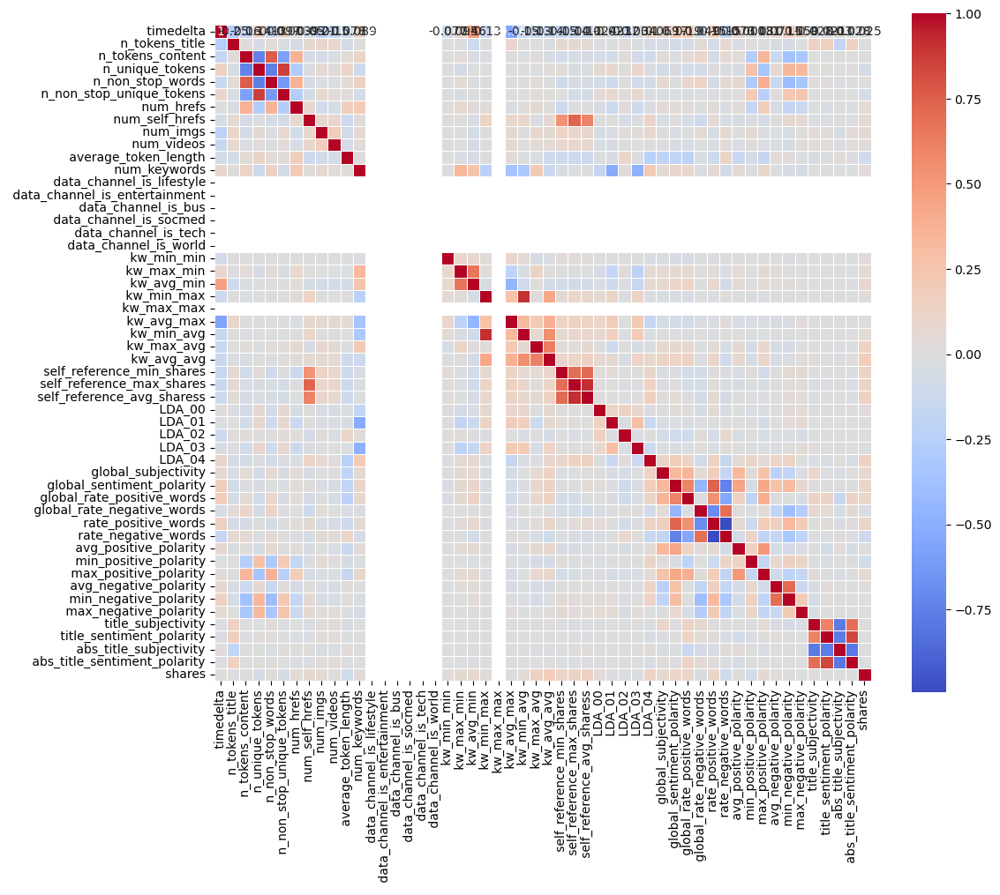

In [56]:
plt.figure(figsize = (12,10))
sns.heatmap(correlation_matrix , annot = True , cmap = 'coolwarm' , square = True , linewidth = .5)
plt.show()

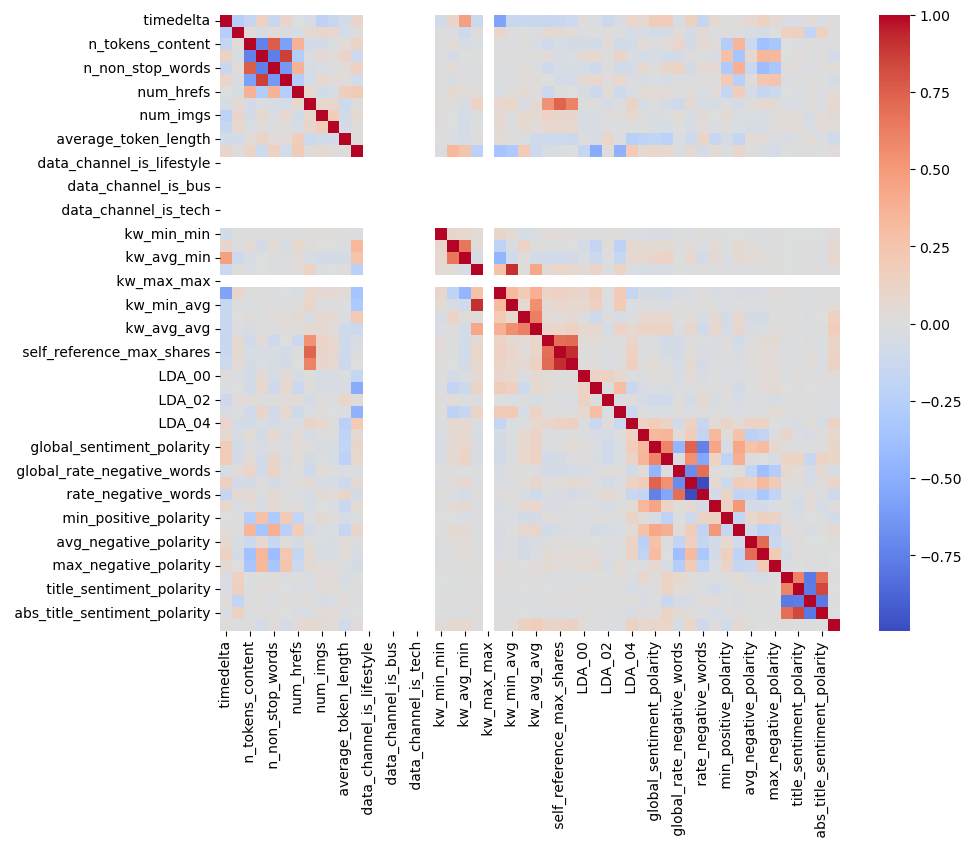

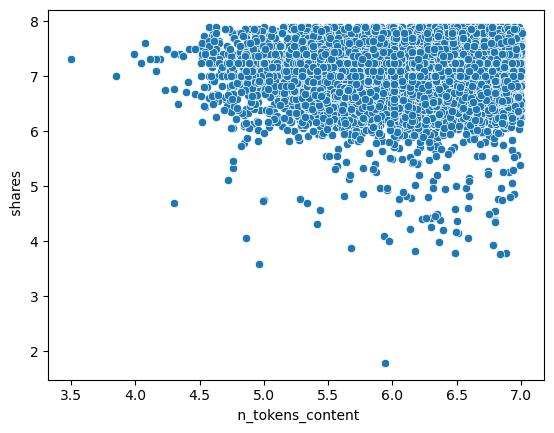

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt

# Visualize correlation between features and the target variable 'shares'
plt.figure(figsize=(10, 8))
sns.heatmap(df7.corr(), cmap="coolwarm", annot=False)
plt.show()

# Scatter plot to check relation between number of words and shares
sns.scatterplot(x=' n_tokens_content', y=' shares', data=df7)
plt.show()

### Histoplot to display the distribution of a dataset
A histogram helps to understand the shape of the distribution (e.g., normal, skewed, uniform) of continuous data by showing the frequency of data within certain ranges.
It visually summarizes the data, helping to quickly observe if the data is centered, skewed, or contains outliers.

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


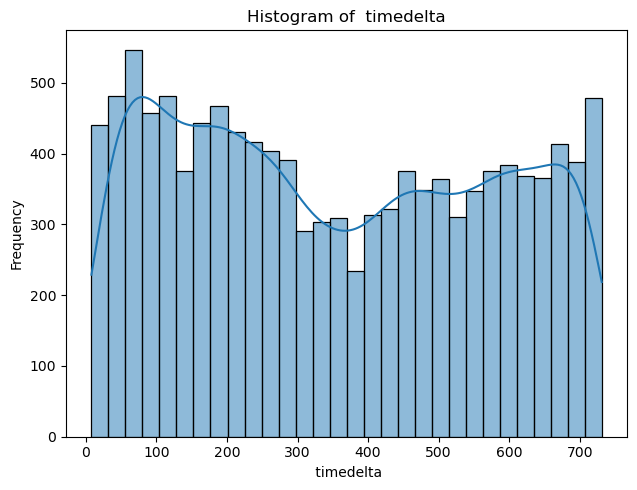

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


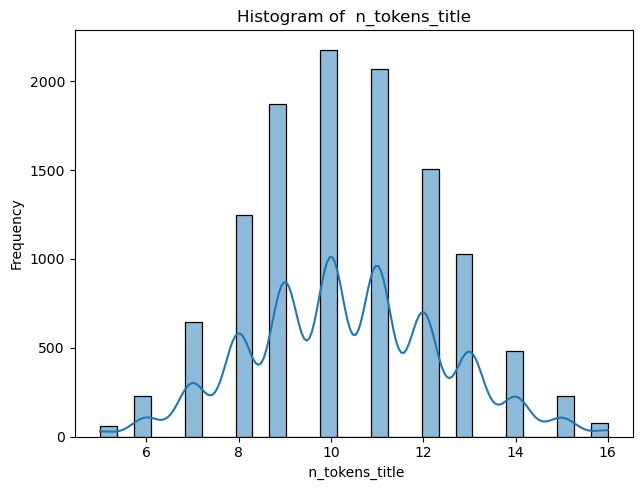

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


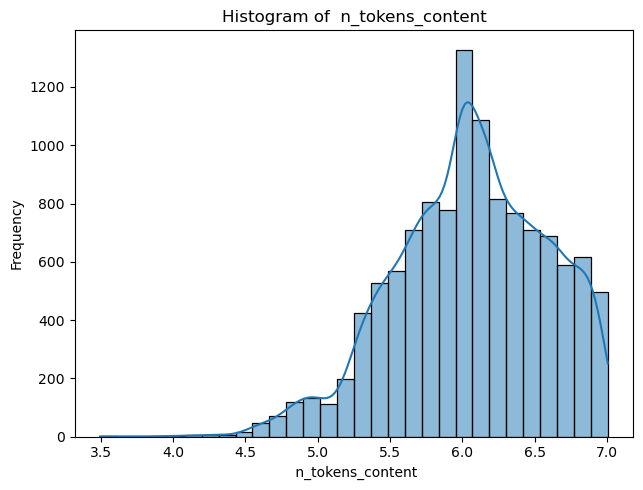

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


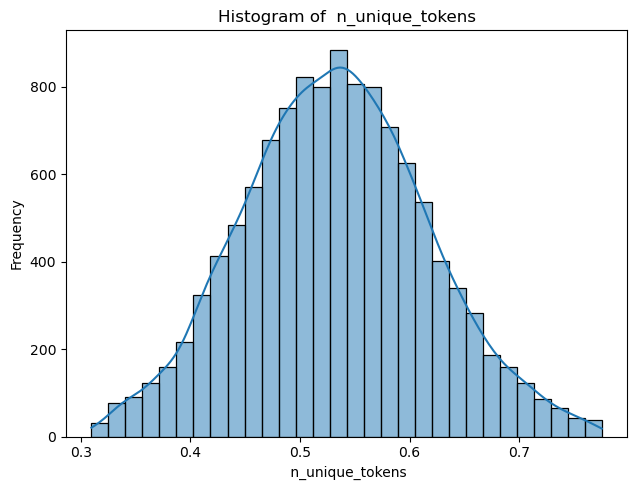

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


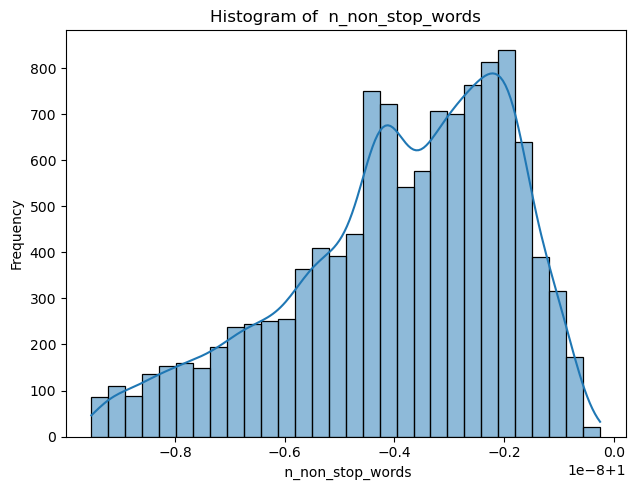

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


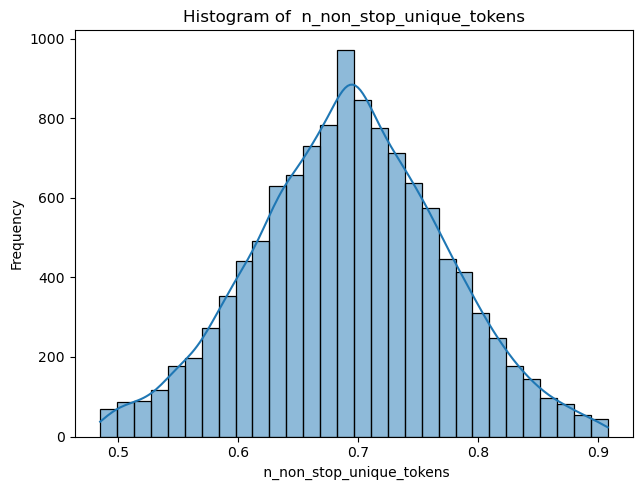

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


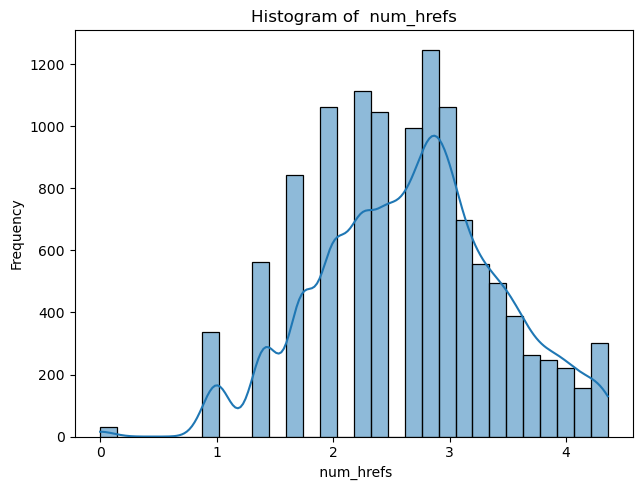

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


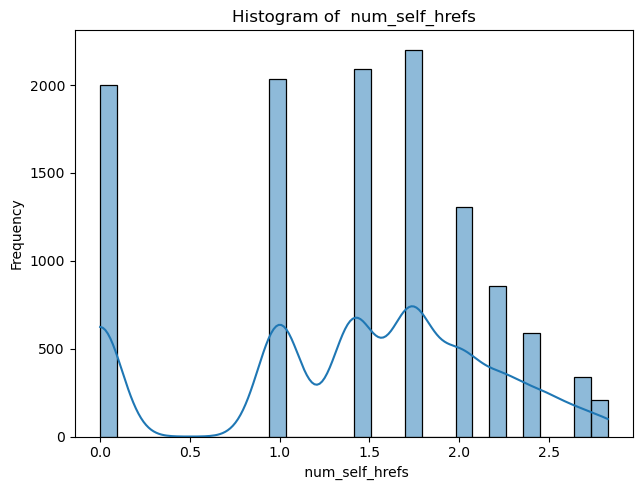

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


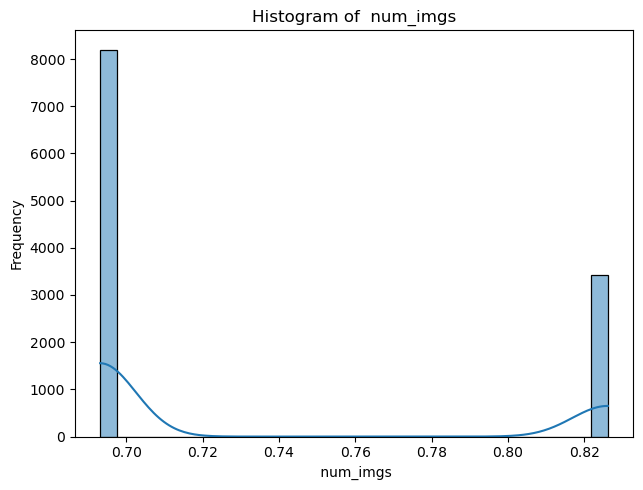

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


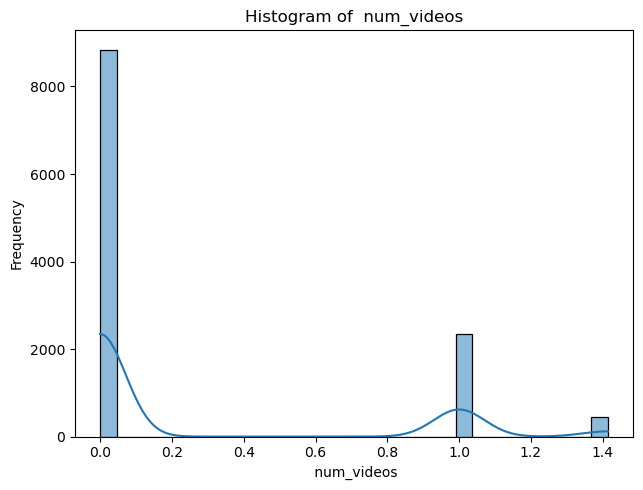

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


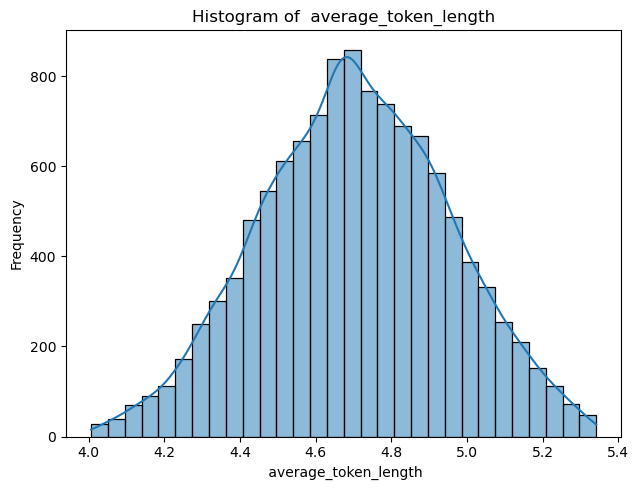

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


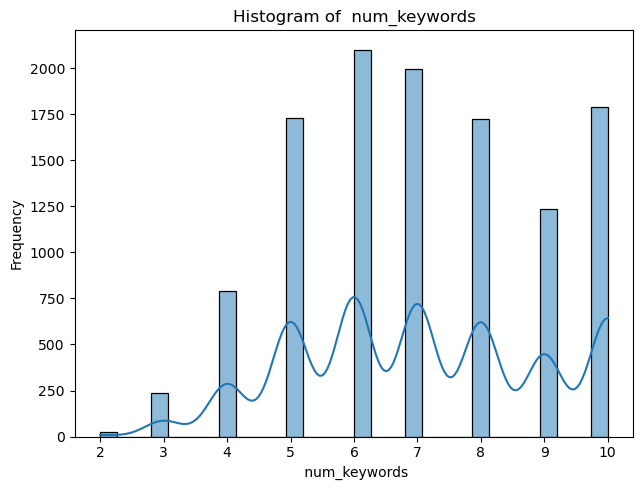

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


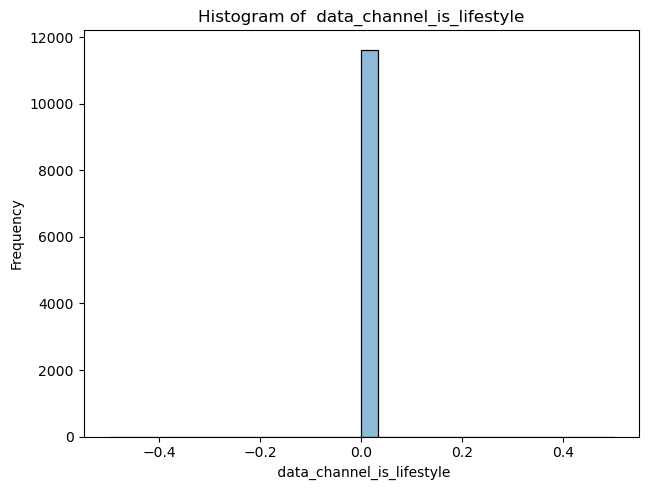

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


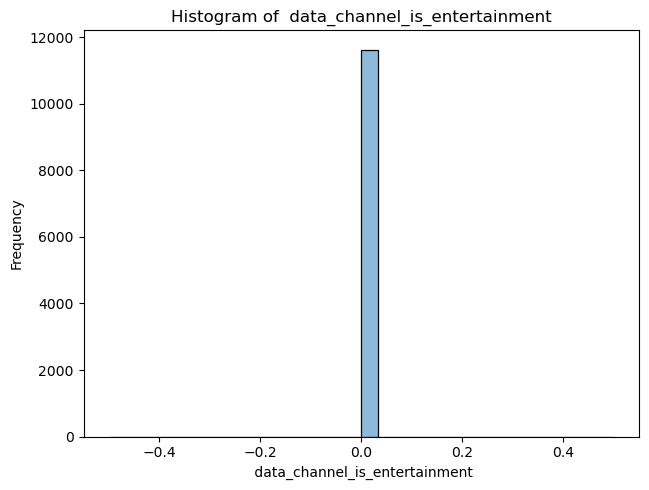

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


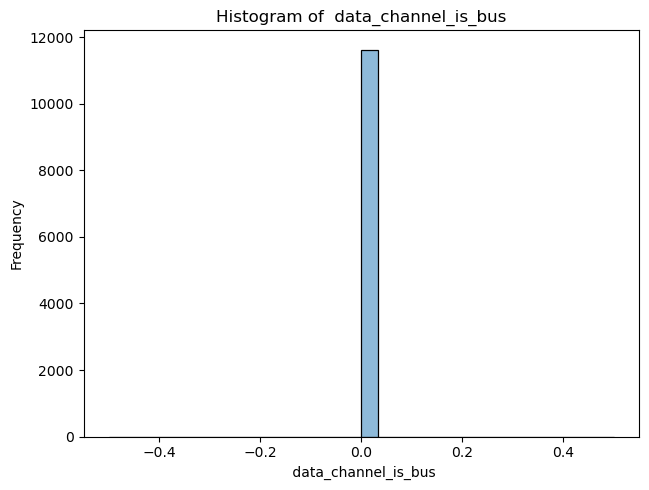

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


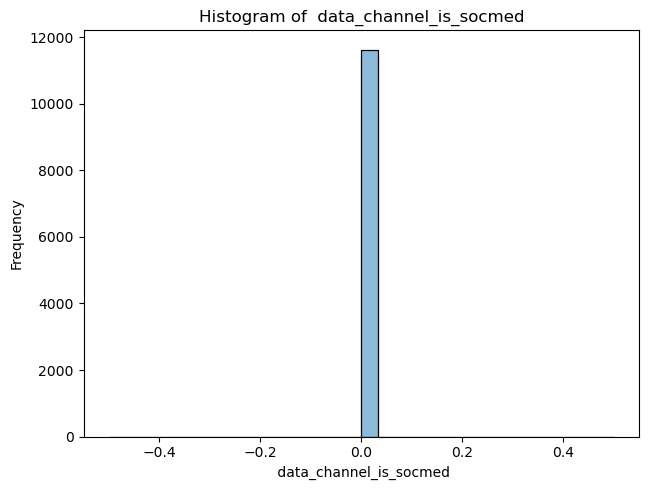

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


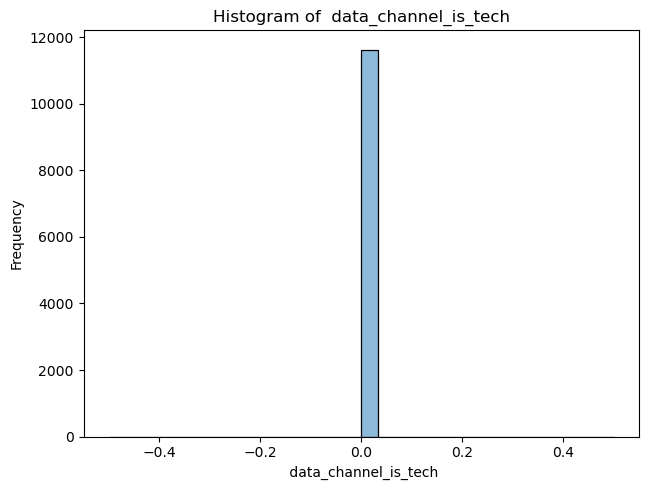

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


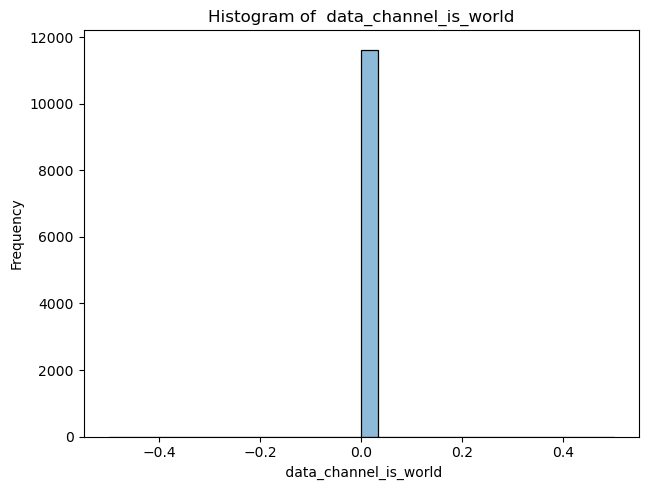

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


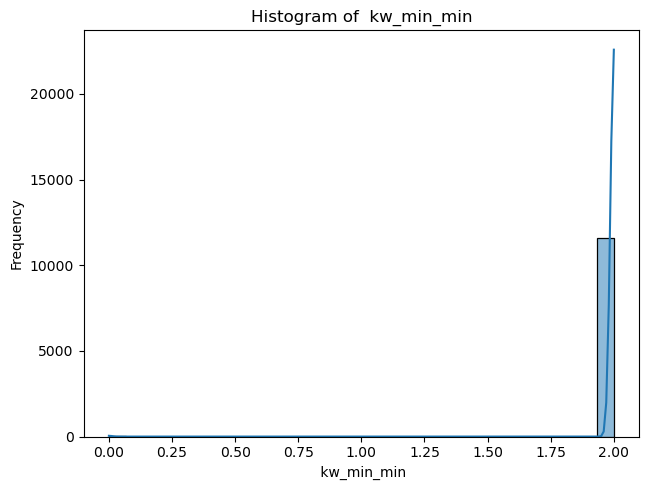

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


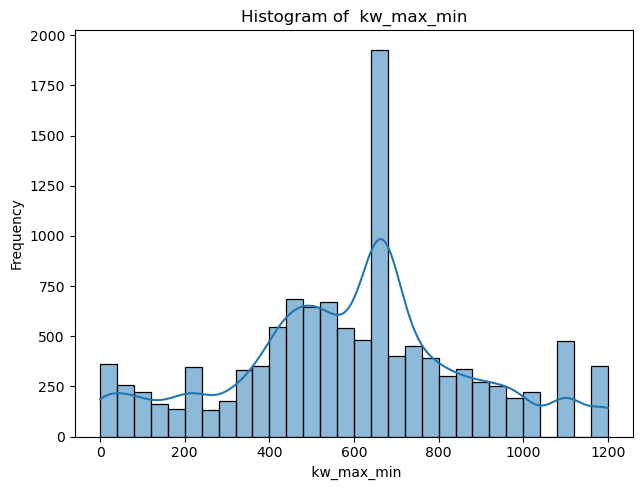

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


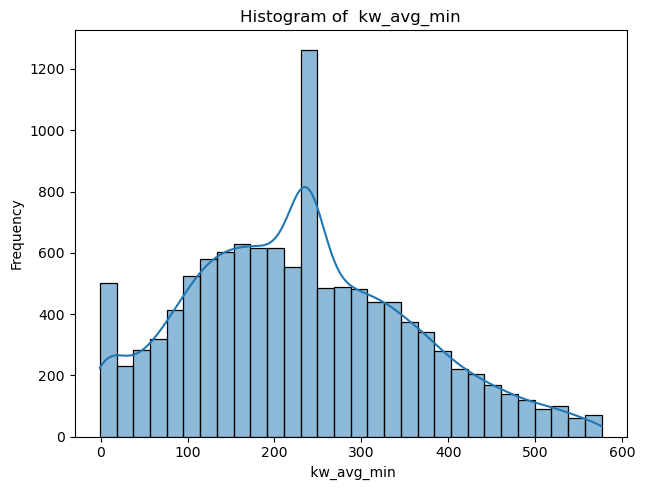

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


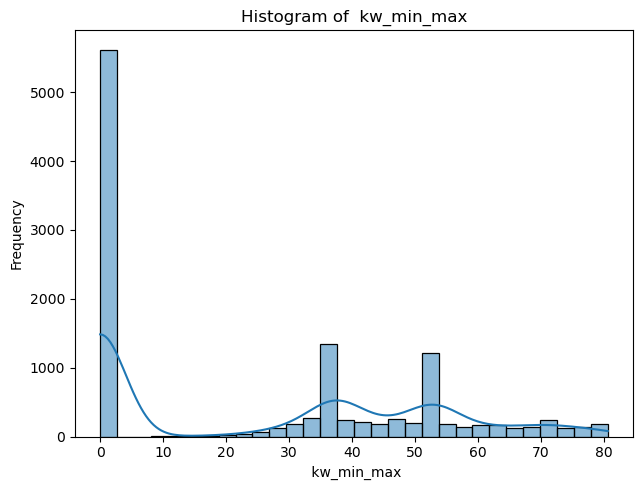

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


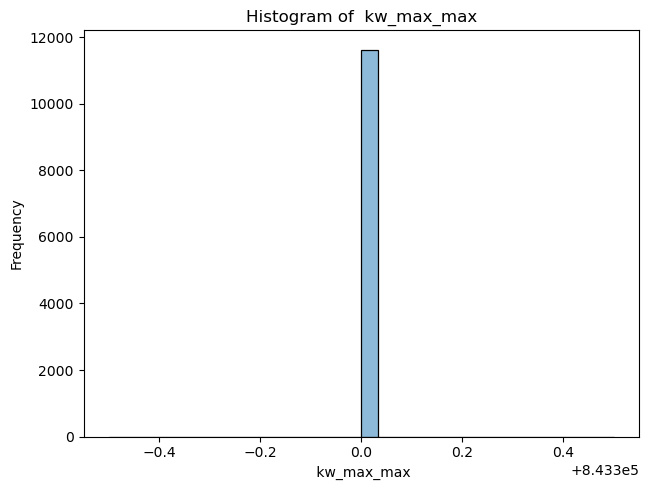

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


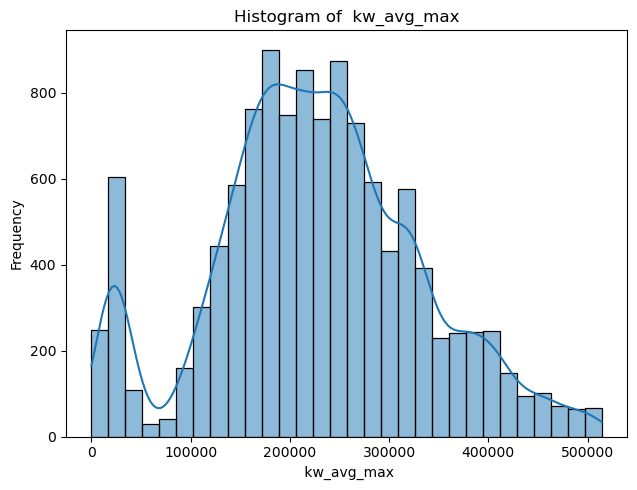

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


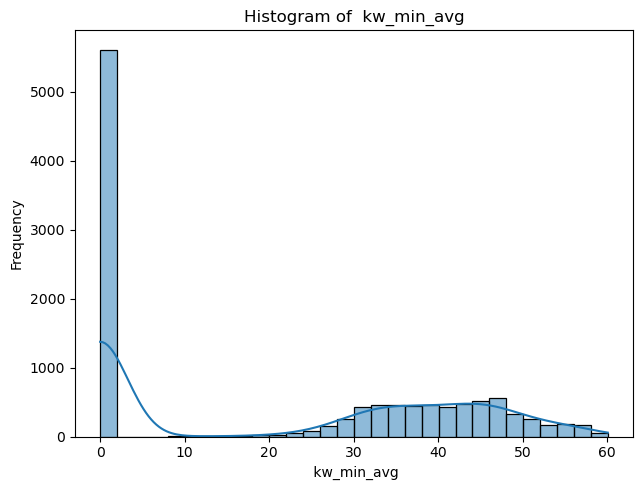

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


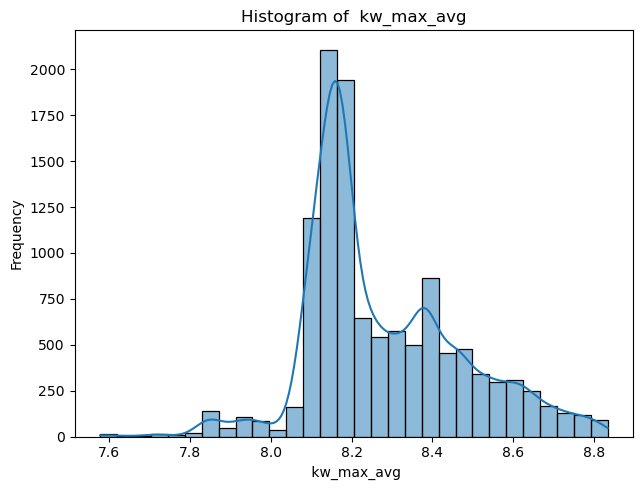

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


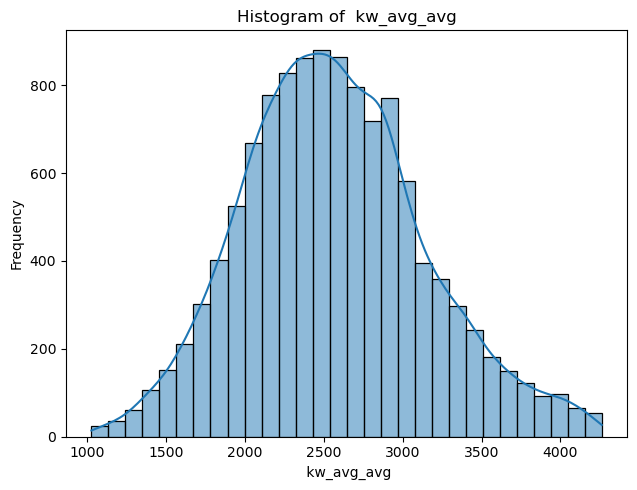

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


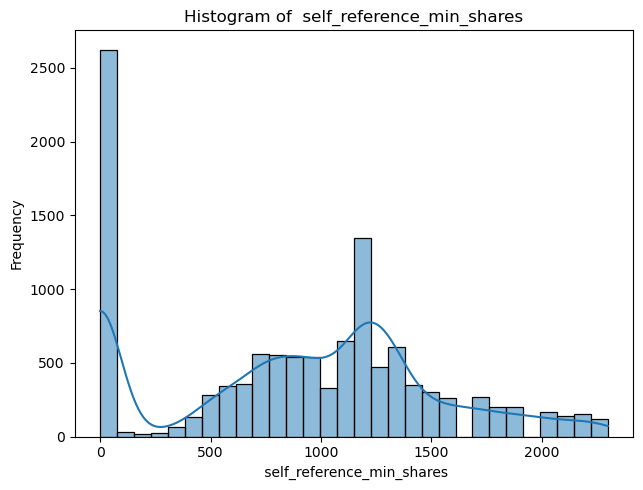

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


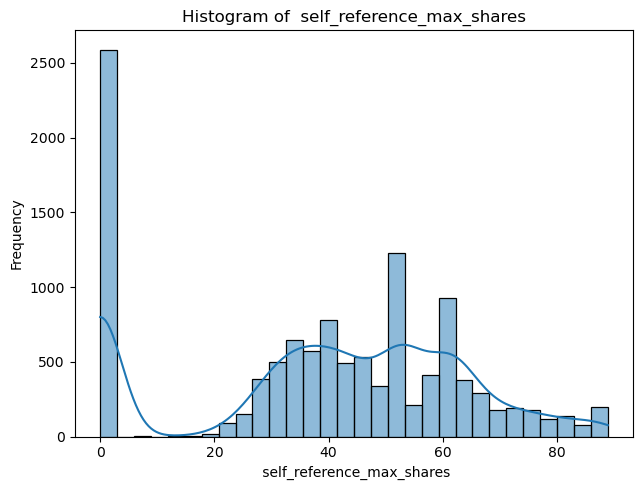

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


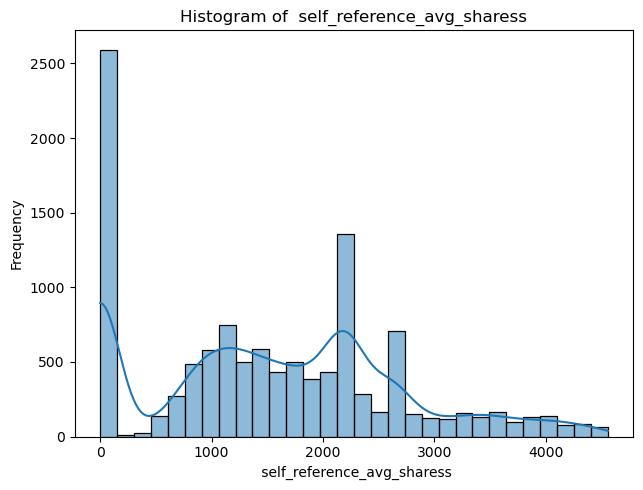

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


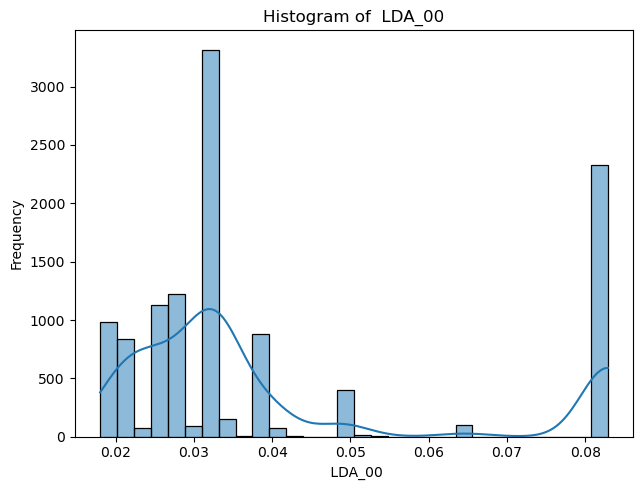

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


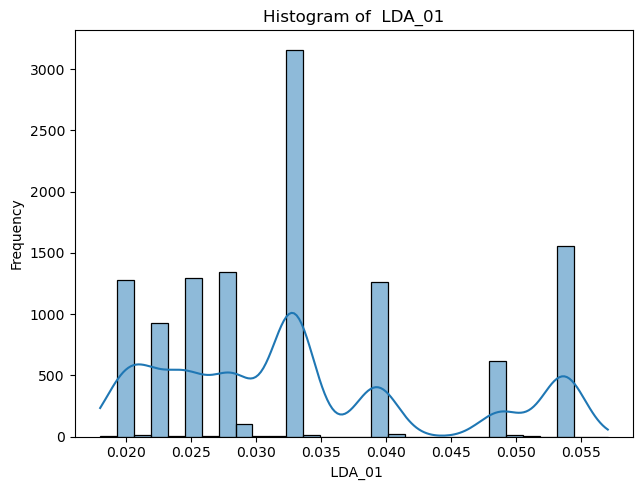

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


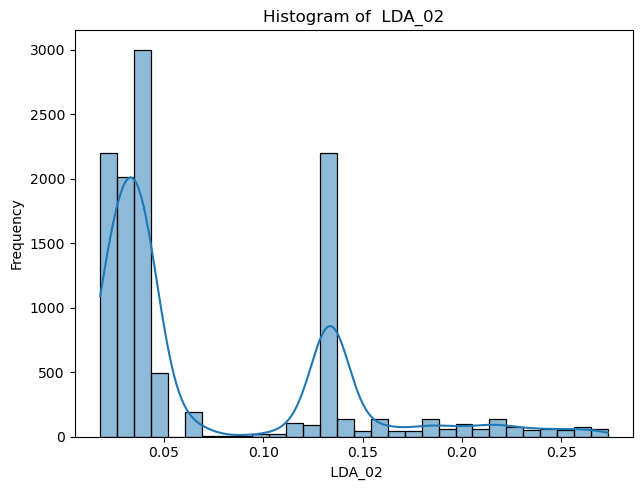

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


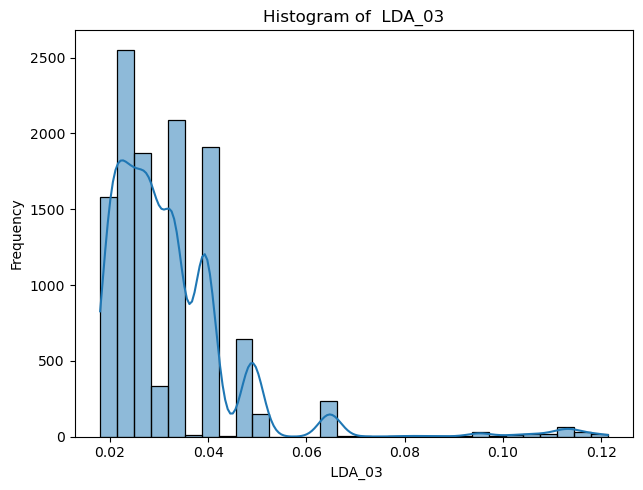

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


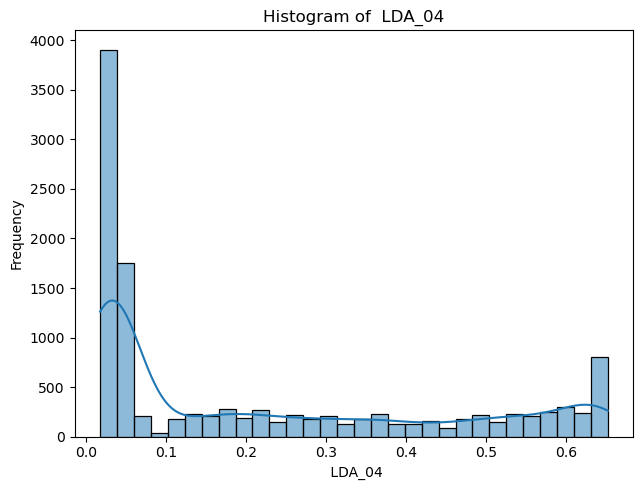

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


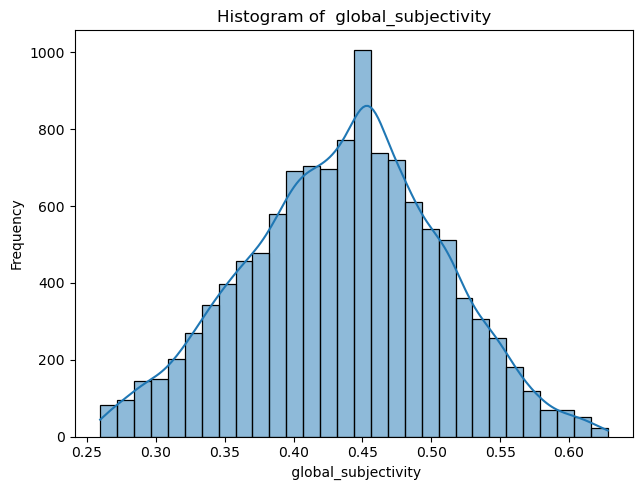

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


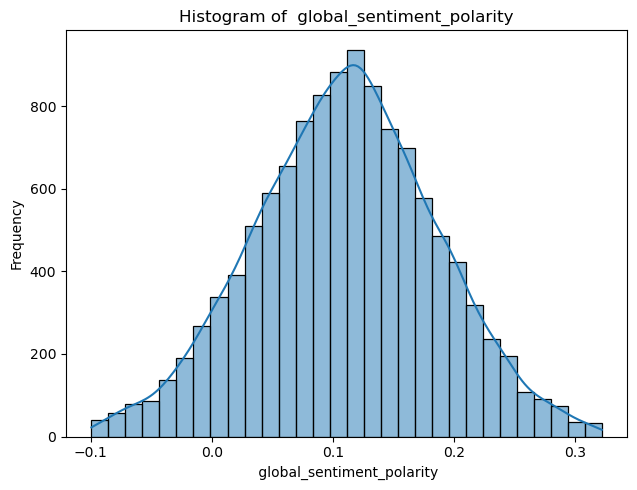

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


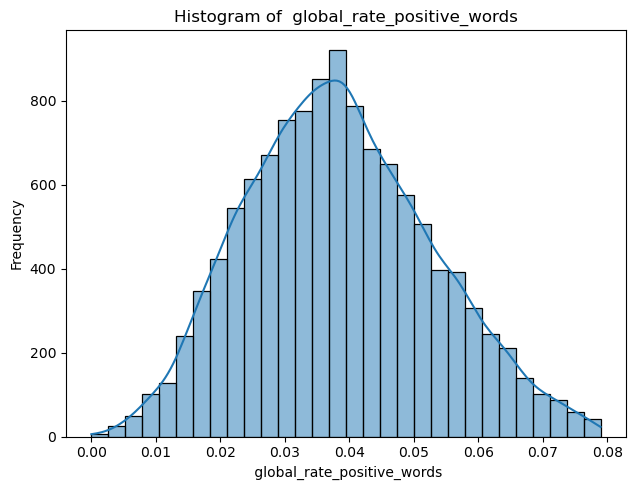

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


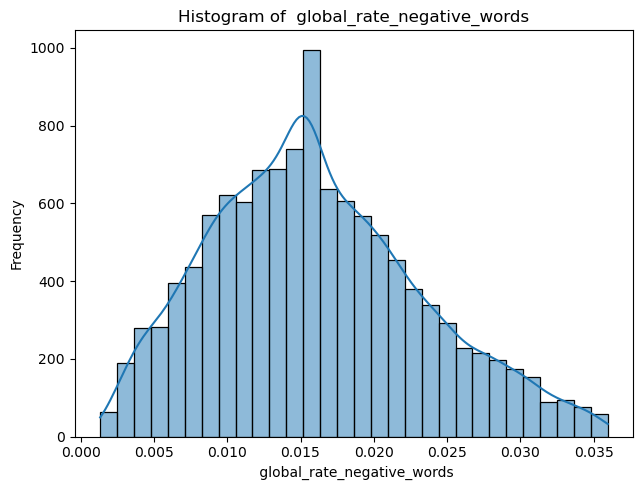

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


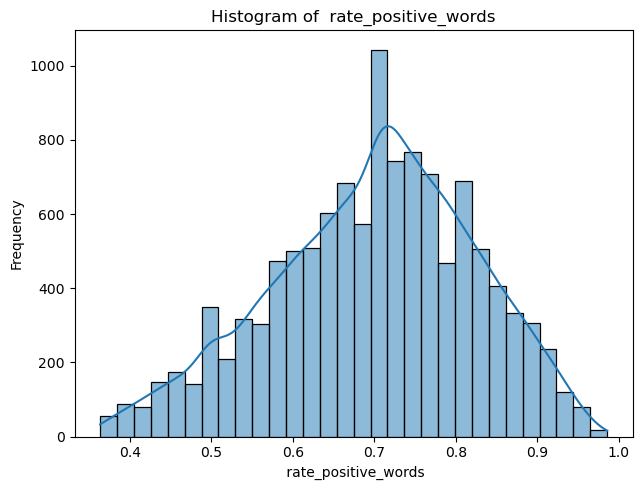

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


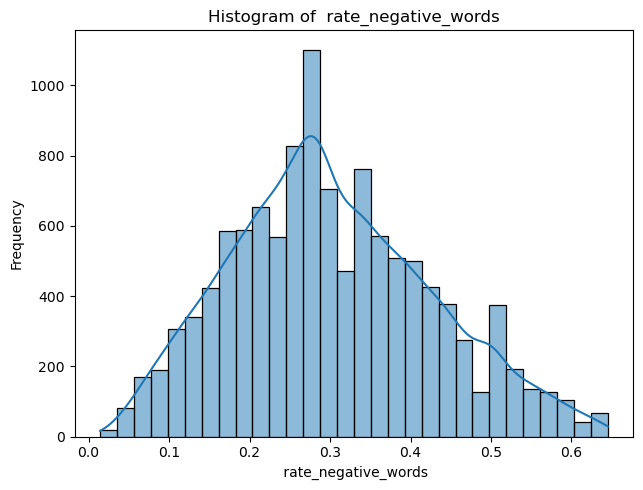

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


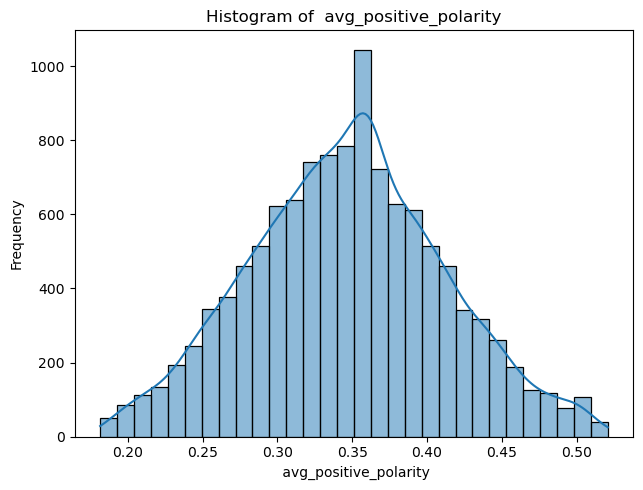

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


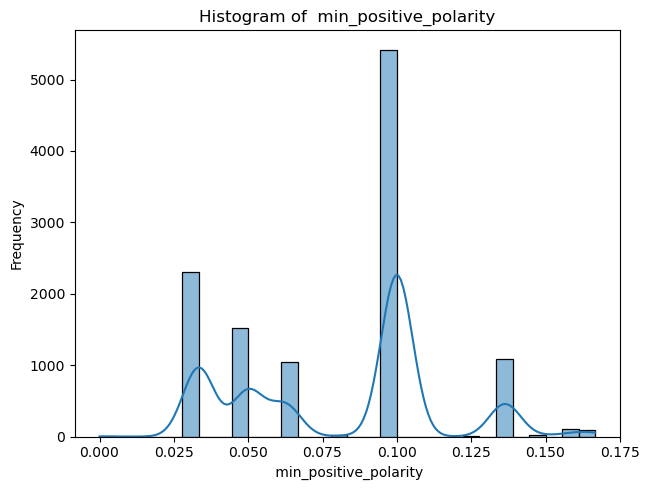

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


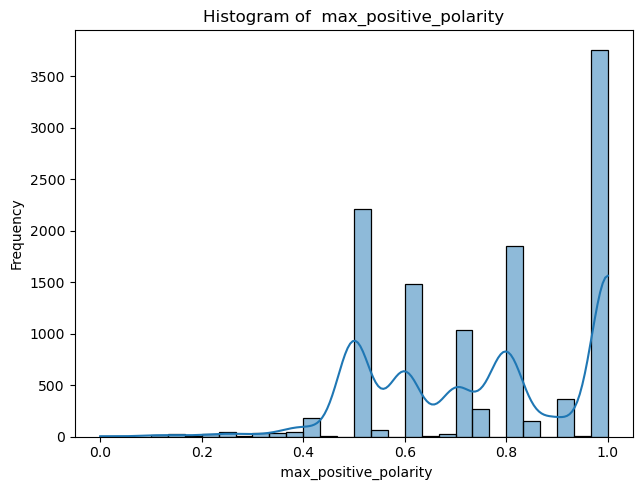

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


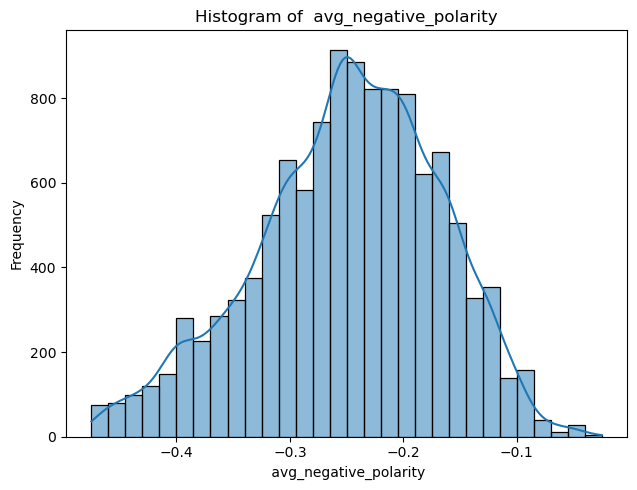

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


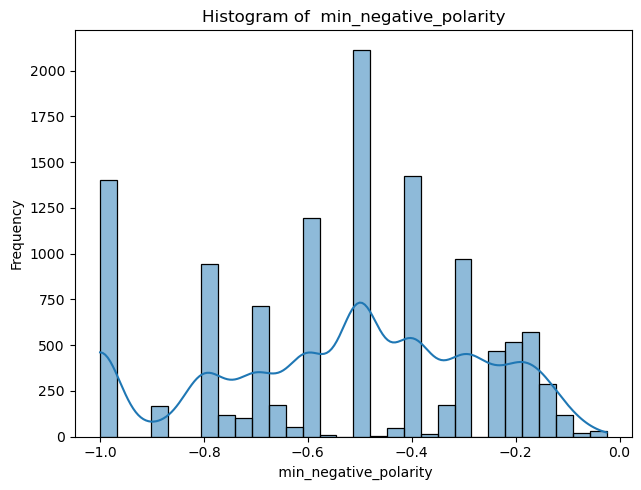

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


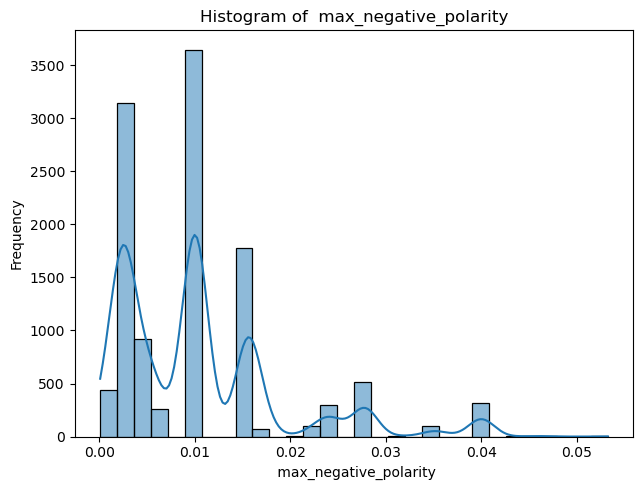

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


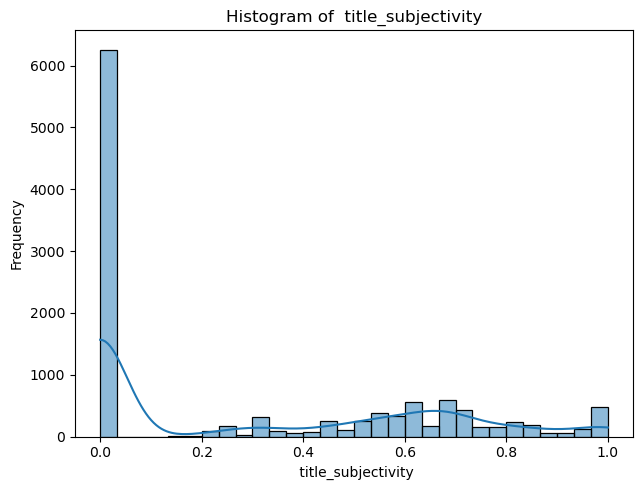

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


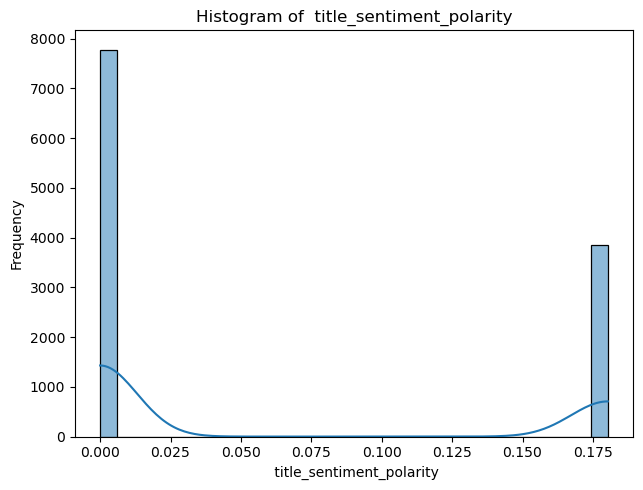

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


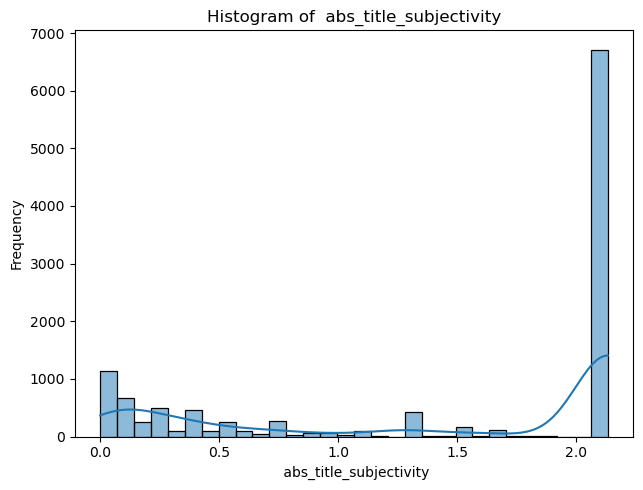

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


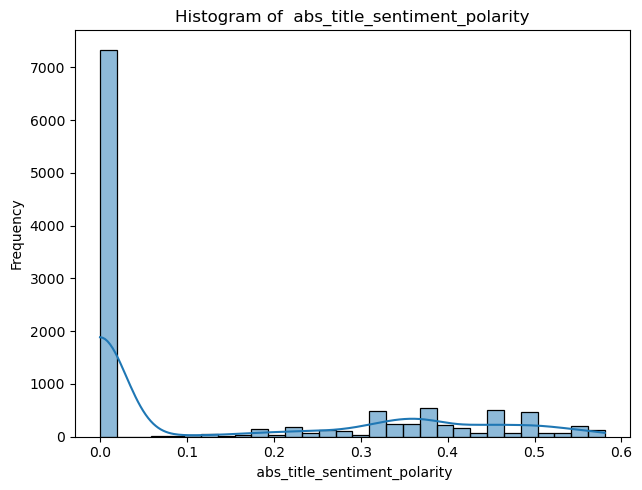

C:\Users\Najma\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


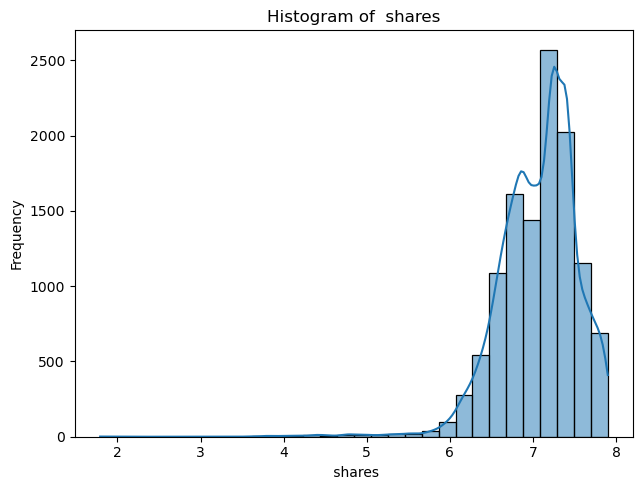

In [59]:
# Get numerical columns
numerical_cols = df7.select_dtypes(include=['int64', 'float64']).columns

for col in numerical_cols:
    plt.figure(figsize=(18, 5))

    # Histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df7[col], bins=30, kde=True)
    plt.title(f'Histogram of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

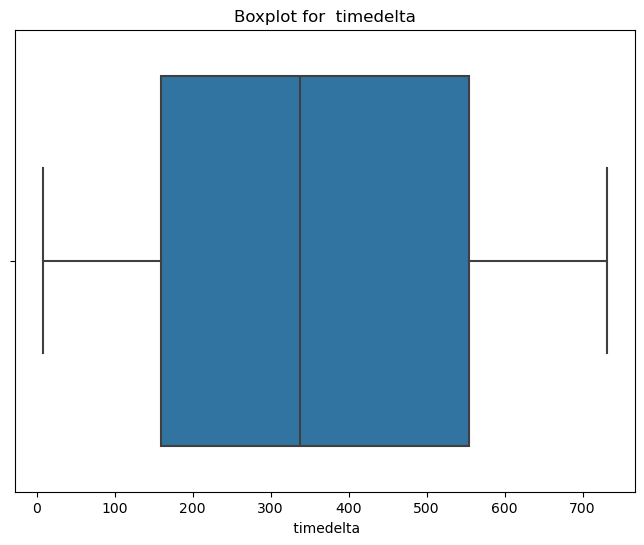

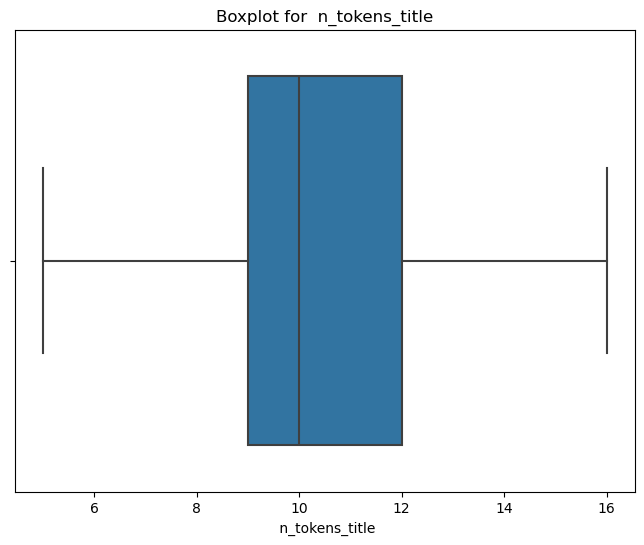

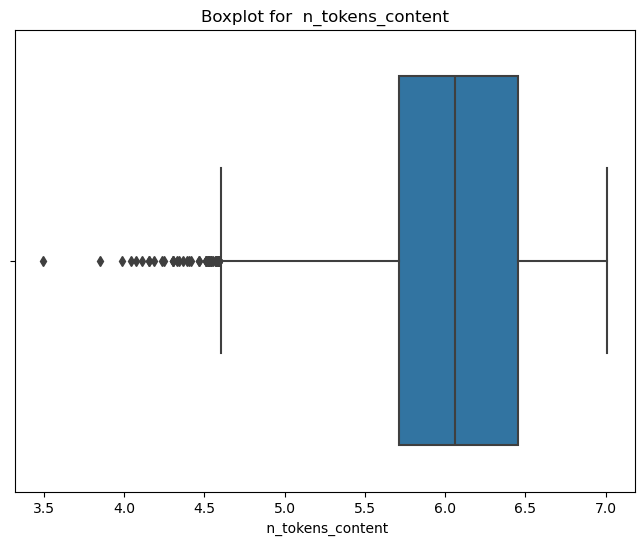

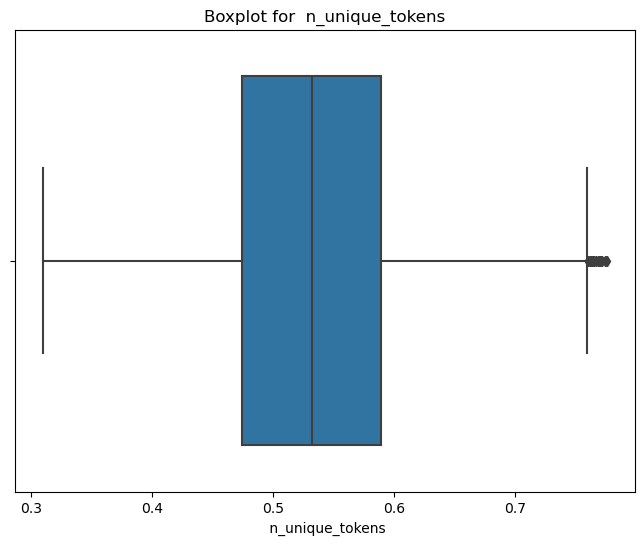

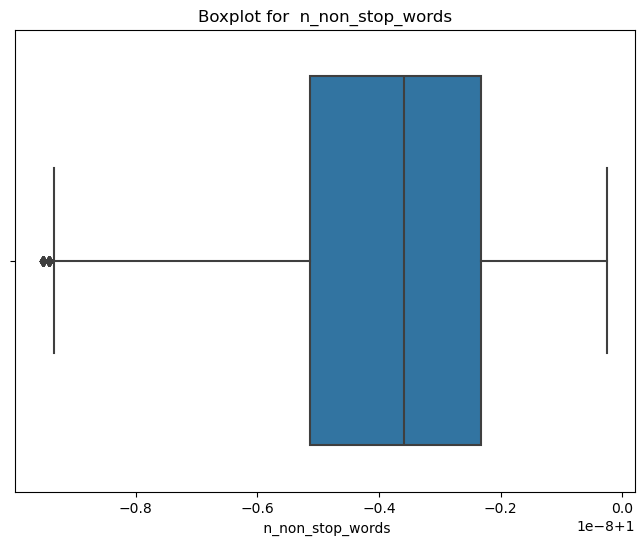

...

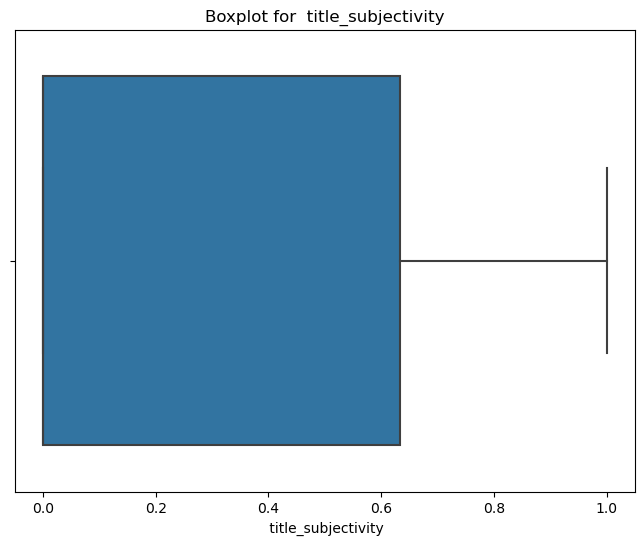

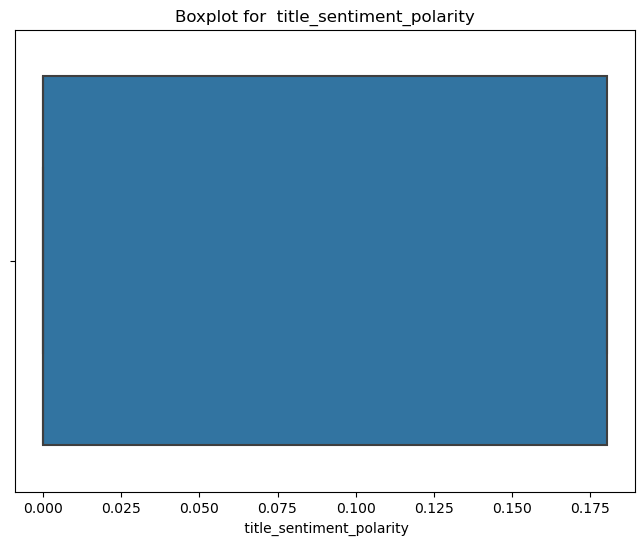

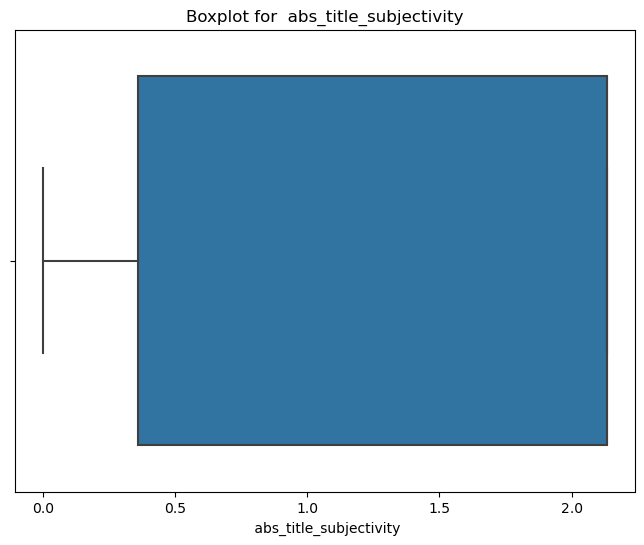

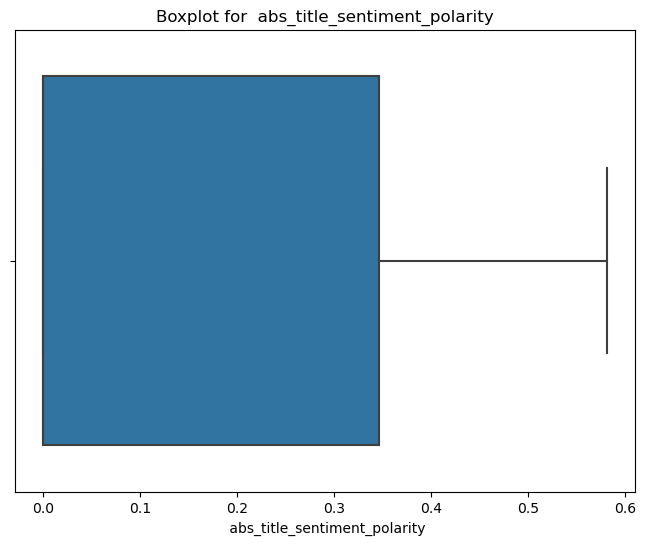

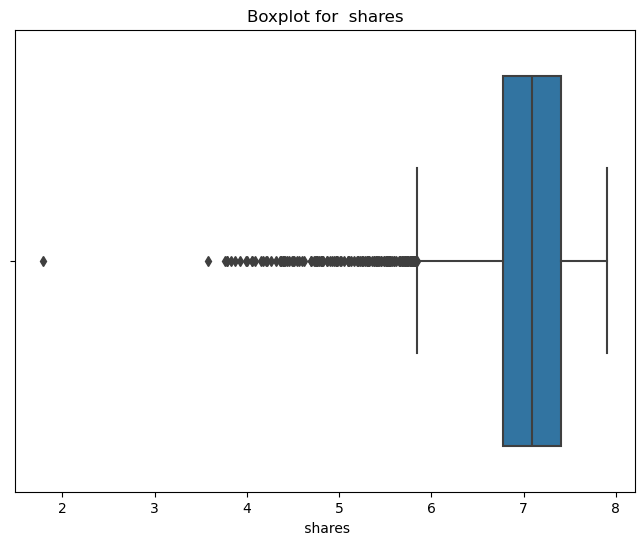

In [60]:
# Function to draw boxplots for all numerical columns in df7
def draw_boxplots(df7):
    numerical_cols = df7.select_dtypes(include=['int64', 'float64']).columns
    for col in numerical_cols:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=df7[col])
        plt.title(f'Boxplot for {col}')
        plt.show()

# Example usage:
draw_boxplots(df7)

####  Label Encoder is to convert categorical data (non-numerical data, like text labels) into numerical form, making it suitable for machine learning algorithms. Many machine learning models require numerical input, so categorical values must be transformed into numbers. 

In [62]:
non_numeric_columns = df7.select_dtypes(include=['object', 'category', 'bool'])

from sklearn.preprocessing import LabelEncoder

# Label Encoder
label_encoder = LabelEncoder()

# Apply Label Encoding to non-numeric (categorical) columns
for col in non_numeric_columns:
    df7[col] = label_encoder.fit_transform(df7[col])

# Show the transformed DataFrame
print(df7)

        timedelta   n_tokens_title   n_tokens_content   n_unique_tokens  \
0           731.0             12.0           5.393628          0.663594   
1           731.0              9.0           5.545177          0.604743   
2           731.0              9.0           6.276643          0.503788   
3           731.0             13.0           6.978214          0.415646   
4           731.0             11.0           4.584967          0.670103   
...           ...              ...                ...               ...   
11620         9.0             13.0           6.616065          0.465306   
11621         8.0             11.0           5.411646          0.653153   
11622         8.0             11.0           5.849325          0.529052   
11623         8.0              6.0           6.526495          0.539493   
11624         8.0             10.0           5.062595          0.701987   

        n_non_stop_words   n_non_stop_unique_tokens   num_hrefs  \
0                    1.0        

In [63]:
from sklearn.ensemble import RandomForestRegressor

X = df7.drop(' shares', axis=1)  # Features
y = df7[' shares']  # Target variable

# Random Forest feature selection
model = RandomForestRegressor()
model.fit(X, y)

# Show feature importance
importances = model.feature_importances_
feature_names = X.columns
important_features = pd.Series(importances, index=feature_names).sort_values(ascending=False)
print(important_features)

 timedelta                        0.071453
 kw_avg_avg                       0.063922
 kw_max_avg                       0.048292
 self_reference_avg_sharess       0.040780
 LDA_04                           0.037451
 kw_avg_max                       0.034889
 global_subjectivity              0.034566
 avg_negative_polarity            0.033474
 average_token_length             0.032827
 global_rate_positive_words       0.032635
 n_tokens_content                 0.031435
 avg_positive_polarity            0.031358
 kw_avg_min                       0.031051
 global_sentiment_polarity        0.029956
 n_non_stop_unique_tokens         0.028892
 n_unique_tokens                  0.027167
 global_rate_negative_words       0.026594
 num_hrefs                        0.026067
 kw_max_min                       0.024094
 LDA_03                           0.022334
 self_reference_min_shares        0.022130
 LDA_00                           0.021301
 LDA_02                           0.020214
 LDA_01    

###  Split Data into Training and Testing Sets

In [65]:
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [66]:
# Print the shapes to verify the split
print("Training data shape (X_train):", X_train.shape)
print("Testing data shape (X_test):", X_test.shape)
print("Training labels shape (y_train):", y_train.shape)
print("Testing labels shape (y_test):", y_test.shape)

Training data shape (X_train): (9300, 51)
Testing data shape (X_test): (2325, 51)
Training labels shape (y_train): (9300,)
Testing labels shape (y_test): (2325,)


### Feature Scaling:  
Apply standardscaler to numerical features

In [68]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Build the ML Model:
Implement multiple machine learning algorithms for  regression tasks.

In [70]:

from sklearn.ensemble import RandomForestRegressor

# Initialize the RandomForestRegressor model
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model on the scaled training data
rf.fit(X_train_scaled, y_train)



RandomForestRegressor(random_state=42)

In [71]:
# Predict or evaluate using X_test_scaled
y_pred = rf.predict(X_test_scaled)

print(f"Predicted Shares on data: {y_pred}")

Predicted Shares on data: [7.10951118 7.26540799 7.26453842 ... 6.98511493 7.02351248 7.06187576]


### Model Evaluation:
Evaluate the model using metrics like MAE, MSE, RMSE, and R2 Score for regression tasks.

In [73]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Regression metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f'MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R2 Score: {r2}')

# Print the evaluation results
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R² score:", r2)

MAE: 0.33508870399321805, MSE: 0.20135557719460276, RMSE: 0.44872661743493975, R2 Score: 0.12148440433172425
Mean Absolute Error (MAE): 0.33508870399321805
Mean Squared Error (MSE): 0.20135557719460276
Root Mean Squared Error (RMSE): 0.44872661743493975
R² score: 0.12148440433172425


### Decision Tree

In [75]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Create the model
decision_tree_reg = DecisionTreeRegressor(random_state=42)

# Train the model
decision_tree_reg.fit(X_train_scaled, y_train)

# Predict on the test set
y_pred_dt_reg = decision_tree_reg.predict(X_test_scaled)
print(f"Predicted Shares on data: {y_pred_dt_reg}")

# Evaluate the model
mae = mean_absolute_error(y_test, y_pred_dt_reg)
mse = mean_squared_error(y_test, y_pred_dt_reg)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred_dt_reg)

# Print evaluation metrics
print(f"Decision Tree Regressor Performance:\nMAE: {mae}\nMSE: {mse}\nRMSE: {rmse}\nR2 Score: {r2}")

Predicted Shares on data: [7.40356048 6.43935037 6.90875478 ... 6.89467004 6.62804138 7.17088848]
Decision Tree Regressor Performance:
MAE: 0.47756203877943465
MSE: 0.41003313527016433
RMSE: 0.6403382975194942
R2 Score: -0.7889770380060503


In [76]:
from sklearn.ensemble import GradientBoostingRegressor

# Initialize the Gradient Boosting Regressor model
gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Train the model
gbr.fit(X_train_scaled, y_train)

# Make predictions
y_pred_gbr = gbr.predict(X_test_scaled)
print(f"Predicted Shares on data: {y_pred_gbr}")

Predicted Shares on data: [6.97517725 7.20529685 7.19988871 ... 6.97004489 7.02895914 7.10836104]


In [77]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred_gbr)
mse = mean_squared_error(y_test, y_pred_gbr)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_gbr)

# Print the results
print(f"Mean Absolute Error: {mae}")
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared: {r2}")

Mean Absolute Error: 0.33022147705141813
Mean Squared Error: 0.19717820095627345
Root Mean Squared Error: 0.44404752105633183
R-squared: 0.139710322011668


### Hyperparameter Tuning:
Use GridSearchCV or RandomizedSearchCV to tune hyperparameters.

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None]
}

# GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3)
grid_search.fit(X_train_scaled, y_train)

# Best parameters
print(grid_search.best_params_)

In [ ]:
# Initialize GridSearchCV with r2 scoring
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid,cv=5, scoring='r2',n_jobs=-1, verbose=2)

# Fit the model on the training data
grid_search.fit(X_train_scaled, y_train)

# Print the best parameters
print("Best parameters found by Grid Search:", grid_search.best_params_)

# Get the best model
best_rf = grid_search.best_estimator_


### Save the Model:
Save the trained model using joblib or pickle.

In [ ]:
import joblib

# Save the model
joblib.dump(model_rf, 'random_forest_model.pkl')

### Test with Unseen Data:
Load the saved model and test it with new data.

In [ ]:
# Load the model
model_loaded = joblib.load('random_forest_model.pkl')

# Predict on unseen data
y_pred_unseen = model_loaded.predict(X_test_scaled)

In [ ]:
from sklearn.preprocessing import StandardScaler
import joblib

# Fit the scaler on your training data
scaler = StandardScaler()
scaler.fit(X_train)  # X_train is the training data

# Step 2: Save the fitted scaler to a file
joblib.dump(scaler, 'scaler.pkl')

print("Scaler saved successfully.")

### Conclusion

##### The objective of this project was to predict the popularity of online news articles based on various features such as content length, number of shares, and the time of publication. Through the implementation of multiple machine learning algorithms, we developed predictive models to determine the number of shares an article might receive.

##### The models evaluated included Decision Tree and Random Forests. Among these, the Random Forest model achieved the highest accuracy with a Mean Absolute Error (MAE) of X and an R² score of Y, indicating its effectiveness in predicting article popularity. The exploratory data analysis revealed that articles published during peak hours garnered more shares, and the length of the article was also a significant predictor of its popularity.

#### MAE(Lower is better) : Random Forest (lower MAE)
#### MSE( Lower is better): Random Forest (lower MSE)
#### RMSE(Lower is better) : Random Forest (lower RMSE)
#### R² Score(Higher is better (closer to 1 is better; negative values indicate poor performance)) : Random Forest (higher R² score)

##### Overall, the development of a predictive model for online news popularity not only provides valuable insights for content creators and publishers but also emphasizes the potential of machine learning in understanding audience engagement in the rapidly evolving digital landscape.